# Reduce data from various CAL programs

- **CAL-1125** : Fixed-slit wavelength calibration of LMC PNe SMP-LMC68
- **CAL-1128** : Fixed-slit flux calibration of "tyc4433 / 1808347"
    - S200A1 all gratings *but* G140M-F100LP
    - S1600A1 all gratings + filters
- **CAL-1487**: Fixed-slit flux calibration of J1743045
    - S200A1 prism & F140M-F100LP

In [42]:
# Quiet!
import warnings
import os
warnings.filterwarnings("ignore")

HOME = os.getcwd()
os.chdir(os.path.join(HOME, '../data'))


In [43]:
import os
if 'CRDS_PATH' not in os.environ is None:
    os.environ['CRDS_PATH'] = f'{os.getcwd()}/crds_cache'

    if not os.path.exists(os.environ['CRDS_PATH']):
        os.makedirs(os.environ['CRDS_PATH'])

    os.environ['CRDS_SERVER_URL'] = 'https://jwst-crds.stsci.edu'

In [44]:
if os.environ['MAST_TOKEN'] is None:
    print('The MAST_TOKEN environment variable must be set to download proprietary data!')
else:
    print('MAST_TOKEN found.')

MAST_TOKEN found.


In [45]:
import os
import glob
import yaml
import warnings

import numpy as np
import matplotlib.pyplot as plt

import grizli
from grizli import utils, jwst_utils
jwst_utils.set_quiet_logging()
utils.set_warnings()

import astropy.io.fits as pyfits
from jwst.datamodels import SlitModel
import glob
import jwst.datamodels

import msaexp
from msaexp import pipeline
import msaexp.slit_combine

from scipy.optimize import nnls

from importlib import reload

print(f'grizli version = {grizli.__version__}')
print(f'msaexp version = {msaexp.__version__}')

grizli version = 1.12.9.dev18+ge21bf3a.d20241025
msaexp version = 0.9.2.dev10+gba717fa.d20241107


# Extend reference files

Now implemented in `msaexp.pipeline_extended`.

In [46]:
import jwst.datamodels
NIRSPEC_CRDS = os.path.join(os.getenv('CRDS_PATH'), 'references/jwst/nirspec')

## `wavelengthrange`

In [47]:
ref_file = 'jwst_nirspec_wavelengthrange_0008.asdf'
waverange = jwst.datamodels.open(os.path.join(NIRSPEC_CRDS, ref_file))

waverange.info()

root (AsdfObject)
├─asdf_library (Software)
│ ├─author (str): The ASDF Developers
│ ├─homepage (str): http://github.com/asdf-format/asdf
│ ├─name (str): asdf
│ └─version (str): 2.14.3
├─history (dict)
│ ├─entries (list) ...
│ └─extensions (list) ...
├─meta (dict)
│ ├─author (str): p_generateReferenceFile_20160722.py - version 1.0.0
│ ├─date (str): 2023-07-28T17:58:39.884
│ ├─description (str): model v7.3.1 commissioning, updated IFU TA pt src centering
│ ├─exposure (dict) ...
│ ├─instrument (dict) ...
│ ├─model_type (str): WavelengthrangeModel
│ ├─pedigree (str): INFLIGHT 2022-04-01 2022-06-01
│ ├─reftype (str): wavelengthrange
│ ├─telescope (str): JWST
│ └─2 not shown
├─order (list) ...
├─wavelengthrange (list) ...
└─waverange_selector (list) ...
Some nodes not shown.


In [48]:
so = np.argsort(waverange.waverange_selector)

for i in so:
    key = waverange.waverange_selector[i]
    spl = key.split('_')
    if (spl[0] in ['CLEAR','FLAT1','FLAT2','FLAT3','LINE1','LINE2','LINE3','REF','TEST']) & (key != 'CLEAR_PRISM'):
        continue
    if ('H' in spl[1]) | (spl[1] == 'MIRROR') | (key == 'F100LP_PRISM'):
        continue
        
    print(f"{i:>2} {waverange.waverange_selector[i]:>16} {waverange.order[i]:>3}   {waverange.wavelengthrange[i][0]*1.e6:.1f}  -  {waverange.wavelengthrange[i][1]*1.e6:.1f}")

11      CLEAR_PRISM   0   0.6  -  5.3
10     F070LP_G140M  -1   0.7  -  1.3
 5     F100LP_G140M  -1   1.0  -  1.9
15     F170LP_G235M  -1   1.7  -  3.2
 1     F290LP_G395M  -1   2.9  -  5.3


# Flat tables

Get various 1D "fast variation" curves from CRDS reference files.

In [942]:
crds_path = '/Users/gbrammer/Research/grizli/crds_cache/references/jwst/nirspec/'

flats = glob.glob('*[d]flat*ext.fits')
flats.sort()

for flat in flats:
    with pyfits.open(crds_path + flat.replace('_ext','')) as im:
        h = im[0].header
        label = f'{h["DETECTOR"]}'
        flat_type = 'dflat'
            
        for i in range(4):
            k = ('FAST_VARIATION', i+1)
            if k in im:
                full_label = f"{label}_{i+1}"
                tab = utils.GTable(im[k].data)
                
                out = flat.replace('ext', full_label)
                print(out, len(tab))
                tab.write(out, overwrite=True)

flats = glob.glob('*[fs]flat*ext.fits')
flats.sort()

for flat in flats:
    with pyfits.open(crds_path + flat.replace('_ext','')) as im:
        h = im[0].header
        label = f'{h["EXP_TYPE"].split("_")[1]}_{h["GRATING"]}_{h["FILTER"]}'
        key = label + ''
        
        if "DETECTOR" in h:
            label += f'_{h["DETECTOR"]}'
            flat_type = 'sflat'
        else:
            flat_type = 'fflat'
            
        for i in range(4):
            k = ('FAST_VARIATION', i+1)
            if k in im:
                full_label = f"{label}_{i+1}"
                tab = utils.GTable(im[k].data)
                
                out = flat.replace('ext', full_label)
                print(out, len(tab))
                tab.write(out, overwrite=True)


jwst_nirspec_dflat_0001_NRS1_1.fits 1
jwst_nirspec_dflat_0002_NRS2_1.fits 1
jwst_nirspec_fflat_0097_FIXEDSLIT_G140M_F100LP_1.fits 5
jwst_nirspec_fflat_0127_FIXEDSLIT_G140M_F070LP_1.fits 5
jwst_nirspec_fflat_0128_FIXEDSLIT_G235M_F170LP_1.fits 5
jwst_nirspec_fflat_0129_FIXEDSLIT_G395M_F290LP_1.fits 5
jwst_nirspec_fflat_0130_FIXEDSLIT_PRISM_CLEAR_1.fits 5
jwst_nirspec_fflat_0131_FIXEDSLIT_G140H_F070LP_1.fits 5
jwst_nirspec_fflat_0132_FIXEDSLIT_G235H_F170LP_1.fits 5
jwst_nirspec_fflat_0133_FIXEDSLIT_G140H_F100LP_1.fits 5
jwst_nirspec_fflat_0134_FIXEDSLIT_G395H_F290LP_1.fits 5
jwst_nirspec_fflat_0136_MSASPEC_G140H_F100LP_1.fits 1
jwst_nirspec_fflat_0136_MSASPEC_G140H_F100LP_2.fits 1
jwst_nirspec_fflat_0136_MSASPEC_G140H_F100LP_3.fits 1
jwst_nirspec_fflat_0136_MSASPEC_G140H_F100LP_4.fits 1
jwst_nirspec_fflat_0137_MSASPEC_G395H_F290LP_1.fits 1
jwst_nirspec_fflat_0137_MSASPEC_G395H_F290LP_2.fits 1
jwst_nirspec_fflat_0137_MSASPEC_G395H_F290LP_3.fits 1
jwst_nirspec_fflat_0137_MSASPEC_G395H_F290L

(0.0, 50.0)

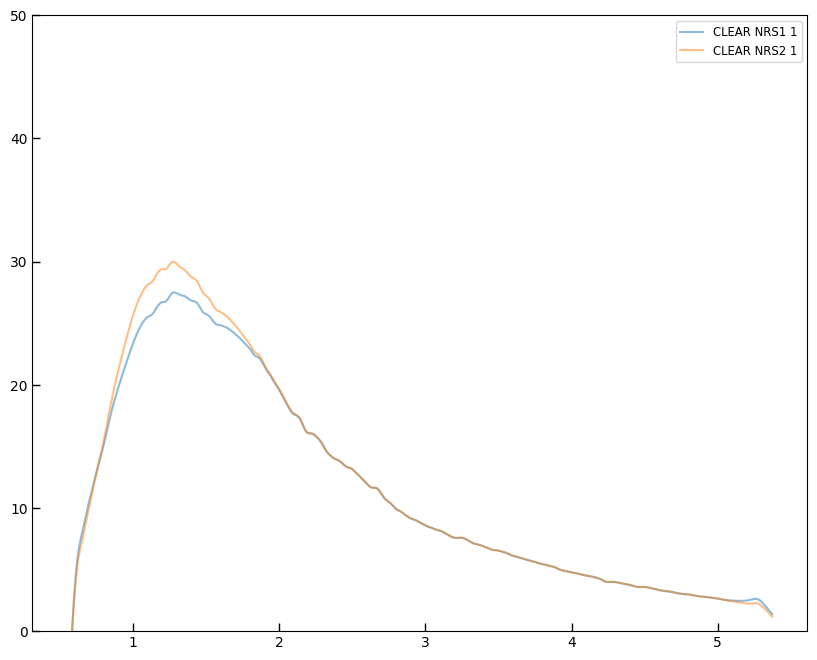

In [50]:
mode = 'MSASPEC'
# mode = 'FIXEDSLIT'

filter = 'CLEAR'

fig, ax = plt.subplots(1,1,figsize=(10,8))

my_files = glob.glob(f'*_s1600*sensi*{filter}*M.fits')
for f in my_files:
    sens = utils.read_catalog(f)
    plt.plot(sens["wavelength"], sens["sensitivity"], label=f, alpha=0.1)
    
# print(mine)
for det in ['NRS1','NRS2']:

    dflat_file = glob.glob(f'*dflat*{det}*fits')[0]
    df = utils.read_catalog(dflat_file)[0]
    
    sflat_file = glob.glob(f'*sflat*{mode}*{filter}*{det}*fits')[0]
    sf = utils.read_catalog(sflat_file)[0]

    sf["data"] /= 5.e-10
    sfo = sf['wavelength'] > 0
    
    for i in range(1):
        fflat_file = glob.glob(f'*fflat*{mode}*{filter}*{i+1}*fits')[0]
        # print(sflat_file, fflat_file)
        ff = utils.read_catalog(fflat_file)[0]
        ff["data"] /= 2.e20
        ffo = ff['wavelength'] > 0


        pixarr_sr = 1. #4.8e-13
        
        sfi = np.interp(ff['wavelength'], sf['wavelength'][sfo], sf['data'][sfo])
        plt.plot(ff['wavelength'][ffo], (ff['data']*sfi * pixarr_sr)[ffo], label=f"{filter} {det} {i+1}", alpha=0.5)
        # plt.plot(ff['wavelength'], ff['data'], label=f"{filter} {det} {i+1}", alpha=0.5)
        # plt.plot(sf['wavelength'], sf['data'], label=f"{filter} {det} {i+1}", alpha=0.5)

plt.legend()
plt.ylim(0, 50)



# CALSPEC reference spectra

In [51]:
import astropy.units as u
import eazy.templates

CALSPEC = "https://archive.stsci.edu/hlsps/reference-atlases/cdbs/current_calspec/"

# 1808347 / TYC4433
calspec = utils.read_catalog(CALSPEC + '1808347_mod_007.fits')
calspec['wave'] = calspec['WAVELENGTH'] / 1.e4
calspec['fnu'] = (calspec['FLUX'].data*u.erg/u.second/u.cm**2/u.Angstrom).to(
    u.microJansky, equivalencies=u.spectral_density(calspec['wave'].data*u.micron)
)
ctempl_tyc4433 = eazy.templates.Template(
    arrays=(calspec['wave'].data*1.e4, calspec['fnu'].data*(calspec['wave'].data*1.e4)**-2*3e18),
    name='CALSPEC 1808347_mod_005'
)

# 1743045
calspec = utils.read_catalog(CALSPEC + '1743045_mod_007.fits')
calspec['wave'] = calspec['WAVELENGTH'] / 1.e4
calspec['fnu'] = (calspec['FLUX'].data*u.erg/u.second/u.cm**2/u.Angstrom).to(
    u.microJansky, equivalencies=u.spectral_density(calspec['wave'].data*u.micron)
)
ctempl_j1743 = eazy.templates.Template(
    arrays=(calspec['wave'].data*1.e4, calspec['fnu'].data*(calspec['wave'].data*1.e4)**-2*3e18),
    name='CALSPEC 1743045_mod_007'
)

# P330E
calspec = utils.read_catalog(CALSPEC + 'p330e_mod_008.fits')
calspec['wave'] = calspec['WAVELENGTH'] / 1.e4
calspec['fnu'] = (calspec['FLUX'].data*u.erg/u.second/u.cm**2/u.Angstrom).to(
    u.microJansky, equivalencies=u.spectral_density(calspec['wave'].data*u.micron)
)
ctempl_p330e = eazy.templates.Template(
    arrays=(calspec['wave'].data*1.e4, calspec['fnu'].data*(calspec['wave'].data*1.e4)**-2*3e18),
    name='CALSPEC p330e_mod_008'
)

# NGC2506 G31
calspec = utils.read_catalog(CALSPEC + 'ngc2506g31_mod_005.fits')
calspec['wave'] = calspec['WAVELENGTH'] / 1.e4
calspec['fnu'] = (calspec['FLUX'].data*u.erg/u.second/u.cm**2/u.Angstrom).to(
    u.microJansky, equivalencies=u.spectral_density(calspec['wave'].data*u.micron)
)
ctempl_ngc2506 = eazy.templates.Template(
    arrays=(calspec['wave'].data*1.e4, calspec['fnu'].data*(calspec['wave'].data*1.e4)**-2*3e18),
    name='CALSPEC ngc2506g31_mod_005'
)
    

# Set CAL program

Various calibration programs for PSF model and flux calibration

- Start with 1128 S200A1 and 1487 S200A1 for PSF

In [405]:
os.getcwd()

'/Users/gbrammer/Research/JWST/Projects/NIRSpec/msaexp-calibration/data'

In [948]:
import mastquery.jwst

gratings = ['prism', 'g140m', 'g235m', 'g395m'][:]
gratings = ['prism', 'g140m', 'g235m', 'g395m', 'g140h', 'g235h', 'g395h'][:]

ctempl = ctempl_tyc4433
if 0:
    ## GO brown dwarf
    prog = 1189
    extra = mastquery.jwst.make_query_filter('apername', values=['NRS_S200A1_SLIT'])
    extra += mastquery.jwst.make_query_filter('targprop', values=['J03480772-6022270'])
    out_prefix = 'bd-j0348'

elif 0:
    # ## PN
    prog = 1125
    extra = mastquery.jwst.make_query_filter('apername', values=['NRS_S200A1_SLIT'])
    out_prefix = 'smp58b'

    if 0:
        ## More PN
        prog = 1492
        # extra = mastquery.jwst.make_query_filter('apername', values=['NRS_S1600A1_SLIT'])
        extra = mastquery.jwst.make_query_filter('apername', values=['NRS_S200A1_SLIT'])
        out_prefix = 'smp58'

# elif 1:
#     # TYC4433 MSA
    
#     prog = 1128.1
#     extra = mastquery.jwst.make_query_filter('apername', values=['NRS_FIELD1_MSA4', 'NRS_FULL_MSA'])
#     # extra = mastquery.jwst.make_query_filter('apername', values=['NRS_S200A2_SLIT'])
#     # extra = mastquery.jwst.make_query_filter('apername', values=['NRS_S1600A1_SLIT'])
#     extra += mastquery.jwst.make_query_filter('targprop', values=['1808347'])
#     gratings = ['prism', 'g140m', 'g235m', 'g395m', 'g140h', 'g235h', 'g395h'][:]

#     ctempl = ctempl_tyc4433
#     out_prefix = 'tyc4433-msa'
        
elif 0:
    # GO white dwarf for test
    prog = 3786.1
    extra = mastquery.jwst.make_query_filter('apername', values=['NRS_S200A1_SLIT'])
    extra += mastquery.jwst.make_query_filter('targprop', values=['1814-7354'])
    out_prefix = 'wd-1814-7354'
    
    # extra = mastquery.jwst.make_query_filter('apername', values=['NRS_S200A1_SLIT'])
    # extra += mastquery.jwst.make_query_filter('targprop', values=['0420-731'])
    # out_prefix = 'wd-0420-731'
    # prog = 3786.2

    prog = 3786.3
    extra = mastquery.jwst.make_query_filter('apername', values=['NRS_S200A1_SLIT'])
    extra += mastquery.jwst.make_query_filter('targprop', values=['0611-6931'])
    out_prefix = 'wd-0611-6931'

    
    
    pass
    
elif 0:
    # # Also 173045
    # prog = 4460
    # extra = mastquery.jwst.make_query_filter('targprop', values=['1743045'])
    # extra += mastquery.jwst.make_query_filter('apername', values=['NRS_S200A1_SLIT'])
    # extra += mastquery.jwst.make_query_filter('xoffset', range=[-0.01, 0.01])
    
    #### another program that's not saturated, includes f100lp
    prog = 1487
    gratings = ['prism', 'g140m', 'g235m', 'g395m'] #[:2]
    extra = mastquery.jwst.make_query_filter('apername', values=['NRS_S200A1_SLIT'])
    extra += mastquery.jwst.make_query_filter('targprop', values=['1743045'])
    out_prefix = 'j1743045-cal1487'

    if 0:
        prog = 1536
        gratings = ['prism', 'g140m', 'g235m', 'g395m'][:]
        extra = mastquery.jwst.make_query_filter('apername', values=['NRS_S1600A1_SLIT'])
        extra += mastquery.jwst.make_query_filter('targprop', values=['J1743045'])
        out_prefix = 'j1743045'

    ctempl = ctempl_j1743

elif 1:
    ## WD standard
    prog = 1128
    extra = mastquery.jwst.make_query_filter('apername', values=['NRS_S200A1_SLIT'])
    # extra = mastquery.jwst.make_query_filter('apername', values=['NRS_S200A2_SLIT'])
    # extra = mastquery.jwst.make_query_filter('apername', values=['NRS_S1600A1_SLIT'])
    extra += mastquery.jwst.make_query_filter('targprop', values=['1808347'])
    gratings = ['prism', 'g140m', 'g235m', 'g395m', 'g140h', 'g235h', 'g395h'][:]

    ctempl = ctempl_tyc4433
    out_prefix = 'tyc4433'

elif 0:
    # # WD standard P330E
    prog = 1538
    extra = mastquery.jwst.make_query_filter('apername', values=['NRS_S1600A1_SLIT'])
    extra += mastquery.jwst.make_query_filter('targprop', values=['P330E'])
    extra += mastquery.jwst.make_query_filter('subarray', values=['SUB512', 'SUB2048'])

    ctempl = ctempl_p330e
    out_prefix = 'p330e'


# gratings = ['prism', 'g140m', 'g235m', 'g395m'][:]
outroot = out_prefix
detectors = ['nrs1','nrs2']

print(f'program: {prog}\noutroot: {outroot}')

HOME = os.getcwd()

DO_RECALIBRATE = False


# Download the rate files again because the headers of the reprocessed files above aren't quite right
masks = pipeline.query_program(int(float(prog)), download=False, detectors=detectors, gratings=gratings,
                               extensions=['uncal','s2d'], 
                               extra_filters=extra)

if 1:
    masks = masks[np.abs(masks["xoffset"]) < 0.001]
    
slit_name = masks['apername'][0].split('_')[1].lower()
print('slit_name: ', slit_name)

un = utils.Unique(masks['grating'])
utils.Unique(masks['targprop'])
utils.Unique(masks['apername'])
utils.Unique(masks['subarray'])



program: 1128
outroot: tyc4433
slit_name:  s200a1
   N  value     
====  ==========
   9  G140H     
   3  G140M     
   6  G235H     
   3  G235M     
   6  G395H     
   3  G395M     
   3  PRISM     
   N  value     
====  ==========
  33  1808347   
   N  value     
====  ==========
  33  NRS_S200A1_SLIT
   N  value     
====  ==========
  33  SUBS200A1 


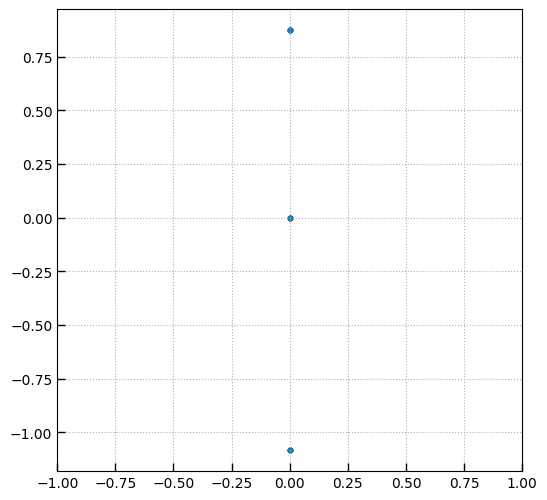

In [949]:
plt.scatter(masks['xoffset'], masks['yoffset'])

plt.xlim(-1,1)
# plt.ylim(-1,1)
plt.grid()


In [901]:
mastquery.utils.download_from_mast(masks['dataURI'].tolist())
mastquery.utils.download_from_mast([f.replace('nrs1','nrs2') for f in masks['dataURI'].tolist()])
if 0:
    mastquery.utils.download_from_mast(masks['msametfl'].tolist())


## Recalibrate saturated PRISM spectra

In [902]:
import grizli.aws.recalibrate

reprocess_files = np.isin(masks['targprop'], ['1743045','1808347'])
reprocess_files &= np.isin(masks['grating'], ['PRISM'])
reprocess_files &= np.isin(masks['apername'], ['NRS_S200A1_SLIT'])

if reprocess_files.sum() > 0:
    os.chdir(os.path.join(HOME, '../data/Recalibrate'))
    for f in masks['dataURI'][reprocess_files]:
        file = os.path.basename(f)
        print(file, os.path.exists(file))
        if (not os.path.exists(file)) & (0):
            grizli.aws.recalibrate.do_recalibrate(file, skip_snowblind_after='1.12', clean=True)

    os.chdir(os.path.join(HOME, '../data'))
    os.system('ln -sf Recalibrate/*rate.fits . ')

if 0:
    os.chdir(os.path.join(HOME, '../data'))
    files = glob.glob('*nrs1*rate.fits')
    os.chdir(os.path.join(HOME, '../data/Recalibrate'))
    files.sort()
    
    for file in files:
        test = True # not os.path.exists(file)
        with pyfits.open('../' + file) as im:
            h = im[0].header
            test &= h['GRATING'] == 'PRISM'
            test &= h['TARGPROP'] in ['1808347', '1743045']
            test &= h['APERNAME'] == 'NRS_S200A1_SLIT'

        if test & (not os.path.exists(file)):
            print(file, os.path.exists(file))
            grizli.aws.recalibrate.do_recalibrate(file, skip_snowblind_after='1.12', clean=True)

    os.chdir('/Users/gbrammer/Research/JWST/Projects/NIRSpec/cal-iras05248/Wavecal2024/')
    os.system('ln -sf Recalibrate/*rate.fits . ')

# os.chdir('/Users/gbrammer/Research/JWST/Projects/NIRSpec/cal-iras05248/Wavecal2024/')


In [903]:
utils.Unique(masks['targprop'])

   N  value     
====  ==========
  60  P330E     


In [904]:
# cfiles = glob.glob(f'jw0{prog}*rate.fits')
# cfiles = glob.glob('jw01189*_0[5]1*rate.fits')

cfiles = [f.replace('nrs1','nrs2') for f in masks['dataURI'].tolist()]
cfiles += [f.replace('nrs2','nrs1') for f in masks['dataURI'].tolist()]
cfiles = np.unique(cfiles).tolist()
cfiles = [os.path.basename(f) for f in cfiles]

cfiles.sort()
print(len(cfiles))
cfiles


90


['jw01538107001_04101_00001_nrs1_rate.fits',
 'jw01538107001_04101_00001_nrs2_rate.fits',
 'jw01538107001_04101_00002_nrs1_rate.fits',
 'jw01538107001_04101_00002_nrs2_rate.fits',
 'jw01538107001_04101_00003_nrs1_rate.fits',
 'jw01538107001_04101_00003_nrs2_rate.fits',
 'jw01538107001_04101_00004_nrs1_rate.fits',
 'jw01538107001_04101_00004_nrs2_rate.fits',
 'jw01538107001_04101_00005_nrs1_rate.fits',
 'jw01538107001_04101_00005_nrs2_rate.fits',
 'jw01538160001_04101_00001_nrs1_rate.fits',
 'jw01538160001_04101_00001_nrs2_rate.fits',
 'jw01538160001_04101_00002_nrs1_rate.fits',
 'jw01538160001_04101_00002_nrs2_rate.fits',
 'jw01538160001_04101_00003_nrs1_rate.fits',
 'jw01538160001_04101_00003_nrs2_rate.fits',
 'jw01538160001_04101_00004_nrs1_rate.fits',
 'jw01538160001_04101_00004_nrs2_rate.fits',
 'jw01538160001_04101_00005_nrs1_rate.fits',
 'jw01538160001_04101_00005_nrs2_rate.fits',
 'jw01538160001_06101_00001_nrs1_rate.fits',
 'jw01538160001_06101_00001_nrs2_rate.fits',
 'jw015381

## Run pipeline steps with extended reference files

`msaexp.pipeline_extended` sets all of the 1D flat-field tables to uniform "ones" and extends the wavelength ranges.

In [905]:
from msaexp import pipeline_extended
import time
from importlib import reload

import msaexp.pipeline

reload(msaexp.msa)
reload(msaexp.pipeline); reload(pipeline_extended); reload(msaexp.utils); reload(msaexp.msa)
reload(msaexp.pipeline); reload(pipeline_extended); reload(msaexp.utils); reload(msaexp.msa)

for i, file in enumerate(cfiles[:]):
    print(f'\n\nFile {i} of {len(cfiles)}:  {file}\n')

    utils.LOGFILE = os.path.basename(file).replace('.fits','.wave_log.txt')
    
    if 1:
        # Undo flat
        result = pipeline_extended.run_pipeline(
            file,
            slit_index=0,
            all_slits=True,
            write_output=True,
            set_log=True,
            skip_existing_log=True,
            undo_flat=True,
            preprocess_kwargs=None,
            make_trace_figures=(i < 2),
        )
    
    if hasattr(result, 'slits'):
        save_result = result
    # break

print('\n\n Done. ' + time.ctime())




File 0 of 90:  jw01538107001_04101_00001_nrs1_rate.fits

log file jw01538107001_04101_00001_nrs1_rate.wave_log.txt found, skip


File 1 of 90:  jw01538107001_04101_00001_nrs2_rate.fits

log file jw01538107001_04101_00001_nrs2_rate.wave_log.txt found, skip


File 2 of 90:  jw01538107001_04101_00002_nrs1_rate.fits

log file jw01538107001_04101_00002_nrs1_rate.wave_log.txt found, skip


File 3 of 90:  jw01538107001_04101_00002_nrs2_rate.fits

log file jw01538107001_04101_00002_nrs2_rate.wave_log.txt found, skip


File 4 of 90:  jw01538107001_04101_00003_nrs1_rate.fits

log file jw01538107001_04101_00003_nrs1_rate.wave_log.txt found, skip


File 5 of 90:  jw01538107001_04101_00003_nrs2_rate.fits

log file jw01538107001_04101_00003_nrs2_rate.wave_log.txt found, skip


File 6 of 90:  jw01538107001_04101_00004_nrs1_rate.fits

log file jw01538107001_04101_00004_nrs1_rate.wave_log.txt found, skip


File 7 of 90:  jw01538107001_04101_00004_nrs2_rate.fits

log file jw01538107001_04101_00004_nrs

# Files to combine

In [906]:
os.chdir(os.path.join(HOME, '../data'))

# slit_name = 's1600a1'

cext_files = glob.glob(f'jw0{int(float(prog))}*{slit_name}.fits')

if prog == 1125:
    cext_files = glob.glob(f'jw0{prog}*_iras*{slit_name}.fits')
cext_files.sort()

if prog == 1492:
    cext_files = cext_files[1::3]

if prog in ['3786.2']:
    cext_files = glob.glob(f'jw03786*di91*{slit_name}.fits')
if prog in [3786.1]:
    cext_files = glob.glob(f'jw03786*gaia-dr2-64*{slit_name}.fits')

if prog in [3786.3]:
    cext_files = glob.glob(f'jw03786*gaia-dr3-52*{slit_name}.fits')

if prog == 1487:
    !dfits jw01487*s200a1.fits | fitsort grating filter xoffset yoffset > files.txt
    info = utils.read_catalog('files.txt', format='ascii')
    subset = np.abs(info['XOFFSET']) < 0.01
    cext_files = info['FILE'][subset].tolist()
    
    print(subset.sum())
    
cext_files

# cext_files = cext_files[:5]

# cext_files = cext_files[-9:]
cext_files, len(cext_files)

(['jw01538107001_04101_00001_nrs1_gspc-p330-e_clear_prism_s1600a1.fits',
  'jw01538107001_04101_00002_nrs1_gspc-p330-e_clear_prism_s1600a1.fits',
  'jw01538107001_04101_00003_nrs1_gspc-p330-e_clear_prism_s1600a1.fits',
  'jw01538107001_04101_00004_nrs1_gspc-p330-e_clear_prism_s1600a1.fits',
  'jw01538107001_04101_00005_nrs1_gspc-p330-e_clear_prism_s1600a1.fits',
  'jw01538160001_04101_00001_nrs1_gspc-p330-e_f070lp_g140m_s1600a1.fits',
  'jw01538160001_04101_00001_nrs2_gspc-p330-e_f070lp_g140m_s1600a1.fits',
  'jw01538160001_04101_00002_nrs1_gspc-p330-e_f070lp_g140m_s1600a1.fits',
  'jw01538160001_04101_00002_nrs2_gspc-p330-e_f070lp_g140m_s1600a1.fits',
  'jw01538160001_04101_00003_nrs1_gspc-p330-e_f070lp_g140m_s1600a1.fits',
  'jw01538160001_04101_00003_nrs2_gspc-p330-e_f070lp_g140m_s1600a1.fits',
  'jw01538160001_04101_00004_nrs1_gspc-p330-e_f070lp_g140m_s1600a1.fits',
  'jw01538160001_04101_00004_nrs2_gspc-p330-e_f070lp_g140m_s1600a1.fits',
  'jw01538160001_04101_00005_nrs1_gspc-p330

## Manual NGC2506

NGC2506 star from CAL-1493 in different MSA slits

In [907]:

if 0:
    ! aws s3 sync s3://msaexp-nirspec/extractions/slitlets/ngc2506-cal-v4/ ./ --exclude "*" --include "*raw*4154.fits"
    
    ## MSA spectrum of ngc2606
    # if (0):
    prog = 1493
    
    # cext_files = glob.glob('jw01128*raw.29*fits')
    # cext_files.sort()
    # prog = 11280
    
    slit_name = ''

    # Uncomment these one by one and run combination step below
    prog = 1493.39
    # prog = 1493.72
    # prog = 1493.29
    # prog = 1493.23
    # prog = 1493.07
    # prog = 1493.06
    # prog = 1493.75
    # prog = 1493.86
    
    find_file = f'jw01493*raw.{int(np.round((prog-1493)*100))}.*4154.fits'
    print(find_file)
    cext_files = glob.glob(find_file)
    cext_files.sort()
    print(cext_files)

    ctempl = ctempl_ngc2506

In [908]:
print(slit_name)

reload(msaexp.utils); reload(msaexp.slit_combine)

if 1:
    #prf = msaexp.slit_combine.set_lookup_prf()
    # prf = msaexp.slit_combine.set_lookup_prf(psf_file='nirspec_merged_s200a1_exp_psf_lookup.fits')
    prf = msaexp.slit_combine.set_lookup_prf(psf_file=f'nirspec_merged_{slit_name}_exp_psf_lookup.fits')
    # prf = msaexp.slit_combine.set_lookup_prf(psf_file='nirspec_merged_s1600a1_exp_psf_lookup.fits')
    print(prf.psf_file_path)


s1600a1
Initialize LookupTablePSF({'psf_file': 'nirspec_merged_s1600a1_exp_psf_lookup.fits'})
/Users/gbrammer/miniconda3/envs/jw310-2024/lib/python3.10/site-packages/msaexp/data


## Combine spectra with `msaexp`

Initialize LookupTablePSF({'psf_file': 'nirspec_merged_s1600a1_exp_psf_lookup.fits'})
/Users/gbrammer/miniconda3/envs/jw310-2024/lib/python3.10/site-packages/msaexp/data
# (2024-11-11 13:08:59.726)

slit_combine.extract_spectra(**{'target': 'fixed', 'root': 'fs_1538', 'path_to_files': './', 'files': ['jw01538107001_04101_00001_nrs1_gspc-p330-e_clear_prism_s1600a1.fits', 'jw01538107001_04101_00002_nrs1_gspc-p330-e_clear_prism_s1600a1.fits', 'jw01538107001_04101_00003_nrs1_gspc-p330-e_clear_prism_s1600a1.fits', 'jw01538107001_04101_00004_nrs1_gspc-p330-e_clear_prism_s1600a1.fits', 'jw01538107001_04101_00005_nrs1_gspc-p330-e_clear_prism_s1600a1.fits', 'jw01538160001_04101_00001_nrs1_gspc-p330-e_f070lp_g140m_s1600a1.fits', 'jw01538160001_04101_00001_nrs2_gspc-p330-e_f070lp_g140m_s1600a1.fits', 'jw01538160001_04101_00002_nrs1_gspc-p330-e_f070lp_g140m_s1600a1.fits', 'jw01538160001_04101_00002_nrs2_gspc-p330-e_f070lp_g140m_s1600a1.fits', 'jw01538160001_04101_00003_nrs1_gspc-p330-e_f070lp_g140

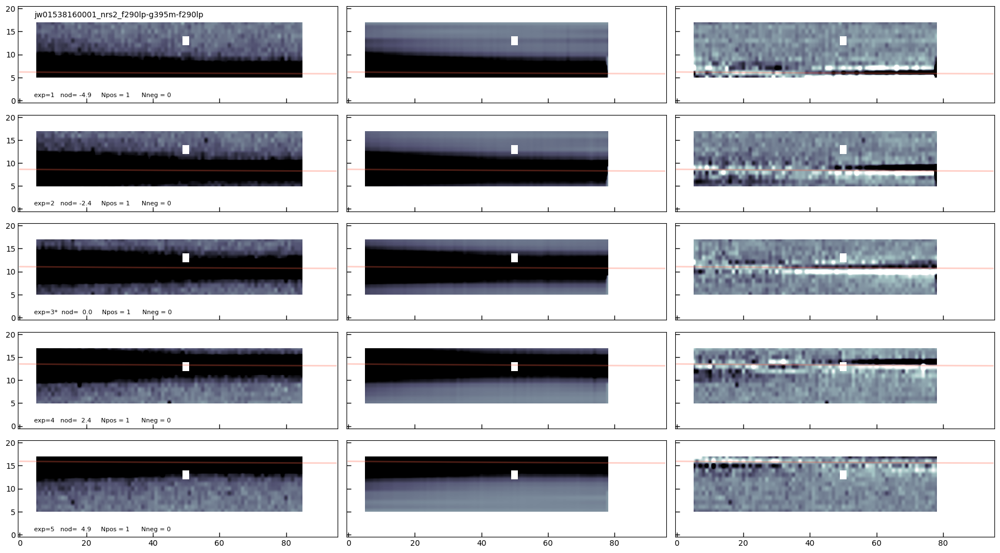

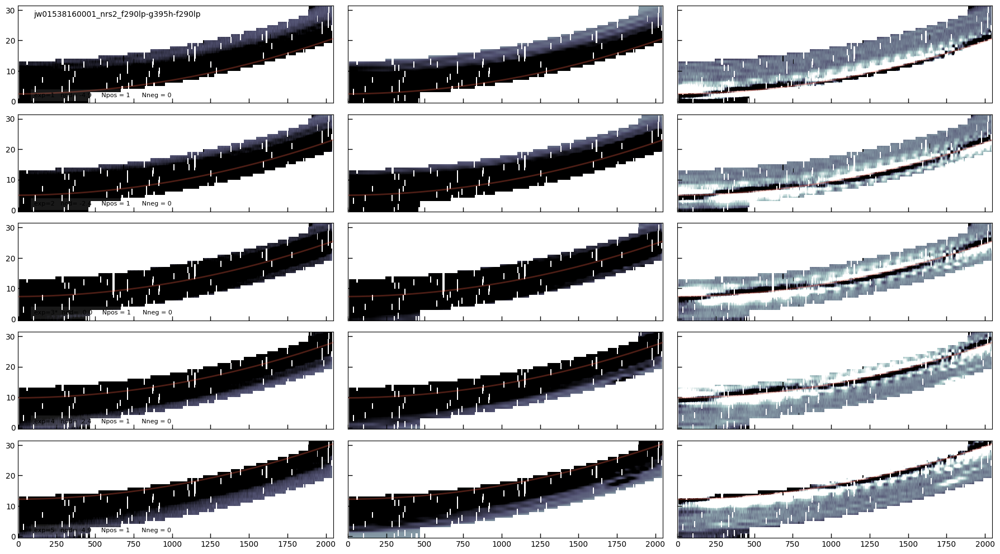

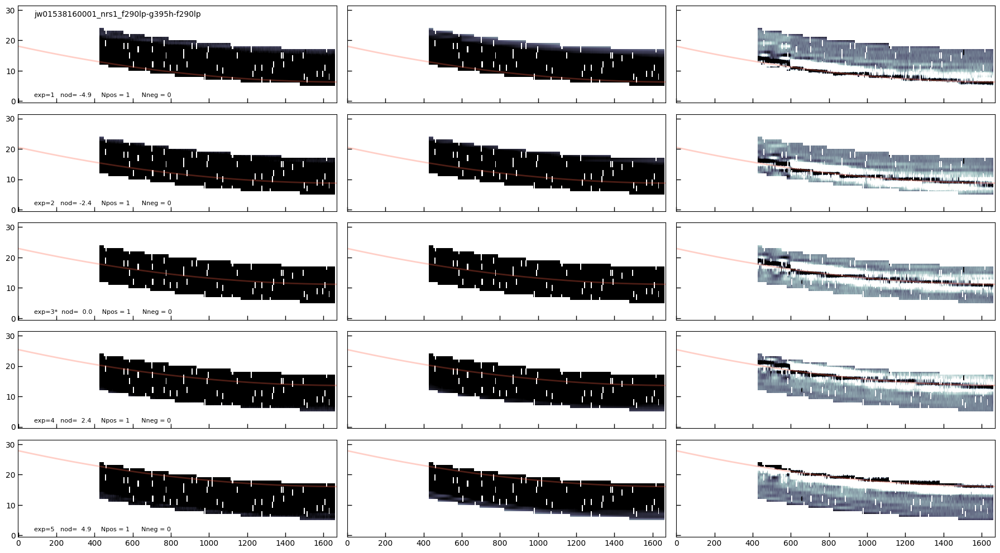

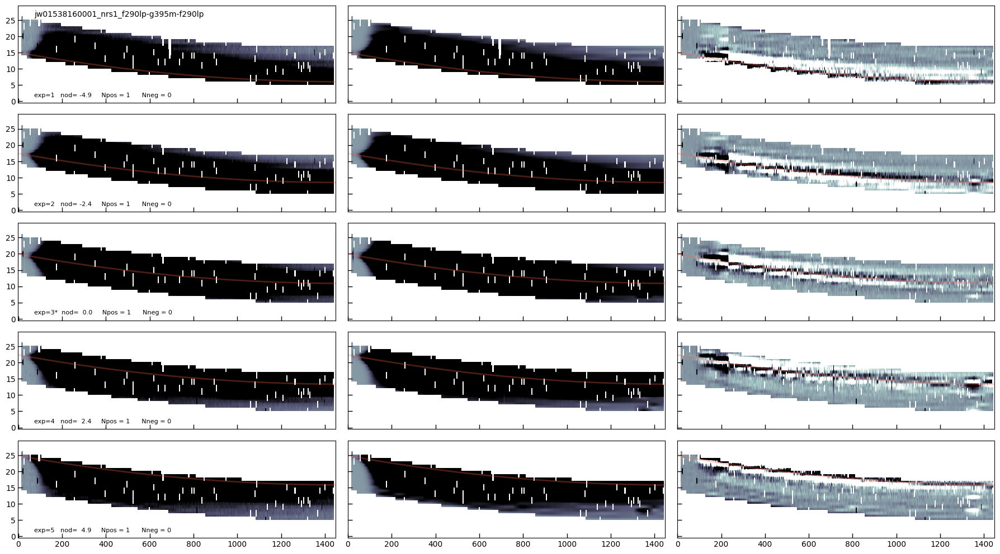

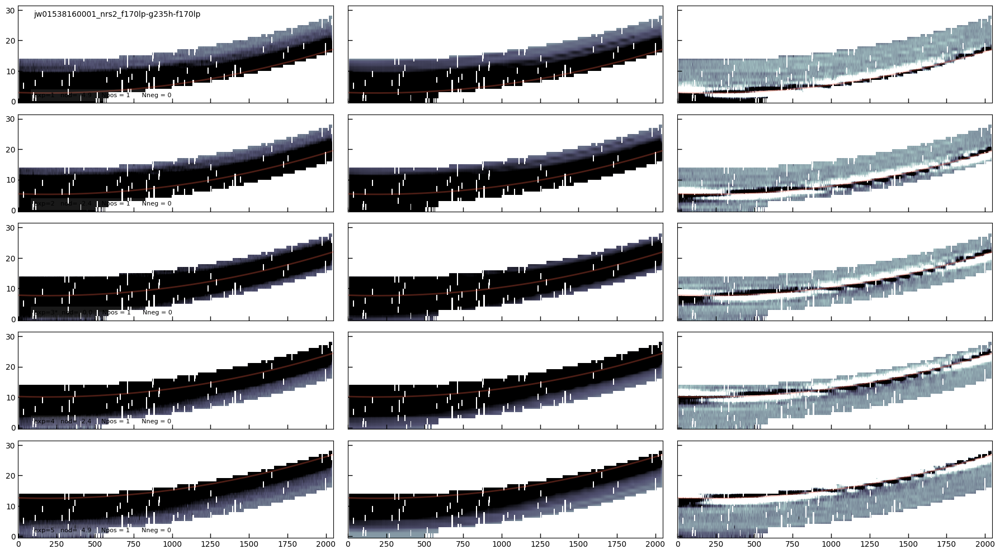

...

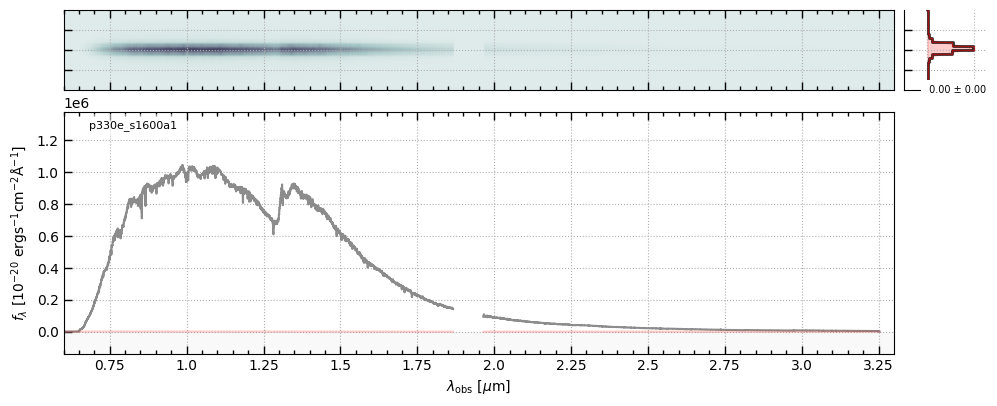

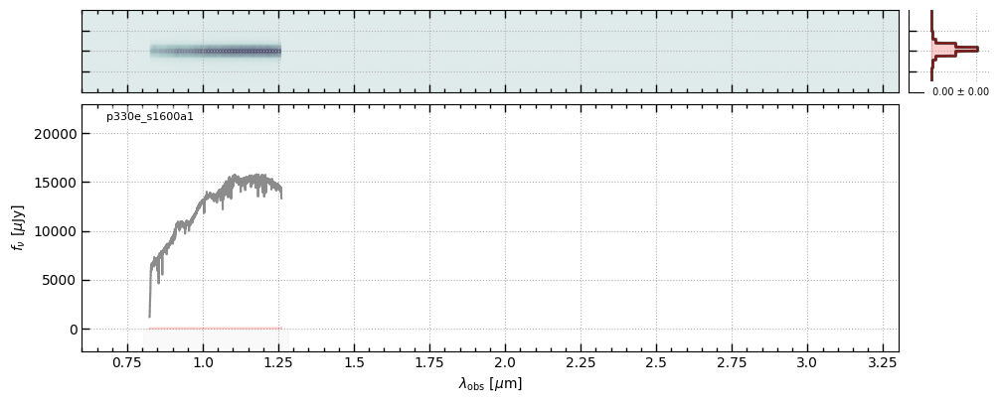

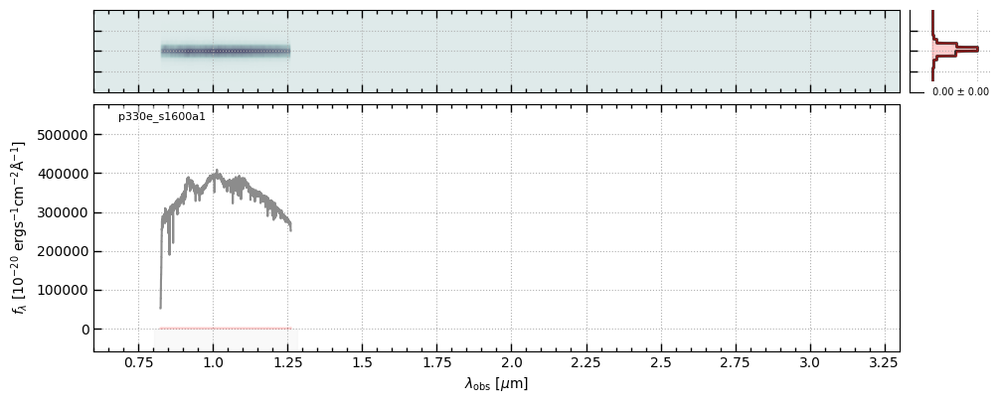

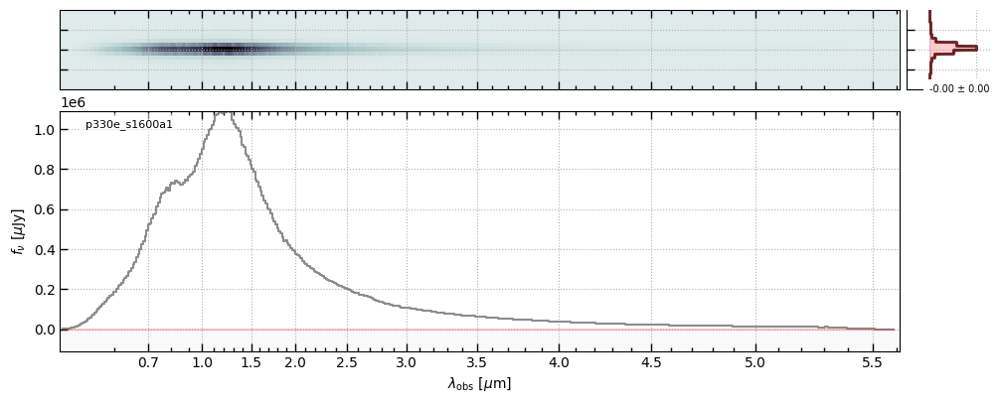

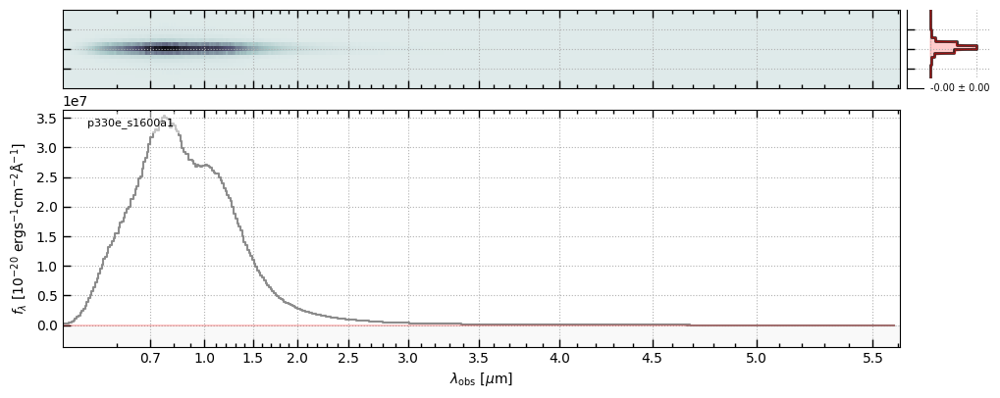

In [909]:
import msaexp.slit_combine
from importlib import reload

FORCE_REDO = 0

_files = cext_files[:]

reload(msaexp.utils); reload(msaexp.slit_combine)

if 1:
    #prf = msaexp.slit_combine.set_lookup_prf()
    # prf = msaexp.slit_combine.set_lookup_prf(psf_file='nirspec_merged_s200a1_exp_psf_lookup.fits')
    if slit_name:
        prf = msaexp.slit_combine.set_lookup_prf(psf_file=f'nirspec_merged_{slit_name}_exp_psf_lookup.fits')
    else:
        prf = msaexp.slit_combine.set_lookup_prf(psf_file=f'nirspec_merged_s200a1_exp_psf_lookup.fits')
        
    # prf = msaexp.slit_combine.set_lookup_prf(psf_file='nirspec_merged_s1600a1_exp_psf_lookup.fits')
    print(prf.psf_file_path)
    

# prf = msaexp.slit_combine.set_lookup_prf(psf_file='nirspec_g140m_f100lp_exp_psf_lookup.fits')

# Wavelength limits for combined products
GRATING_LIMITS = {
    "prism": [0.5, 5.6, 0.01],
    "g140m": [0.6, 3.3, 0.00063],
    "g235m": [1.5, 5.3, 0.00106],
    "g395m": [2.6, 5.6, 0.00179],
    "g140h": [0.6, 3.3, 0.000238],
    "g235h": [1.5, 5.3, 0.000396],
    "g395h": [2.6, 5.6, 0.000666],
}

DRIZZLE_KWS = dict(
    step=1,
    with_pathloss=False,
    wave_sample=1.05,
    ny=21,
    dkws=dict(oversample=16, pixfrac=0.8),
    pixtab_with_mask=False,
    grating_limits=GRATING_LIMITS,
)

msaexp.slit_combine.PRISM_MAX_VALID = 1e8

_files = _files[:]

ALL_GRATINGS = ['PRISM', 'G395H', 'G395M', 'G235M', 'G140M','G395H','G235H','G140H'][:]

# Combine with all masks and recalibration turned off

root = f'fs_{prog}'

existing_files = glob.glob(f'{root}*{slit_name}*spec.fits')

if (len(existing_files) == 0) | (FORCE_REDO):
    hdul, xobj = msaexp.slit_combine.extract_spectra(
        target='fixed', #'candels-j033225.96-274930.4',
        root=root,
        files=_files,
        do_gratings=ALL_GRATINGS,
        recenter_all=True,
        diffs=False,
        grating_diffs=False,
        undo_barshadow=(int(float(prog)) in [1493])*2,
        undo_pathloss=(int(float(prog)) in [1493]),
        get_xobj=True,
        input_fix_sigma=0.000001,
        initial_theta=[0.0, 0.0, 0.0],
        do_multiple_mask=False,
        flag_percentile_kwargs=None,
        hot_cold_kwargs=None,
        flag_trace_kwargs=None,
        slit_hotpix_kwargs=None,
        trace_with_xpos=True,
        fix_prism_norm=False,
        extended_calibration_kwargs=None, #{"threshold": 0.01},
        drizzle_kws=DRIZZLE_KWS,
        include_full_pixtab=ALL_GRATINGS*(int(float(prog)) in [4460, 1487, 1128, 11280, 1538, 1492, 1493]),
        make_2d_plots=(prog not in [11280]),
        with_fs_offset=False, #(prog == 1487),
    )
else:
    print('\nExisting files:\n\n' + '\n'.join(existing_files))

# After generating for 1128 - S200A1, run "lookup-table-psf" notebook to generate the PSF models

# Combined plot

In [912]:
prog, ctempl
# prog = 3786.1

(1538, <class 'eazy.templates.Template'>: CALSPEC p330e_mod_008)

In [913]:
import msaexp.spectrum
import eazy
import scipy.ndimage as nd

fs_spectra = {}

fs_files = glob.glob(f'fs_{prog}*{slit_name}.spec.fits')
fs_files.sort()

for file in fs_files:

    # if (prog == 1128) & ('prism' in file.lower()):
    #     continue
    
    sp = msaexp.spectrum.SpectrumSampler(file)
    k = f'{sp.meta["GRATING"]}-{sp.meta["FILTER"]}'
    print(file, k)
    fs_spectra[k] = sp

    # orig_spectra[k] = msaexp.spectrum.SpectrumSampler(file.replace('ext_','redo_'))
                                          
fs_spectra.keys()


fs_1538_g140h-f070lp_p330e_s1600a1.spec.fits G140H-F070LP
fs_1538_g140h-f100lp_p330e_s1600a1.spec.fits G140H-F100LP
fs_1538_g140m-f070lp_p330e_s1600a1.spec.fits G140M-F070LP
fs_1538_g140m-f100lp_p330e_s1600a1.spec.fits G140M-F100LP
fs_1538_g235h-f170lp_p330e_s1600a1.spec.fits G235H-F170LP
fs_1538_g235m-f170lp_p330e_s1600a1.spec.fits G235M-F170LP
fs_1538_g395h-f290lp_p330e_s1600a1.spec.fits G395H-F290LP
fs_1538_g395m-f290lp_p330e_s1600a1.spec.fits G395M-F290LP
fs_1538_prism-clear_p330e_s1600a1.spec.fits PRISM-CLEAR


dict_keys(['G140H-F070LP', 'G140H-F100LP', 'G140M-F070LP', 'G140M-F100LP', 'G235H-F170LP', 'G235M-F170LP', 'G395H-F290LP', 'G395M-F290LP', 'PRISM-CLEAR'])

fs_1538_g140h-f070lp_p330e_s1600a1.spec.fits G140H-F070LP
fs_1538_g140h-f100lp_p330e_s1600a1.spec.fits G140H-F100LP
fs_1538_g140m-f070lp_p330e_s1600a1.spec.fits G140M-F070LP
fs_1538_g140m-f100lp_p330e_s1600a1.spec.fits G140M-F100LP
fs_1538_g235h-f170lp_p330e_s1600a1.spec.fits G235H-F170LP
fs_1538_g235m-f170lp_p330e_s1600a1.spec.fits G235M-F170LP
fs_1538_g395h-f290lp_p330e_s1600a1.spec.fits G395H-F290LP
fs_1538_g395m-f290lp_p330e_s1600a1.spec.fits G395M-F290LP
fs_1538_prism-clear_p330e_s1600a1.spec.fits PRISM-CLEAR
F070LP_G140H
tyc4433_s200a1_sensitivity_F070LP_G140H.fits
F100LP_G140H
tyc4433_s200a1_sensitivity_F100LP_G140H.fits
F070LP_G140M
tyc4433_s200a1_sensitivity_F070LP_G140M.fits
F100LP_G140M
tyc4433_s200a1_sensitivity_F100LP_G140M.fits
F170LP_G235H
tyc4433_s200a1_sensitivity_F170LP_G235H.fits
F170LP_G235M
tyc4433_s200a1_sensitivity_F170LP_G235M.fits
F290LP_G395H
tyc4433_s200a1_sensitivity_F290LP_G395H.fits
F290LP_G395M
tyc4433_s200a1_sensitivity_F290LP_G395M.fits
CLEAR_PRISM
tyc4

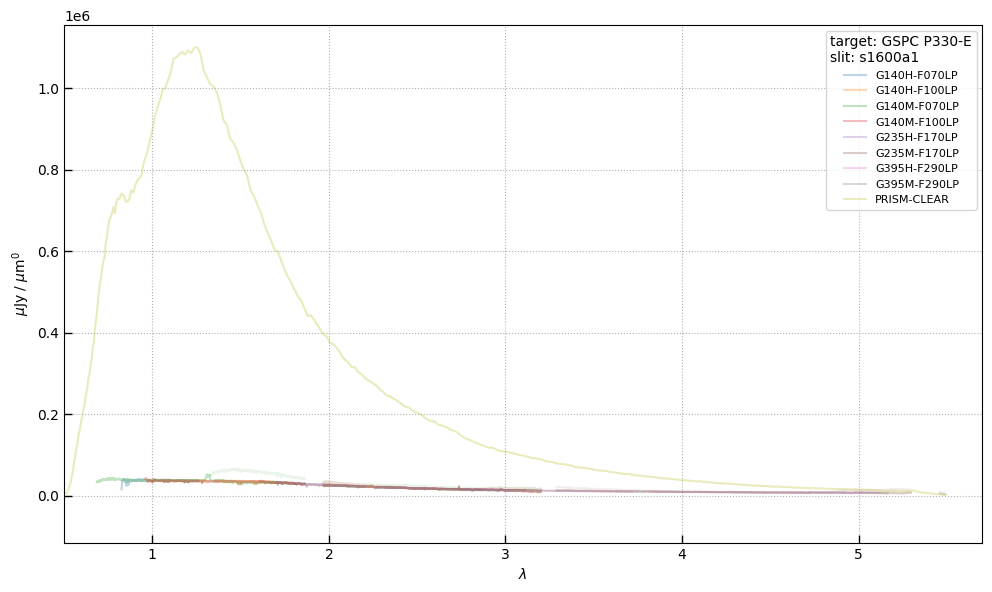

In [914]:


fs_spectra = {}

fs_files = glob.glob(f'fs_{prog}*{slit_name}.spec.fits')
fs_files.sort()

for file in fs_files:

    if (prog == 1128) & ('prism' in file.lower()) & (slit_name == 's200a1'):
        continue
    
    sp = msaexp.spectrum.SpectrumSampler(file)
    k = f'{sp.meta["GRATING"]}-{sp.meta["FILTER"]}'
    print(file, k)
    fs_spectra[k] = sp

if int(float(prog)) == 3786:

    fs_files = glob.glob(f'fs_3786*{slit_name}.spec.fits')
    fs_files.sort()

    fs_spectra = {}
    for file in fs_files:
        sp = msaexp.spectrum.SpectrumSampler(file)
        k = file.split('.spec')[0]
        print(file, k)
        fs_spectra[k] = sp
        
if int(float(prog)) == 1493:
    fs_spectra = {}
    for file in fs_files:
        sp = msaexp.spectrum.SpectrumSampler(file)
        k = file.split('_')[1]
        print(file, k)
        fs_spectra[k] = sp
        
    # orig_spectra[k] = msaexp.spectrum.SpectrumSampler(file.replace('ext_','redo_'))
                                          
fs_spectra.keys()

COLORS = {}
spec = fs_spectra

FIGURE_DPI = 180

z = 0
wpow = 0 

fig, ax = plt.subplots(1,1,figsize=(10,6))
for k in spec:
    # Mask missing data
    valid = nd.binary_erosion(spec[k]['flux'] > 0, iterations=4)
    mjy = spec[k]['flux']*1. #.to('mJy')
    emjy = spec[k]['full_err']*1. #.to('mJy')
    mjy[~valid] = np.nan
    emjy[~valid] = np.nan
    spec[k].spec['flux_mjy'] = mjy
    if 'xPRISM' not in k:
        inst_key = f"{spec[k].meta['FILTER']}_{spec[k].meta['GRATING']}"
        print(inst_key)

        sens_prefix = 'tyc4433_s1600a1'
        sens_prefix = 'tyc4433_s200a1'

        fflat_file = f"{sens_prefix}_sensitivity_{inst_key}.fits"

        if os.path.exists(fflat_file):
            print(fflat_file)
            fflat = utils.read_catalog(fflat_file)
    
            if (slit_name == 's200a1') & ('s200' not in sens_prefix):
                slit_loss = utils.read_catalog('tyc4433_s200a1_slit_loss.fits')
                fflat['sensitivity'] *= np.interp(fflat['wavelength'], slit_loss['wave'], slit_loss['slit_loss'], left=0, right=0)
                
            corr = np.interp(spec[k]["wave"], fflat["wavelength"], fflat["sensitivity"], left=np.nan, right=np.nan)

        # Excess
        if 'sensitivity_2' in fflat.colnames:
            if 'correct_to_crds' in fflat.colnames:
                # print('correct_to_crds')
                fflat['sensitivity'] *= fflat['correct_to_crds']
                fflat['sensitivity'][~np.isfinite(fflat['sensitivity'])] = 0

            sp = spec[k]
            
            extra = sp['wave']*0
            
            sub2 = (sp['wave'] > sp['wave'][sp.valid].min()*2) & (sp.valid)
            extra[sub2] += np.interp(
                sp['wave'],
                sp['wave'][sp.valid]*2,
                (sp['flux'] * fflat['sensitivity_2'] / fflat['sensitivity'])[sp.valid],
                left=0, right=0
            )[sub2]
            
            # extra *= 0.
            
            if 'sensitivity_3' in fflat.colnames:
                sub3 = (sp['wave'] > sp['wave'][sp.valid].min()*3) & (sp.valid)
                extra[sub3] += np.interp(
                    sp['wave'],
                    sp['wave'][sp.valid]*3,
                    (sp['flux'] * fflat['sensitivity_3'] / fflat['sensitivity'])[sp.valid],
                    left=0, right=0
                )[sub3]
                
            # axes[0].plot(sp['wave'], sp['flux'] - extra, color='0.5', alpha=0.3)
            # ax.plot(sp['wave'], (sp['flux'] - extra) / fflat['sensitivity'], color='0.5', alpha=0.3)
            # axes[0].set_ylim(0, 20)
                
        else:
            corr = 1.0
            extra = None
            
        spec[k].spec['fcorr'] = 1./corr
        
        mjy /= corr
        emjy /= corr
                
    else:
        spec[k].spec['fcorr'] = 1.
            
    mjy *= (spec[k]['wave']/3.)**wpow
    emjy *= (spec[k]['wave']/3.)**wpow
    
    if ('PRISM' in k) | (1):
        ok = spec[k].valid & (spec[k]["wave"] < 5.5) & (1./spec[k].spec['fcorr'] > 0.05)

        if ctempl is None:
            if extra is None:
                pl = ax.plot(spec[k]['wave'][ok], mjy[ok], alpha=0.3, label=k)
            else:
                pl = ax.plot(spec[k]['wave'][ok], mjy[ok], color='0.5', alpha=0.3)
                pl = ax.plot(spec[k]['wave'][ok], (mjy - extra * (spec[k]['wave']/3.)**wpow)[ok], color='0.5', alpha=0.3, label=k)
        else:
            #pl = ax.plot(spec[k]['wave'][ok], mjy[ok], alpha=0.5, label=k)
            if extra is None:
                pl = ax.plot(spec[k]['wave'][ok], mjy[ok], alpha=0.3, label=k)
            else:
                ee = extra != 0
                pl = ax.plot(spec[k]['wave'][ok & ee], mjy[ok & ee], alpha=0.1)
                pl = ax.plot(spec[k]['wave'][ok], (mjy - extra / corr * (spec[k]['wave']/3.)**wpow)[ok], alpha=0.3, label=k, color=pl[0].get_color())
            
    else:
        pl = ax.plot(spec[k]['wave'], mjy, alpha=0.1)
        ax.plot(spec[k]['wave'], nd.gaussian_filter1d(mjy, 2), label=k, alpha=0.5, color=pl[0].get_color())
        if (('G235' in k) | ('G140' in k)) & (0):
            ax.plot(spec[k]['wave']*2, nd.gaussian_filter1d(mjy, 2)/20, label=k, alpha=0.5, color='magenta')
    
    COLORS[k] = pl[0].get_color()

# # Skip this for now...
# for k in spec:
#     continue
    
#     if 'xPRISM' in k:
#         continue

#     if ctempl is not None:
#         calspec_rebin = spec[k].resample_eazy_template(ctempl, include_igm=False, scale_disp=1.4, velocity_sigma=1)

#         inst_key = f"{spec[k].meta['FILTER']}_{spec[k].meta['GRATING']}"
#         print(inst_key)

#         # fflat = utils.read_catalog(f"wd_sensitivity_{inst_key}.fits")
#         # fflat = utils.read_catalog(f"p330e_sensitivity_{inst_key}.fits")
#         # fflat = utils.read_catalog(f"tyc4433_s1600a1_sensitivity_{inst_key}.fits")
#         fflat = utils.read_catalog(f"{sens_prefix}_sensitivity_{inst_key}.fits".replace('H.fits','H.fits'))
#         if (slit_name == 's200a1') & ('s200' not in sens_prefix):
#             slit_loss = utils.read_catalog('tyc4433_s200a1_slit_loss.fits')
#             fflat['sensitivity'] *= np.interp(fflat['wavelength'], slit_loss['wave'], slit_loss['slit_loss'], left=0, right=0)

#         if "sensitivity_2" in fflat.colnames:        
#             calspec_rebin_extra = calspec_rebin*np.interp(spec[k]["wave"], fflat["wavelength"], fflat["sensitivity_2"])
#             calspec_rebin_extra[~np.isfinite(calspec_rebin_extra)] = 0
        
#             corr = 1./spec[k].spec['fcorr']
#             extra = np.interp(spec[k]["wave"], spec[k]["wave"]*2, calspec_rebin_extra) / corr
#             # ax.plot(spec[k]['wave'], extra * (spec[k]['wave']/3.)**wpow, color='pink')
#         else:
#             extra = 0.
            
#         if "sensitivity_3" in fflat.colnames:
#             calspec_rebin_extra = calspec_rebin*np.interp(spec[k]["wave"], fflat["wavelength"], fflat["sensitivity_3"])
#             calspec_rebin_extra[~np.isfinite(calspec_rebin_extra)] = 0
#             extra += np.interp(spec[k]["wave"], spec[k]["wave"]*3, calspec_rebin_extra) / corr
#             # ax.plot(spec[k]['wave'], extra * (spec[k]['wave']/3.)**wpow, color='purple')

#         ok = spec[k].valid & (spec[k]["wave"] < 5.5) & (corr > 0.05)
#         if 1:
#             ax.plot(spec[k]['wave'][ok], ((calspec_rebin + extra) * (spec[k]['wave']/3.)**wpow)[ok], color='magenta', alpha=0.3) #, label=calspec_label)
            
#         if 0:
#             ax.plot(spec[k]['wave'][ok], ((spec[k]["flux"]/corr - extra) * (spec[k]['wave']/3.)**wpow)[ok], color=COLORS[k], alpha=0.5, label=k)

#         calspec_label = None

#         # if 1:
#         #     ax.plot(spec[k]['wave']*2, calspec_rebin * (spec[k]['wave']/3.)**wpow * 0.8 * 0.5 + 5000, color='olive', alpha=0.2, label=calspec_label)


ax.set_xlabel(r'$\lambda$') #\,[\mu\mathrm{m}]$')
ax.set_ylabel(r'$\mu$Jy / $\mu\mathrm{m}^{pow}$'.replace('pow',f'{-wpow}'))

ax.grid()
leg = ax.legend(loc='upper right', ncol=1, fontsize=8, title=f"target: {spec[k].meta['TARGNAME']}"+ "\nslit: " + slit_name)

plt.xlim(0.5, 5.7)
# ax.semilogy()

yl = ax.get_ylim()

ax.set_ylim(-0.1*yl[1], yl[1])

if prog == 1125:
    ax.set_ylim(-100, 1.e4)

fig.tight_layout(pad=1)

fs_root = '_'.join([fs_files[-1].split('_')[i] for i in [0,1,3,4]]).split('.spec')[0]

if int(float(prog)) == 3786:
    plt.ylim(150, 1400)

# plt.xlim(1.9, 2.4)

# plt.ylim(-10, 5000)
fig.savefig(fs_root + '.all.png')
# plt.xlim(1.5, 2.3)
# plt.xlim(1.5, 3.1)


# F070 from difference

(10.0, 100000.0)

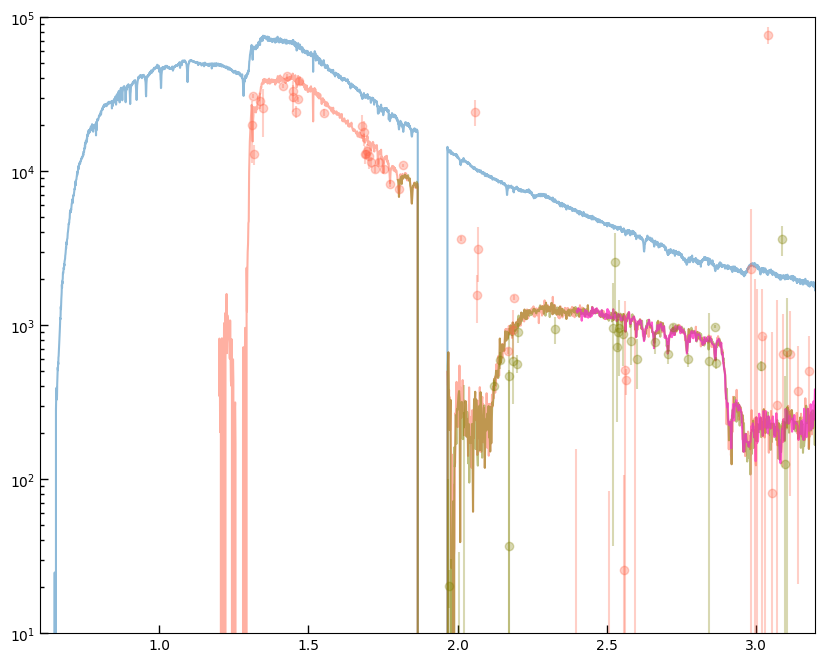

In [832]:
# Diff for F070LP second order
if 0:
    g1 = msaexp.spectrum.SpectrumSampler('fs_1538_g140m-f070lp_p330e_s1600a1.spec.fits')
    g2 = msaexp.spectrum.SpectrumSampler('fs_1538_g140m-f100lp_p330e_s1600a1.spec.fits')
else:
    g1 = msaexp.spectrum.SpectrumSampler('fs_1128_g140m-f070lp_1808347_s1600a1.spec.fits')
    g2 = msaexp.spectrum.SpectrumSampler('fs_1128_g140m-f100lp_1808347_s1600a1.spec.fits')

fig, ax = plt.subplots(1,1,figsize=(10,8))

plt.plot(g1['wave'], g1['flux'], alpha=0.5)

diff =  g1['flux'] - g2['flux']

e2 = np.interp(g1['wave'], g1['wave']/2, diff, left=np.nan, right=np.nan)
e3 = np.interp(g1['wave'], g1['wave']/3, diff, left=np.nan, right=np.nan)
e4 = np.interp(g1['wave'], g1['wave']/4, diff, left=np.nan, right=np.nan)

# plt.plot(g1['wave'], diff)
plt.plot(g1['wave']*2, e2, alpha=0.5, color='tomato')
plt.plot(g1['wave']*3, e3, alpha=0.5, color='olive')
plt.plot(g1['wave']*4, e4, alpha=0.5, color='magenta')

try:
    sens = utils.read_catalog('tyc4433_s1600a1_sensitivity_F070LP_G140M.fits')
    # plt.plot(sens['wavelength'], sens['sensitivity']*3e4)
    plt.plot(sens['wavelength']*2, sens['sensitivity_2']*5.e4, color='tomato')
    plt.plot(sens['wavelength']*3, sens['sensitivity_3']*5e4, color='olive')
except:
    pass

# plt.plot(g1['wave'], g2['flux'], alpha=0.5)

fv = utils.read_catalog('calib_table.csv')

fv_interp = np.interp(fv['wave'], g1['wave'], g1['flux'])

fv2 = fv['f2'] / fv['f1'] / 2
fv2[(fv['f1'] == 0) | (fv['f2'] == 0)] = np.nan

fv_err2 = np.sqrt(fv2**2 * ((fv['e2']/fv['f2'])**2 +  (fv['e1']/fv['f1'])**2))

fv3 = fv['f3'] / fv['f1'] / 3
fv3[(fv['f1'] == 0) | (fv['f3'] == 0)] = np.nan
fv_err3 = np.sqrt(fv3**2 * ((fv['e3']/fv['f3'])**2 +  (fv['e1']/fv['f1'])**2))

ok = np.isfinite(fv2)

plt.errorbar(fv['wave']*2,  fv2 * fv_interp, fv_err2 * fv_interp, color='tomato', alpha=0.3, linestyle='None', marker='o')

plt.errorbar(fv['wave']*3,  fv3 * fv_interp, fv_err3 * fv_interp, color='olive', alpha=0.3, linestyle='None', marker='o')

plt.xlim(0.6, 3.2)

plt.semilogy(); plt.ylim(10, 1e5)

plt.ylim(0, 1.e5)

# # plt.xlim(0.6, 0.8)

# test = fv['line'] == 'H{alpha}-6565_first'
# f1_interp[test]

In [ ]:
plt.rcParams['figure.figsize'] = (10,5)

SCALE_DISP = 1.4

diff =  g1['flux'] - g2['flux']

diff3 =  g1['flux'] - g2['flux']*1.025

if 1:
    print('scale diff3')
    diff3 *= 0.9

# First order
calspec_rebin = g1.resample_eazy_template(ctempl, include_igm=False, scale_disp=SCALE_DISP, velocity_sigma=10)

# Second order
ctempl2 = eazy.templates.Template(arrays=(ctempl.wave*2, ctempl.flux_flam()/2))
calspec_rebin2 = g1.resample_eazy_template(ctempl2, include_igm=False, scale_disp=SCALE_DISP*2, velocity_sigma=10)  / 2

# Third order
ctempl3 = eazy.templates.Template(arrays=(ctempl.wave*3, ctempl.flux_flam()/3))
calspec_rebin3 = g1.resample_eazy_template(ctempl3, include_igm=False, scale_disp=SCALE_DISP*3, velocity_sigma=10) / 3

# Fourth order
ctempl4 = eazy.templates.Template(arrays=(ctempl.wave*4, ctempl.flux_flam()/4))
calspec_rebin4 = g1.resample_eazy_template(ctempl4, include_igm=False, scale_disp=SCALE_DISP*4, velocity_sigma=10) / 4

fig, axes = plt.subplots(3,1,figsize=(10,8))

axes[0].plot(g1['wave'], diff / calspec_rebin2, alpha=0.5, color='0.5')
axes[1].plot(g1['wave'], diff3 / calspec_rebin3, alpha=0.5, color='0.5')

axes[2].plot(g1['wave'], diff3 / calspec_rebin4, alpha=0.5, color='0.5')

if 0:
    sens = utils.read_catalog('tyc4433_s1600a1_sensitivity_F070LP_G140M.fits')
    axes[0].plot(sens['wavelength']*2, sens['sensitivity_2'], color='tomato')
    axes[1].plot(sens['wavelength']*3, sens['sensitivity_3'], color='olive')

axes[0].set_xlim(1.1, 2.5)
axes[0].set_ylim(-0.1, 1)

xl = axes[0].get_xlim()
axes[1].set_xlim(xl[0]/2*3, xl[1]/2*3)
axes[1].vlines(2.1/3*4, -1,1, color='cyan', label='order 4')

axes[2].set_xlim(xl[0]/2*4, xl[1]/2*4)

# fvi = np.interp(fv['wave'], sens['wavelength'], sens['sensitivity'])
fvi = np.interp(fv['wave'], g1["wave"], g1["flux"]*calspec_rebin)

axes[1].errorbar(fv['wave']*3,  fv3*fvi, fv_err3*fvi, color='olive', alpha=0.3, linestyle='None', marker='o')
axes[1].set_ylim(-0.0035, 0.035)

axes[2].set_ylim(-0.001, 0.01)

order3_f070 = utils.GTable()
order3_f070["wavelength"] = g1["wave"]
order3_f070["sensitivity_3"] = diff3 / calspec_rebin3
ok3 =  (g1["wave"] > 2.08) & (g1["wave"] < 2.75)
order3_f070["sensitivity_3"][~ok3] = np.nan

order3_f070["sensitivity_4"] = diff3 / calspec_rebin4
ok4 =  (g1["wave"] > 3.0)
order3_f070["sensitivity_4"][~ok4] = np.nan

# order3_f070 = order3_f070[ok3]
axes[1].plot(order3_f070['wavelength'], order3_f070['sensitivity_3'], color='olive')
axes[2].plot(order3_f070['wavelength'], order3_f070['sensitivity_4'], color='cyan')

axes[2].plot(order3_f070['wavelength']/3*4, order3_f070['sensitivity_3']*0.15, color='lightblue')

order3_f070.write(f'{out_prefix}_order3_f070lp.fits', overwrite=True)
print(f'{out_prefix}_order3_f070lp.fits')

fig.tight_layout(pad=1)

# Fit sensitivity for WD

## Blaze functions from Peter Jakobsen

In [ ]:
if False:
    with open('/Users/gbrammer/Research/JWST/Projects/NIRSpec/ExtendWavelength/Blaze/blaze.txt') as fp:
        lines = fp.readlines()
    
    groups = []
    group = []
    for line in lines:
        spl = np.array(line.strip().split()).astype(float)
        if spl[2] == 0:
            groups.append(group)
            group = []
        else:
            group.append(spl[:2])
    
    groups.append(group)
    
    count = 0
    blaze = {}
    for gr in ['g140m','g235m','g395m']:
        for order in [1,2]:
            blaze[gr, order] = np.array(groups[count]).T
            count += 1
    
            plt.plot(*blaze[gr,order], label=f"{gr} {order}")
    
    blaze_offset = {'g140m': 0, 'g235m': 0, 'g395m': 0}
    
    plt.legend()

# Read spectra

In [383]:
import msaexp.spectrum
import eazy
import scipy.ndimage as nd

fs_spectra = {}

fs_files = glob.glob(f'fs_{prog}*{slit_name}.spec.fits')
fs_files.sort()

for file in fs_files:

    # if (prog == 1128) & ('prism' in file.lower()):
    #     continue
    
    sp = msaexp.spectrum.SpectrumSampler(file)
    k = f'{sp.meta["GRATING"]}-{sp.meta["FILTER"]}'
    print(file, k)
    fs_spectra[k] = sp

    # orig_spectra[k] = msaexp.spectrum.SpectrumSampler(file.replace('ext_','redo_'))
                                          
print('\n', fs_spectra.keys())

if prog == 1125:
    out_prefix = 'smp58'
elif prog == 1538:
    out_prefix = 'p330e'
elif prog == 1128:
    out_prefix = 'tyc4433'
elif prog == 1536:
    out_prefix = 'j1743045'
elif prog == 1492:
    out_prefix = 'smp58b'
elif prog == 1487:
    out_prefix = 'j1743045-cal1487'
else:
    out_prefix = 'wd'

print(f'\n prefix: {out_prefix}, slit: {slit_name}')

print(ctempl.name)

fs_1128_g140h-f070lp_1808347_s200a1.spec.fits G140H-F070LP
fs_1128_g140h-f100lp_1808347_s200a1.spec.fits G140H-F100LP
fs_1128_g140m-f070lp_1808347_s200a1.spec.fits G140M-F070LP
fs_1128_g235h-f170lp_1808347_s200a1.spec.fits G235H-F170LP
fs_1128_g235m-f170lp_1808347_s200a1.spec.fits G235M-F170LP
fs_1128_g395h-f290lp_1808347_s200a1.spec.fits G395H-F290LP
fs_1128_g395m-f290lp_1808347_s200a1.spec.fits G395M-F290LP
fs_1128_prism-clear_1808347_s200a1.spec.fits PRISM-CLEAR

 dict_keys(['G140H-F070LP', 'G140H-F100LP', 'G140M-F070LP', 'G235H-F170LP', 'G235M-F170LP', 'G395H-F290LP', 'G395M-F290LP', 'PRISM-CLEAR'])

 prefix: tyc4433, slit: s200a1
CALSPEC 1808347_mod_005


## F100LP

From CAL-1487

(0.0, 4000.0)

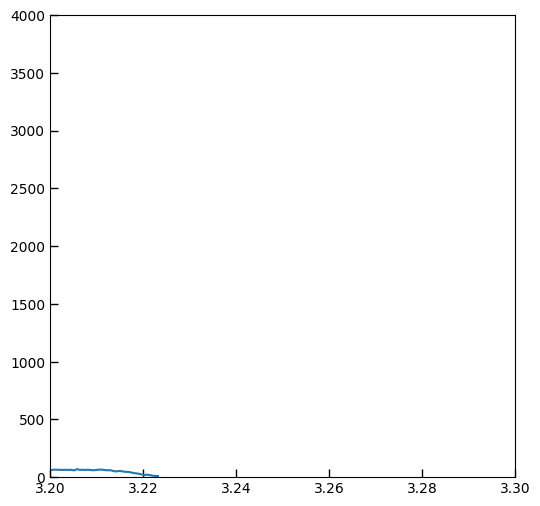

In [377]:
k = 'G140M-F100LP'
# k = 'G140H-F100LP'

sp = fs_spectra[k]

sens2 = np.ones(len(sp["wave"]))

fs_spectra

inst_key = 'F100LP_G140M'

sp.valid &= np.abs(sp["wave"] - 2.7375) > 0.001

plt.plot(sp["wave"][sp.valid], sp["flux"][sp.valid])
sp.spec["flux"][~sp.valid] = np.nan
plt.xlim(3.2, 3.3)
plt.ylim(0, 4000)


In [ ]:
if 0:
    # Combined
    inst_key = 'F100LP_G140M'
    ax1 = utils.read_catalog(f"tyc4433_s1600a1_sensitivity_{inst_key}.data.fits")
    ax2 = utils.read_catalog(f"p330e_s1600a1_sensitivity_{inst_key}.data.fits")
    
    Ax = np.vstack([ax1["Ax"], ax2["Ax"]])
    ok = np.append(ax1["ok"], ax2["ok"])
    flux = np.append(ax1["flux"], ax2["flux"])
    combined_coeff = nnls(Ax[ok,:], flux[ok])
else:
    combined_coeff = None

### Read control points from galaxy lines


F070LP


((114, 3), (32, 3))

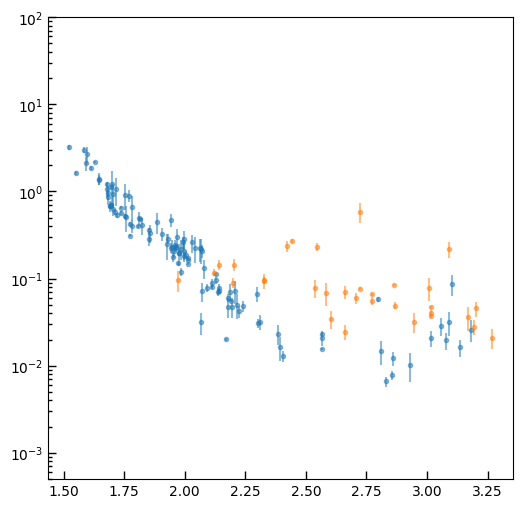

In [196]:
import astropy.table
    
def get_emission_line_control_points(sp, inst_key='F100LP_G140M', sn1=3, sn_order=2, weight=1.e5, manual_mask=False, force_wavecal=False):

    filt = inst_key.split('_')[0]
    print(filt)
    
    files = glob.glob(f'/Users/gbrammer/Research/JWST/Projects/NIRSpec/ExtendWavelength/*spec.lines.csv')

    files += ['calib_table.csv']

    files += glob.glob(f'/Users/gbrammer/Research/JWST/Projects/NIRSpec/cal-iras05248/Wavecal2024/fs_1125*lineratio*.csv')

    if force_wavecal:
        files = glob.glob(f'/Users/gbrammer/Research/JWST/Projects/NIRSpec/cal-iras05248/Wavecal2024/fs_1125*lineratio*.csv')
        sn1 = sn_order = 0
        
    files.sort()
    tabs = [utils.read_catalog(f) for f in files]
    tab = astropy.table.vstack(tabs)

    # sel = np.isin(tab['filter'], filters)

    dflat_file = glob.glob(f'*dflat*{det}*fits')[0]
    df = utils.read_catalog(dflat_file)[0]
    dfo = df["wavelength"] > 0
    # df = df[dfo]
    
    # plt.plot(df["wavelength"][dfo], df["data"][dfo])

    order_data = []

    df_corr_1 = np.interp(tab["wave"],   df["wavelength"][dfo], df["data"][dfo])
    df_corr_2 = np.interp(tab["wave"]*2, df["wavelength"][dfo], df["data"][dfo])
    df_corr_3 = np.interp(tab["wave"]*3, df["wavelength"][dfo], df["data"][dfo])

    tab['f1'] *= df_corr_1
    tab['e1'] *= df_corr_1

    tab['f2'] *= df_corr_2
    tab['e2'] *= df_corr_2

    tab['f3'] *= df_corr_3
    tab['e3'] *= df_corr_3

    finterp = np.interp(tab['wave'], sp['wave'][sp.valid], sp['flux'][sp.valid])

    
    for order in [2,3]:
        sel = np.isin(tab['filter'], [filt])
        if filt in ['F070LP', 'F100LP']:
            sel = np.isin(tab['filter'], ['F070LP', 'F100LP'])
            # print('blue', sel.sum(), sel2.sum(), np.unique(tab['filter']))
            
        sel &= (tab['e1'] < tab['f1']/sn1)
        sel &= (tab['e1'] < tab['f1']/sn1) & (tab[f'e{order}'] > 0)

        if 1:
            sel &= (tab[f'e{order}'] < tab[f'f{order}']/sn_order) & (tab[f'e{order}'] > 0)
        
        # plt.scatter(tab['wave'][sel], finterp[sel], marker='x')
        lratio = tab[f'f{order}'] / tab['f1']
        
        if (manual_mask):
            sel &= lratio < 30

            if inst_key == 'F100LP_G140M':
                sel &= lratio < 0.3
                if order == 2:
                    bad = (tab["wave"]*order > 2.6) & (lratio > 0.04)
                    sel &= ~bad
            elif inst_key == 'F070LP_G140M':
                sel &= lratio < 7
                if order == 2:
                    bad = (tab["wave"]*order > 1.8) & (lratio > 0.5)
                    bad |= (tab["wave"]*order > 2.2) & (lratio > 0.25)
                    bad |= tab["wave"]*order < 1.5
    
                else:
                    bad = (tab["wave"]*order > 2.9) & (lratio > 0.5)
                
                sel &= ~bad
    
            elif inst_key == 'F170LP_G235M':
                sel &= lratio < 2
                bad = (tab["wave"]*order > 4) & (lratio > 0.4)
                bad |= (tab["wave"]*order > 3.8) & (lratio > 0.1)
                bad |= (tab["wave"]*order > 3.6) & (lratio > 0.3)
    
                sel &= ~bad
        else:
            print('no masking')

        
        sel &= (lratio > 0.001) & (finterp > 0)

        eratio = np.abs(lratio) * np.sqrt((tab['e1']/tab['f1'])**2 + (tab[f'e{order}'] / tab[f'f{order}'])**2)

        if (sel.sum() > 0) & (manual_mask) & (0):
            ix = np.where(sel)[0][0]
            if filt == 'F070LP':
                tab['wave'][ix] = 0.6
                lratio[ix] = 0.001
                eratio[ix] = 1.e-5
            elif filt == 'F100LP':
                tab['wave'][ix] = 0.92
                lratio[ix] = 0.001
                eratio[ix] = 1.e-5
            elif filt == 'F170LP':
                tab['wave'][ix] = 1.6
                lratio[ix] = 0.001
                eratio[ix] = 1.e-5
                # print(filt, order, order_wave[0], order_ratio[0])

        plt.errorbar(tab['wave'][sel]*order, lratio[sel], eratio[sel], marker='.', alpha=0.5, linestyle='None')
        
        # Relative to f-lambda of first order.  There is a factor of "order" for the flambda conversion
        lratio *= finterp / order
        eratio *= finterp / order
        
        # plt.scatter(tab['wave'][sel]*order, (tab[f'f{order}'] / tab['f1'])[sel])

        order_wave, order_ratio, order_err = tab['wave'][sel]*order, lratio[sel], eratio[sel]/weight

        # plt.errorbar(order_wave, order_ratio, order_err/weight, marker='.', alpha=0.5, linestyle='None')
        
        order_data.append(np.array([order_wave, order_ratio, order_err]).T)

    plt.semilogy(); plt.ylim(5.e-4, 100)
    
    return order_data, weight

(control_points_2, control_points_3), control_weight = get_emission_line_control_points(sp, inst_key=inst_key, sn1=3, sn_order=3, weight=1e1, manual_mask=True)
# (control_points_2, control_points_3), control_weight = get_emission_line_control_points(sp, inst_key='F070LP_', sn1=3, sn_order=3, weight=1e2)
# (control_points_2, control_points_3), control_weight = get_emission_line_control_points(sp, inst_key='F100LP_', sn1=3, sn_order=3, weight=1e2)
control_points_2.shape , control_points_3.shape   


In [ ]:
if False:
    control_points_2 = np.array([
        [2.1, 0.06],
        [2.5, 0.01],
        [3.0, 0.01],
        [3.2, 0.015],
    ])
    
    control_points_2[:,1] *= 1./3
    
    control_points_3 = np.array([
        [3.1, 0.005],
        [3.15, 0.005],
        [3.25, 0.005],
    ])
    
    control_points_2 = np.hstack([control_points_2, np.ones((control_points_2.shape[0],1))*1.e-6])
    control_points_3 = np.hstack([control_points_3, np.ones((control_points_3.shape[0],1))*1.e-6])

sens_2 = None

In [ ]:

sp.valid &= np.abs(sp["wave"] - 2.7375) > 0.0005

sp.valid &= sp["wave"] < 3.2

inst_key = f"{fs_spectra[k].meta['FILTER']}_{fs_spectra[k].meta['GRATING']}"
print(inst_key)

out_file = f'{out_prefix}_{slit_name}_sensitivity_{inst_key}.fits'
print(out_file)

oki = np.where(sp.valid)[0]
sp['flux'][oki[:2]] = 0

SCALE_DISP = 1.4

# First order
calspec_rebin = sp.resample_eazy_template(ctempl, include_igm=False, scale_disp=SCALE_DISP, velocity_sigma=10)

# Second order
ctempl2 = eazy.templates.Template(arrays=(ctempl.wave*2, ctempl.flux_flam()/2))
calspec_rebin2 = sp.resample_eazy_template(ctempl2, include_igm=False, scale_disp=SCALE_DISP*2, velocity_sigma=10)  / 2
#calspec_rebin2 *= np.interp(sp["wave"], sp["wave"]*2, sens_1)

# Third order
ctempl3 = eazy.templates.Template(arrays=(ctempl.wave*3, ctempl.flux_flam()/3))
calspec_rebin3 = sp.resample_eazy_template(ctempl3, include_igm=False, scale_disp=SCALE_DISP*3, velocity_sigma=10) / 3
# calspec_rebin3 *= np.interp(sp["wave"], sp["wave"]*3, sens_1)

# Wavelength cutoff of clean first order
wlim_1a = (0.85, 1.7)
df_1a = 71

wlim_1b = (wlim_1a[1], 3.4)
df_1b = 9

bspl_1a = utils.bspline_templates(sp["wave"], df=df_1a, get_matrix=True, minmax=wlim_1a).T
bspl_1b = utils.bspline_templates(sp["wave"], df=df_1b, get_matrix=True, minmax=wlim_1b).T

# Split second order
wlim_2a = (1.9, 2.23)
df_2a = 11

if out_prefix == 'j1743045-cal1487':
    print('set 2nd order for j1743045-cal1487')
    wlim_2a = (1.9, 2.2)

    df_2a = 15
    
wlim_2b = (wlim_2a[1], 3.4)
df_2b = 5

bspl_2a = utils.bspline_templates(sp["wave"], df=df_2a, get_matrix=True, minmax=wlim_2a).T
bspl_2b = utils.bspline_templates(sp["wave"], df=df_2b, get_matrix=True, minmax=wlim_2b).T

# wlim_2 = (1.29, 3.3)
# df_2 = 71
# bspl_2 = utils.bspline_templates(sp["wave"], df=df_2, get_matrix=True, minmax=wlim_2).T

# Third order
wlim_3 = (0.92*3, 3.3)
df_3 = 5

bspl_3 = utils.bspline_templates(sp["wave"], df=df_3, get_matrix=True, minmax=wlim_3).T

# Flat
# df_3, bspl_3 = 1, (sp["wave"] > wlim_3[0])[None,:]*1
if (sens_2 is not None) & (1):
    print('Match shape of order 3 to order 2')
    df_3 = 5
    bspl_3 = utils.bspline_templates(sp["wave"], df=df_3, get_matrix=True, minmax=wlim_3).T
    bspl_3 *= np.interp(sp["wave"], sp["wave"]/2*3, sens_2 / np.nanmax(sens_2), left=0, right=0)

    if 0:
        print('flat order 3')
        df_3, bspl_3 = 1, (sp["wave"] > wlim_3[0])[None,:]*1.0
        bspl_3 *= np.interp(sp["wave"], sp["wave"]/2*3, sens_2 / np.nanmax(sens_2), left=0, right=0)

    order_3_match = True
else:
    order_3_match = False

# Slices
sl_1 = slice(0, df_1a + df_1b)
# sl_2 = slice(df_1a + df_1b, df_1a + df_1b + df_2)
# sl_3 = slice(df_1a + df_1b + df_2, df_1a + df_1b + df_2 + df_3)
sl_2 = slice(df_1a + df_1b, df_1a + df_1b + df_2a + df_2b)
sl_3 = slice(df_1a + df_1b + df_2a + df_2b, df_1a + df_1b + df_2a + df_2b + df_3)

# Control points for additional constraints

bspl_2c_1a = np.zeros( (df_1a, len(control_points_2) ))
bspl_2c_1b = np.zeros( (df_1b, len(control_points_2) ))
# bspl_2c = utils.bspline_templates(control_points_2[:,0], df=df_2, get_matrix=True, minmax=wlim_2).T
bspl_2ca = utils.bspline_templates(control_points_2[:,0], df=df_2a, get_matrix=True, minmax=wlim_2a).T
bspl_2cb = utils.bspline_templates(control_points_2[:,0], df=df_2b, get_matrix=True, minmax=wlim_2b).T
bspl_2c_3 = np.zeros( (df_3, len(control_points_2) ))

bspl_3c_1a = np.zeros( (df_1a, len(control_points_3) ))
bspl_3c_1b = np.zeros( (df_1b, len(control_points_3) ))
# bspl_3c_2 = np.zeros( (df_2, len(control_points_3) ))
bspl_3c_2a = np.zeros( (df_2a, len(control_points_3) ))
bspl_3c_2b = np.zeros( (df_2b, len(control_points_3) ))

if df_3 == 1:
    bspl_3c = np.ones( (df_3, len(control_points_3) ))
else:
    bspl_3c = utils.bspline_templates(control_points_3[:,0], df=df_3, get_matrix=True, minmax=wlim_3).T

if order_3_match:
    bspl_3c *= np.interp(control_points_3[:,0], sp["wave"]/2*3, sens_2 / np.nanmax(sens_2), left=0, right=0)

# bspl_2c *= np.interp(control_points_2[:,0], sp["wave"], calspec_rebin2)
bspl_2ca *= np.interp(control_points_2[:,0], sp["wave"], calspec_rebin2)
bspl_2cb *= np.interp(control_points_2[:,0], sp["wave"], calspec_rebin2)
bspl_3c *= np.interp(control_points_3[:,0], sp["wave"], calspec_rebin3) 

# From spectrum ratio
sens_ratio = utils.read_catalog(glob.glob(f'/Users/gbrammer/Research/JWST/Projects/NIRSpec/ExtendWavelength/sensitivity_ratio_*{inst_key}.fits')[0])

control_points_1 = np.array([sens_ratio['wave'], sens_ratio['ratio'], sens_ratio['eratio']]).T
ci = np.interp(sens_ratio['wave'], sp['wave'], calspec_rebin)

control_points_1[:,1] *= ci
control_points_1[:,2] *= ci / control_weight / 10

bspl_1ca = np.array([np.interp(control_points_1[:,0], sp['wave'], bs * calspec_rebin) for bs in bspl_1a])
bspl_1cb = np.array([np.interp(control_points_1[:,0], sp['wave'], bs * calspec_rebin) for bs in bspl_1b])

bspl_1c_2a = np.zeros(( df_2a, len(control_points_1) ))
bspl_1c_2b = np.zeros(( df_2b, len(control_points_1) ))
bspl_1c_3 = np.zeros(( df_3, len(control_points_1) ))

control_points = np.vstack([control_points_1, control_points_2, control_points_3])

ncontrol = len(control_points)

# Valid data
ok = nd.binary_erosion(sp.valid, iterations=1) & (sp["wave"] > 0)
ok &= np.abs(sp["wave"] - 2.33) > 0.001
ok &= np.abs(sp["wave"] - 2.7375) > 0.001
ok &= sp["wave"] < 3.2
ok &= np.isfinite(sp["flux"])

# Design matrix
Ax_comp  = np.vstack([
    bspl_1a * calspec_rebin,
    bspl_1b * calspec_rebin,
    # bspl_2 * calspec_rebin2,
    bspl_2a * calspec_rebin2,
    bspl_2b * calspec_rebin2,
    bspl_3 * calspec_rebin3,
]).T

Ax_1c  = np.vstack([
    bspl_1ca,
    bspl_1cb,
    # bspl_2c,
    bspl_1c_2a,
    bspl_1c_2b,
    bspl_1c_3,
]).T

Ax_2c  = np.vstack([
    bspl_2c_1a,
    bspl_2c_1b,
    # bspl_2c,
    bspl_2ca,
    bspl_2cb,
    bspl_2c_3,
]).T

Ax_3c  = np.vstack([
    bspl_3c_1a,
    bspl_3c_1b,
    # bspl_3c_2,
    bspl_3c_2a,
    bspl_3c_2b,
    bspl_3c,
]).T

Axc = np.vstack([Ax_1c, Ax_2c, Ax_3c])

Ax = np.vstack([Ax_comp, (Axc.T / control_points[:,2]).T])
yx = np.append(sp["flux"], control_points[:,1] / control_points[:,2])
ok = np.append(ok, np.ones(len(control_points), dtype=bool))
               
# Ax[~np.isfinite(Ax)] = 0

axt = utils.GTable()
axt["ok"] = ok
axt["yx"] = yx
axt["Ax"] = Ax
axt.write(out_file.replace('.fits','.data.fits'), overwrite=True)

if 0:
    coeff = np.linalg.lstsq(Ax[ok,:], yx[ok], rcond=None)
elif combined_coeff is not None:
    coeff = combined_coeff
else:
    coeff = nnls(Ax[ok,:], yx[ok])

####################
# plot results
####################

wpow = 3

full_model = Ax[:-ncontrol, :].dot(coeff[0])
control_model = Ax[-ncontrol:, :].dot(coeff[0]) * control_points[:,2] # control_weight

comp_2 = Ax[:-ncontrol, sl_2].dot(coeff[0][sl_2])
comp_3 = Ax[:-ncontrol, sl_3].dot(coeff[0][sl_3])

sens_1 = Ax[:-ncontrol, sl_1].dot(coeff[0][sl_1]) / calspec_rebin
sens_2 = Ax[:-ncontrol, sl_2].dot(coeff[0][sl_2]) / calspec_rebin2
sens_3 = Ax[:-ncontrol, sl_3].dot(coeff[0][sl_3]) / calspec_rebin3

#####
# Figure
fig, axes = plt.subplots(2,1,figsize=(12,8), sharex=True)

ax = axes[0]
fscl = sp["wave"] ** wpow

resid = sp["flux"] / full_model
resid[sp["flux"] == 0] = 1.
resid[~np.isfinite(sp["flux"])] = 1.
resid[~sp.valid] = 1

resid_sm = nd.gaussian_filter1d(resid, 5)

primary = (full_model - comp_2 - comp_3)
if 1:
    # Apply residuals to first order
    primary *= resid_sm
    full_model *= resid_sm
    sens_1 *= resid_sm

ax.plot(sp["wave"], sp["flux"] * fscl , color="0.5", alpha=0.5)
ax.plot(sp["wave"], full_model*fscl, color='magenta', alpha=0.5)
ax.plot(sp["wave"], (full_model - primary)*fscl, color='magenta', alpha=0.5)
ax.plot(sp["wave"], primary*fscl, color='tomato', alpha=0.9)
ax.plot(sp["wave"], comp_2*fscl, color='steelblue', alpha=0.9)
ax.plot(sp["wave"], comp_3*fscl, color='olive', alpha=0.9)

axes[1].plot(sp["wave"], resid, color="0.5", alpha=0.1)
axes[1].plot(sp["wave"], resid_sm, color="0.5", alpha=0.5)

axes[1].plot(sp["wave"], sens_1, color="tomato")

axes[0].errorbar(
    control_points_1[:,0],
    control_points_1[:,1] * (control_points_1[:,0])**wpow, 
    control_points_1[:,2] * control_weight * (control_points_1[:,0])**wpow, 
    color="tomato", marker='o', alpha=0.5, linestyle='None')

axes[0].errorbar(
    control_points_2[:,0],
    control_points_2[:,1] * (control_points_2[:,0])**wpow, 
    control_points_2[:,2] * control_weight * (control_points_2[:,0])**wpow, 
    color="steelblue", marker='o', alpha=0.5, linestyle='None')

axes[0].errorbar(
    control_points_3[:,0],
    control_points_3[:,1] * (control_points_3[:,0])**wpow, 
    control_points_3[:,2] * control_weight * (control_points_3[:,0])**wpow, 
    color="olive", marker='o', alpha=0.5, linestyle='None')

axes[0].scatter(control_points[:,0], control_model * control_points[:,0]**wpow, fc="0.5", marker='x', alpha=0.5)

sub2 = sp["wave"] > 2*sp["wave"][0]
axes[1].plot(sp["wave"][sub2], sens_2[sub2], color="steelblue")
axes[1].plot(sp["wave"][sub2]/2, sens_2[sub2], alpha=0.5, color="steelblue")

sub3 = sp["wave"] > 3*sp["wave"][0]
axes[1].plot(sp["wave"][sub3], sens_3[sub3], color="olive")
axes[1].plot(sp["wave"][sub3]/3, sens_3[sub3]*5, color="olive", alpha=0.5)

axes[1].hlines([0] ,*ax.get_xlim(), color='0.5', linestyle=':')

ymax = np.nanmax((full_model * fscl)[np.isfinite(full_model * fscl)])
ax.set_ylim(0, ymax*1.1)

for ax in axes:
    ax.grid()
    
####### Write table
tab = utils.GTable()
tab["wavelength"] = sp["wave"]

sens_1[~np.isfinite(sens_1)] = 0
sens_2[~np.isfinite(sens_2)] = 0
sens_3[~np.isfinite(sens_3)] = 0

wclip = sp["wave"] > sp["wave"][sp.valid].max()
sens_1[wclip] = 0
sens_2[wclip] = 0
sens_3[wclip] = 0

tab["sensitivity"] = sens_1
tab["sensitivity_2"] = np.interp(sp["wave"], sp["wave"][sub2]/2, sens_2[sub2], left=0, right=0) # * sens_1
tab["sensitivity_3"] = np.interp(sp["wave"], sp["wave"][sub3]/3, sens_3[sub3], left=0, right=0) # * sens_1

# plt.xlim(2.0, 2.)

plt.xlim(0.6, 3.3)

axes[0].set_ylabel(f"flux * wave**{wpow:.1f}")
axes[1].set_ylabel(f"throughput")

axes[1].set_ylim(-0.1, 1.5)

# axes[1].semilogy(); axes[1].set_ylim(0.01, 2.0)

if 1:
    tab.write(out_file, overwrite=True)

if 0:
    f100 = utils.read_catalog('tyc4433_s1600a1_sensitivity_F100LP_G140M.fits')
    sscl = 0.8 if slit_name == 's200a1' else 1.0
    axes[1].plot(f100["wavelength"], f100["sensitivity"]*sscl, color='bisque', label=f'tyc4433_s1600a1 x {sscl:0.1f}')

axes[1].legend()
axes[1].set_ylim(0, 1.4)
if out_file.startswith('tyc4433_s1600'):
    axes[0].set_ylim(0, 1.5e5)

fig.tight_layout(pad=1)
fig.savefig(out_file.replace('.fits','.png'))


In [216]:
# Make a copy to fill in CAL-1128
! cp j1743045-cal1487_s200a1_sensitivity_F100LP_G140M.fits  tyc4433_s200a1_sensitivity_F100LP_G140M.fits

## F070LP

From CAL-1128

In [384]:
# plt.plot(sp["wave"], sens_3)
# plt.plot(sp["wave"]/3*4, sens_3)
# plt.plot(sp["wave"]/3*4, sens_3 * calspec_rebin3)
combined_coeff = None

F070LP


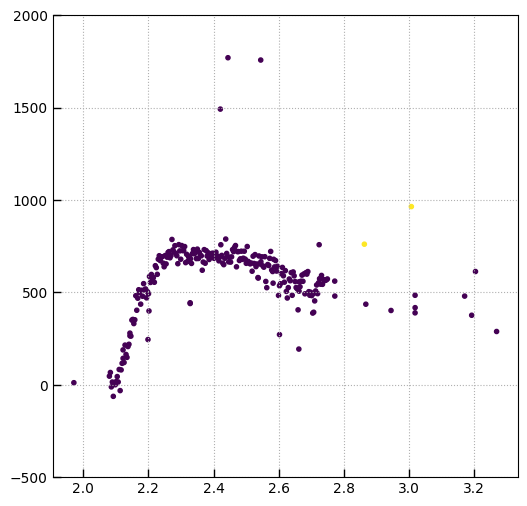

In [386]:
k = 'G140M-F070LP'
spec = fs_spectra
sp = fs_spectra[k]

inst_key = f"{fs_spectra[k].meta['FILTER']}_{spec[k].meta['GRATING']}"

SCALE_DISP = 1.4

# (control_points_2, control_points_3), control_weight = get_emission_line_control_points(sp, inst_key=inst_key, sn1=3, sn_order=2, weight=1e2)
(control_points_2, control_points_3), control_weight = get_emission_line_control_points(sp, inst_key=inst_key, sn1=3, sn_order=3, weight=1e2, manual_mask=True)

diff = utils.read_catalog('tyc4433_order3_f070lp.fits')
plt.plot(diff['wavelength'], diff['sensitivity_3'])

sens_3 = None

di = np.interp(diff['wavelength']/3, sp['wave'], sp['flux'], left=np.nan, right=np.nan)
ctempl3 = eazy.templates.Template(arrays=(ctempl.wave*3, ctempl.flux_flam()/3))
calspec_rebin3 = sp.resample_eazy_template(ctempl3, include_igm=False, scale_disp=SCALE_DISP*3, velocity_sigma=10) / 3

di = calspec_rebin3 * 1.0
d3 = np.array([diff['wavelength'], diff['sensitivity_3']*di, 1.e-6*diff['wavelength']**0*di]).T
d3 = d3[np.isfinite(d3[:,1]),:]

plt.close('all')

# plt.scatter(d3[:,0], d3[:,1])

d3[:,1] *= 0.7

control_points_3 = np.vstack([control_points_3, d3[::5,:]])
bad = control_points_3[:,1] > 1800
bad |= (control_points_3[:,1] > 740) & (control_points_3[:,0] > 2.8)

plt.scatter(control_points_3[:,0], control_points_3[:,1], c=bad)
control_points_3 = control_points_3[~bad]

plt.ylim(-500, 2000)
plt.grid()


F070LP_G140M
tyc4433_s200a1_sensitivity_F070LP_G140M.fits
remove order 4 contam
Fill with F100LP from  tyc4433_s200a1_sensitivity_F100LP_G140M.fits


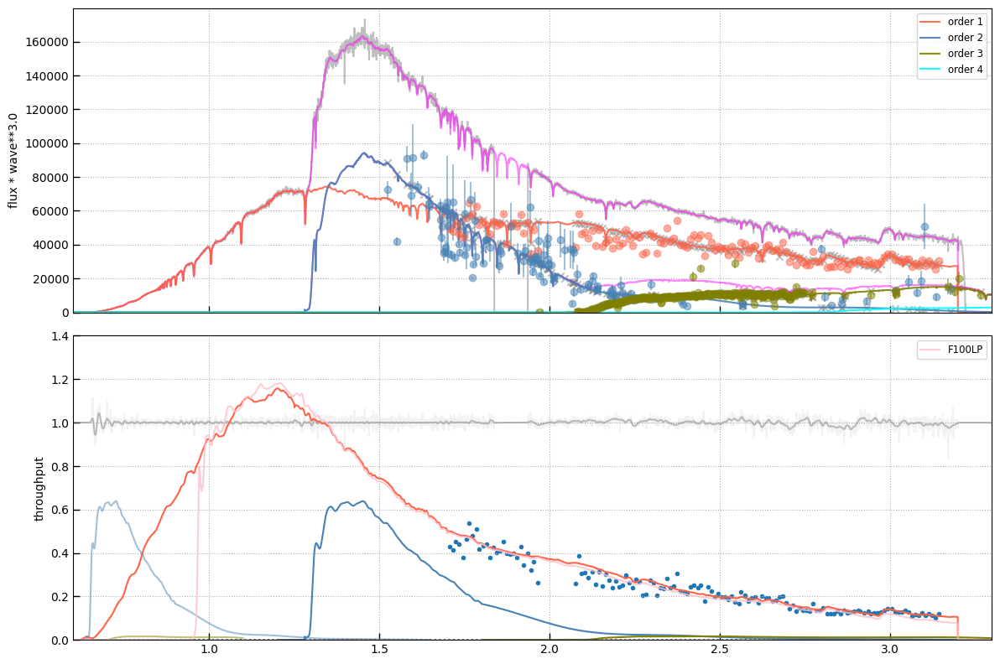

In [392]:
# sp.valid &= np.abs(sp["wave"] - 2.7375) > 0.0005

sp.valid &= sp["wave"] < 3.2

inst_key = f"{fs_spectra[k].meta['FILTER']}_{spec[k].meta['GRATING']}"
print(inst_key)

out_file = f'{out_prefix}_{slit_name}_sensitivity_{inst_key}.fits'
print(out_file)

oki = np.where(sp.valid)[0]
sp['flux'][oki[:2]] = 0

SCALE_DISP = 1.4

# First order
calspec_rebin = sp.resample_eazy_template(ctempl, include_igm=False, scale_disp=SCALE_DISP, velocity_sigma=10)

# Second order
ctempl2 = eazy.templates.Template(arrays=(ctempl.wave*2, ctempl.flux_flam()/2))
calspec_rebin2 = sp.resample_eazy_template(ctempl2, include_igm=False, scale_disp=SCALE_DISP*2, velocity_sigma=10)  / 2
#calspec_rebin2 *= np.interp(sp["wave"], sp["wave"]*2, sens_1)

# Third order
ctempl3 = eazy.templates.Template(arrays=(ctempl.wave*3, ctempl.flux_flam()/3))
calspec_rebin3 = sp.resample_eazy_template(ctempl3, include_igm=False, scale_disp=SCALE_DISP*3, velocity_sigma=10) / 3
# calspec_rebin3 *= np.interp(sp["wave"], sp["wave"]*3, sens_1)

# Wavelength cutoff of clean first order
wlim_1a = (0.6, 1.25)
df_1a = 51

wlim_1b = (wlim_1a[1], 3.4)
df_1b = 9

bspl_1a = utils.bspline_templates(sp["wave"], df=df_1a, get_matrix=True, minmax=wlim_1a).T
bspl_1b = utils.bspline_templates(sp["wave"], df=df_1b, get_matrix=True, minmax=wlim_1b).T

if (sens_3 is not None) & (0):
    print('insert sens_4')
    
    sens4 = np.interp(sp["wave"], sp["wave"]/3*4, sens_3 / calspec_rebin)
    # sens5 = np.interp(sp["wave"], sp["wave"]/3*5, sens_3 * calspec_rebin3 / calspec_rebin)
    bspl_1a = np.vstack([sens4, bspl_1a])
    df_1a += 1
    
    has_sens4 = True
else:
    has_sens4 = False

if (sens_3 is not None) & (1):
    print('remove order 4 contam')
    contam3 = calspec_rebin3 * sens_3
    excess_order4 = np.interp(sp['wave'], sp['wave']/3*4, contam3*0.15*3./4)
else:
    excess_order4 = np.zeros_like(sp['wave'])

if 1:
    print('Fill with F100LP from ', out_file.replace('F070LP_G140M','F100LP_G140M'))
    
    wd = utils.read_catalog(out_file.replace('F070LP_G140M','F100LP_G140M'))
    
    sens_interp = np.interp(sp["wave"], wd["wavelength"], wd["sensitivity"])
    sens_interp[sp["wave"] < wlim_1a[1]] = 0
    interp_mask = (sp["wave"] < wlim_1a[1]) | (sens_interp > 0)

    if 1:
        df_1b = 7
        bspl_1b = utils.bspline_templates(sp["wave"], df=df_1b, get_matrix=True, minmax=wlim_1b).T

        bspl_1b *= sens_interp
    else:
        df_1b = 1
        bspl_1b = sens_interp[None,:]
        
    # df_1b = 1 

else:
    interp_mask = sp.valid & True
    
# Split second order
wlim_2a = (1.28, 1.8)
df_2a = 61

wlim_2b = (wlim_2a[1], 3.4)
wlim_2b = (wlim_2a[1], 3.4)

df_2b = 9

bspl_2a = utils.bspline_templates(sp["wave"], df=df_2a, get_matrix=True, minmax=wlim_2a).T
bspl_2b = utils.bspline_templates(sp["wave"], df=df_2b, get_matrix=True, minmax=wlim_2b).T

# wlim_2 = (1.29, 3.3)
# df_2 = 71
# bspl_2 = utils.bspline_templates(sp["wave"], df=df_2, get_matrix=True, minmax=wlim_2).T

# Third order
# wlim_3 = (0.62*3, 3.3)
# df_3 = 9

# bspl_3 = utils.bspline_templates(sp["wave"], df=df_3, get_matrix=True, minmax=wlim_3).T
# # Flat
# # df_3, bspl_3 = 1, (sp["wave"] > wlim_3[0])[None,:]*1

# Split third order
wlim_3a = (2.05, 2.5)
df_3a = 15

wlim_3b = (wlim_3a[1], 3.4)
df_3b = 5

df_3 = df_3a + df_3b

bspl_3a = utils.bspline_templates(sp["wave"], df=df_3a, get_matrix=True, minmax=wlim_3a).T
bspl_3b = utils.bspline_templates(sp["wave"], df=df_3b, get_matrix=True, minmax=wlim_3b).T

# Slices
sl_1 = slice(2*has_sens4, df_1a + df_1b)
# sl_2 = slice(df_1a + df_1b, df_1a + df_1b + df_2)
# sl_3 = slice(df_1a + df_1b + df_2, df_1a + df_1b + df_2 + df_3)
sl_2 = slice(df_1a + df_1b, df_1a + df_1b + df_2a + df_2b)
sl_3 = slice(df_1a + df_1b + df_2a + df_2b, df_1a + df_1b + df_2a + df_2b + df_3)

# Control points for additional constraints

bspl_2c_1a = np.zeros( (df_1a, len(control_points_2) ))
bspl_2c_1b = np.zeros( (df_1b, len(control_points_2) ))
# bspl_2c = utils.bspline_templates(control_points_2[:,0], df=df_2, get_matrix=True, minmax=wlim_2).T
bspl_2ca = utils.bspline_templates(control_points_2[:,0], df=df_2a, get_matrix=True, minmax=wlim_2a).T
bspl_2cb = utils.bspline_templates(control_points_2[:,0], df=df_2b, get_matrix=True, minmax=wlim_2b).T
bspl_2c_3 = np.zeros( (df_3, len(control_points_2) ))

bspl_3c_1a = np.zeros( (df_1a, len(control_points_3) ))
bspl_3c_1b = np.zeros( (df_1b, len(control_points_3) ))
# bspl_3c_2 = np.zeros( (df_2, len(control_points_3) ))
bspl_3c_2a = np.zeros( (df_2a, len(control_points_3) ))
bspl_3c_2b = np.zeros( (df_2b, len(control_points_3) ))

if df_3 == 1:
    bspl_3c = np.ones( (df_3, len(control_points_3) ))
else:
    # bspl_3c = utils.bspline_templates(control_points_3[:,0], df=df_3, get_matrix=True, minmax=wlim_3).T
    bspl_3ca = utils.bspline_templates(control_points_3[:,0], df=df_3a, get_matrix=True, minmax=wlim_3a).T
    bspl_3cb = utils.bspline_templates(control_points_3[:,0], df=df_3b, get_matrix=True, minmax=wlim_3b).T

# bspl_2c *= np.interp(control_points_2[:,0], sp["wave"], calspec_rebin2)
bspl_2ca *= np.interp(control_points_2[:,0], sp["wave"], calspec_rebin2)
bspl_2cb *= np.interp(control_points_2[:,0], sp["wave"], calspec_rebin2)
# bspl_3c *= np.interp(control_points_3[:,0], sp["wave"], calspec_rebin3) 
bspl_3ca *= np.interp(control_points_3[:,0], sp["wave"], calspec_rebin3) 
bspl_3cb *= np.interp(control_points_3[:,0], sp["wave"], calspec_rebin3) 

# From spectrum ratio
sens_ratio = utils.read_catalog(glob.glob(f'/Users/gbrammer/Research/JWST/Projects/NIRSpec/ExtendWavelength/sensitivity_ratio_*{inst_key}.fits')[0])

control_points_1 = np.array([sens_ratio['wave'], sens_ratio['ratio'], sens_ratio['eratio']]).T
ci = np.interp(sens_ratio['wave'], sp['wave'], calspec_rebin)

control_points_1[:,1] *= ci
control_points_1[:,2] *= ci / control_weight / 10

bspl_1ca = np.array([np.interp(control_points_1[:,0], sp['wave'], bs * calspec_rebin) for bs in bspl_1a])
bspl_1cb = np.array([np.interp(control_points_1[:,0], sp['wave'], bs * calspec_rebin) for bs in bspl_1b])

bspl_1c_2a = np.zeros(( df_2a, len(control_points_1) ))
bspl_1c_2b = np.zeros(( df_2b, len(control_points_1) ))
bspl_1c_3a = np.zeros(( df_3a, len(control_points_1) ))
bspl_1c_3b = np.zeros(( df_3b, len(control_points_1) ))

control_points = np.vstack([control_points_1, control_points_2, control_points_3])

ncontrol = len(control_points)

# Valid data
ok = nd.binary_erosion(sp.valid, iterations=1) & (sp["wave"] > 0)
ok &= np.abs(sp["wave"] - 2.33) > 0.001
ok &= np.abs(sp["wave"] - 2.7375) > 0.001
ok &= sp["wave"] < 3.2
ok &= np.isfinite(sp["flux"])
ok &= interp_mask

# Design matrix
Ax_comp  = np.vstack([
    bspl_1a * calspec_rebin,
    bspl_1b * calspec_rebin,
    # bspl_2 * calspec_rebin2,
    bspl_2a * calspec_rebin2,
    bspl_2b * calspec_rebin2,
    # bspl_3 * calspec_rebin3,
    bspl_3a * calspec_rebin3,
    bspl_3b * calspec_rebin3,
]).T

Ax_1c  = np.vstack([
    bspl_1ca,
    bspl_1cb,
    # bspl_2c,
    bspl_1c_2a,
    bspl_1c_2b,
    bspl_1c_3a,
    bspl_1c_3b,
]).T

Ax_2c  = np.vstack([
    bspl_2c_1a,
    bspl_2c_1b,
    # bspl_2c,
    bspl_2ca,
    bspl_2cb,
    bspl_2c_3,
]).T

Ax_3c  = np.vstack([
    bspl_3c_1a,
    bspl_3c_1b,
    # bspl_3c_2,
    bspl_3c_2a,
    bspl_3c_2b,
    # bspl_3c,
    bspl_3ca,
    bspl_3cb,    
]).T

Axc = np.vstack([Ax_1c, Ax_2c, Ax_3c])

Ax = np.vstack([Ax_comp, (Axc.T / control_points[:,2]).T])
yx = np.append(sp["flux"] - excess_order4, control_points[:,1] / control_points[:,2])
ok = np.append(ok, np.ones(len(control_points), dtype=bool))
               
# Ax[~np.isfinite(Ax)] = 0

axt = utils.GTable()
axt["ok"] = ok
axt["yx"] = yx
axt["Ax"] = Ax
axt.write(out_file.replace('.fits','.data.fits'), overwrite=True)

if 0:
    coeff = np.linalg.lstsq(Ax[ok,:], yx[ok], rcond=None)
elif combined_coeff is not None:
    coeff = combined_coeff
else:
    coeff = nnls(Ax[ok,:], yx[ok])

####################
# plot results
####################

wpow = 3

full_model = Ax[:-ncontrol, :].dot(coeff[0])
control_model = Ax[-ncontrol:, :].dot(coeff[0]) * control_points[:,2] # control_weight

comp_1 = Ax[:-ncontrol, sl_1].dot(coeff[0][sl_1])
comp_2 = Ax[:-ncontrol, sl_2].dot(coeff[0][sl_2])
comp_3 = Ax[:-ncontrol, sl_3].dot(coeff[0][sl_3])

if has_sens4:
    comp_4 = Ax[:-ncontrol, :2].dot(coeff[0][:2])
else:
    comp_4 = None

sens_1 = Ax[:-ncontrol, sl_1].dot(coeff[0][sl_1]) / calspec_rebin
sens_2 = Ax[:-ncontrol, sl_2].dot(coeff[0][sl_2]) / calspec_rebin2
sens_3 = Ax[:-ncontrol, sl_3].dot(coeff[0][sl_3]) / calspec_rebin3

#####
# Figure
fig, axes = plt.subplots(2,1,figsize=(12,8), sharex=True)

ax = axes[0]
fscl = sp["wave"] ** wpow

resid = (sp["flux"] - excess_order4) / full_model
resid[sp["flux"] == 0] = 1.
resid[~np.isfinite(sp["flux"] - excess_order4)] = 1.
resid[~sp.valid] = 1.0

resid_sm = nd.gaussian_filter1d(resid, 5)

primary = (full_model - comp_2 - comp_3)
if 1:
    # Apply residuals to first order
    primary *= resid_sm
    full_model *= resid_sm
    sens_1 *= resid_sm

ax.plot(sp["wave"], (sp["flux"] - excess_order4) * fscl , color="0.5", alpha=0.5)
ax.plot(sp["wave"], full_model*fscl, color='magenta', alpha=0.5)
ax.plot(sp["wave"], (full_model - primary)*fscl, color='magenta', alpha=0.5)
ax.plot(sp["wave"], primary*fscl, color='tomato', alpha=0.9, label='order 1')
ax.plot(sp["wave"], comp_2*fscl, color='steelblue', alpha=0.9, label='order 2')
ax.plot(sp["wave"], comp_3*fscl, color='olive', alpha=0.9, label='order 3')

if np.nanmax(excess_order4) > 0:
    ax.plot(sp["wave"], excess_order4*fscl, color='cyan', label='order 4', alpha=0.9)
    
if comp_4 is not None:
    ax.plot(sp["wave"], comp_4*fscl*1000, color='cyan', alpha=0.9)

axes[1].plot(sp["wave"], resid, color="0.5", alpha=0.1)
axes[1].plot(sp["wave"], resid_sm, color="0.5", alpha=0.5)

axes[1].plot(sp["wave"], sens_1, color="tomato")

sub2 = sp["wave"] > 2*sp["wave"][0]
axes[1].plot(sp["wave"][sub2], sens_2[sub2], color="steelblue")
axes[1].plot(sp["wave"][sub2]/2, sens_2[sub2], alpha=0.5, color="steelblue")

axes[0].errorbar(
    control_points_1[:,0],
    control_points_1[:,1] * (control_points_1[:,0])**wpow, 
    control_points_1[:,2] * control_weight * (control_points_1[:,0])**wpow, 
    color="tomato", marker='o', alpha=0.5, linestyle='None')

axes[0].errorbar(
    control_points_2[:,0],
    control_points_2[:,1] * (control_points_2[:,0])**wpow, 
    control_points_2[:,2] * control_weight * (control_points_2[:,0])**wpow, 
    color="steelblue", marker='o', alpha=0.5, linestyle='None')

axes[0].errorbar(
    control_points_3[:,0],
    control_points_3[:,1] * (control_points_3[:,0])**wpow, 
    control_points_3[:,2] * control_weight * (control_points_3[:,0])**wpow, 
    color="olive", marker='o', alpha=0.5, linestyle='None')

axes[0].scatter(control_points[:,0], control_model * control_points[:,0]**wpow, fc="0.5", marker='x', alpha=0.5)

sub3 = sp["wave"] > 3*sp["wave"][0]
axes[1].plot(sp["wave"][sub3], sens_3[sub3], color="olive")
axes[1].plot(sp["wave"][sub3]/3, sens_3[sub3], color="olive", alpha=0.5)

axes[1].hlines([0] ,*ax.get_xlim(), color='0.5', linestyle=':')

ymax = np.nanmax((full_model * fscl)[np.isfinite(full_model * fscl)])
ax.set_ylim(0, ymax*1.1)

for ax in axes:
    ax.grid()
    
####### Write table
tab = utils.GTable()
tab["wavelength"] = sp["wave"]

sens_1[~np.isfinite(sens_1)] = 0
sens_2[~np.isfinite(sens_2)] = 0
sens_3[~np.isfinite(sens_3)] = 0

tab["sensitivity"] = sens_1
tab["sensitivity_2"] = np.interp(sp["wave"], sp["wave"][sub2]/2, sens_2[sub2], left=0, right=0) # * sens_1
tab["sensitivity_3"] = np.interp(sp["wave"], sp["wave"][sub3]/3, sens_3[sub3], left=0, right=0) # * sens_1

# plt.xlim(2.0, 2.)

plt.xlim(0.6, 3.3)

axes[0].set_ylabel(f"flux * wave**{wpow:.1f}")
axes[1].set_ylabel(f"throughput")

if 1:
    tab.write(out_file, overwrite=True)

f100 = utils.read_catalog(out_file.replace("F070","F100"))
axes[1].plot(f100["wavelength"], f100["sensitivity"], color='pink', alpha=0.8, label='F100LP')

# if (out_file != 'tyc4433_s1600a1_sensitivity_F070LP_G140M.fits'):
#     f100 = utils.read_catalog('tyc4433_s1600a1_sensitivity_F070LP_G140M.fits')
#     sscl = 0.8 if slit_name == 's200a1' else 1.0
#     axes[1].plot(f100["wavelength"], f100["sensitivity"]*sscl, color='bisque', label=f'tyc4433_s1600a1 x {sscl:0.1f}')

for ax in axes:
    ax.legend()

axes[1].set_ylim(0, 1.4)
if out_file.startswith('tyc4433_s1600'):
    axes[0].set_ylim(0, 1.5e5)

# plt.xlim(0.6, 0.9)

# axes[0].scatter(sens_ratio['wave'], ci * control_points_1[:,0]**wpow); axes[0].set_ylim(0, 5e5)
# axes[0].scatter(sens_ratio['wave'], sens_ratio['ratio'] * ci * control_points_1[:,0]**wpow, color='cyan', zorder=10000); axes[0].set_ylim(0, 5e5)


axes[1].scatter(sens_ratio['wave'], sens_ratio['ratio'])
# axes[0].errorbar(
#     control_points_1[:,0],
#     control_points_1[:,1] * control_points_1[:,0] ** wpow,
#     control_points_1[:,2] * control_points_1[:,0] ** wpow,
#     linestyle='None', marker='.', color='magenta')

fig.tight_layout(pad=1)
fig.savefig(out_file.replace('.fits','.png'))


## Merge F070LP and F100LP

Now go back and use the 2nd and 3rd orders from F070LP to update F100LP.  Iterate this a few times with the F070LP fit.

F070LP_G140M
tyc4433_s200a1_sensitivity_F070LP_G140M.fits


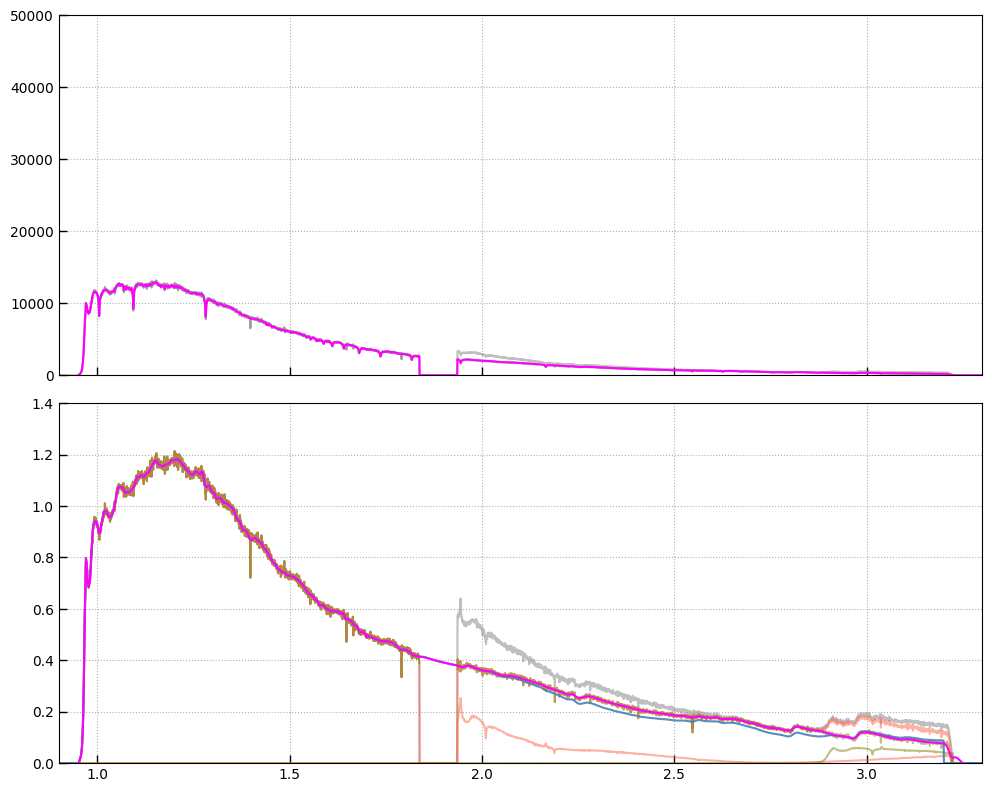

In [346]:
if 0:
    sp = msaexp.spectrum.SpectrumSampler('fs_1128_g140m-f100lp_1808347_s1600a1.spec.fits')
    s70 = utils.read_catalog('tyc4433_s1600a1_sensitivity_F070LP_G140M.fits')
    out_sens_file = 'tyc4433_s1600a1_sensitivity_F100LP_G140M.fits'
    s100 = utils.read_catalog(out_sens_file)
    this_ctempl = ctempl_tyc4433

elif 0:
    sp = msaexp.spectrum.SpectrumSampler('fs_1538_g140m-f100lp_p330e_s1600a1.spec.fits')
    s70 = utils.read_catalog('p330e_s1600a1_sensitivity_F070LP_G140M.fits')
    out_sens_file = 'p330e_s1600a1_sensitivity_F100LP_G140M.fits'
    s100 = utils.read_catalog(out_sens_file)
    this_ctempl = ctempl_p330e

else:
    sp = msaexp.spectrum.SpectrumSampler('fs_1487_g140m-f100lp_1743045_s200a1.spec.fits')
    s70 = utils.read_catalog('tyc4433_s200a1_sensitivity_F070LP_G140M.fits')
    out_sens_file = 'tyc4433_s200a1_sensitivity_F100LP_G140M.fits'
    s100 = utils.read_catalog(out_sens_file)
    this_ctempl = ctempl_j1743
    
# plt.plot(s70['wavelength'], s70['sensitivity_2'])

s2 = s70['sensitivity_2'] / s70['sensitivity'] * s100['sensitivity']

s3 = s70['sensitivity_3'] / s70['sensitivity'] * s100['sensitivity']

if 0:
    pl = plt.plot(s70['wavelength'], s2)
    plt.plot(s100['wavelength'], s100['sensitivity_2'], color=pl[0].get_color(), alpha=0.5, lw=2)
    pl = plt.plot(s70['wavelength'], s3, color='olive')
    plt.plot(s100['wavelength'], s100['sensitivity_3'], color=pl[0].get_color(), alpha=0.5, lw=2)
    plt.xlim(0.8, 1.7)


inst_key = f"{fs_spectra[k].meta['FILTER']}_{spec[k].meta['GRATING']}"
print(inst_key)

out_file = f'{out_prefix}_{slit_name}_sensitivity_{inst_key}.fits'
print(out_file)

oki = np.where(sp.valid)[0]
sp['flux'][oki[:2]] = 0

SCALE_DISP = 1.4

# First order
calspec_rebin = sp.resample_eazy_template(this_ctempl, include_igm=False, scale_disp=SCALE_DISP, velocity_sigma=10)

# Second order
ctempl2 = eazy.templates.Template(arrays=(this_ctempl.wave*2, this_ctempl.flux_flam()/2))
calspec_rebin2 = sp.resample_eazy_template(ctempl2, include_igm=False, scale_disp=SCALE_DISP*2, velocity_sigma=10)  / 2
#calspec_rebin2 *= np.interp(sp["wave"], sp["wave"]*2, sens_1)

# Third order
ctempl3 = eazy.templates.Template(arrays=(this_ctempl.wave*3, this_ctempl.flux_flam()/3))
calspec_rebin3 = sp.resample_eazy_template(ctempl3, include_igm=False, scale_disp=SCALE_DISP*3, velocity_sigma=10) / 3

contam2 = calspec_rebin2 * np.interp(sp['wave'], s70['wavelength']*2, s2, left=0, right=0)
contam3 = calspec_rebin3 * np.interp(sp['wave'], s70['wavelength']*3, s3, left=0, right=0)

contam2[~np.isfinite(contam2)] = 0
contam3[~np.isfinite(contam3)] = 0

fig, axes = plt.subplots(2,1,figsize=(10,8), sharex=True)

ax = axes[1]

ax.plot(sp['wave'], sp['flux'] / calspec_rebin * sp.valid, color='0.5', alpha=0.5)
ax.plot(sp['wave'], (sp['flux'] - contam2) / calspec_rebin * sp.valid, color='tomato', alpha=0.5)
ax.plot(sp['wave'], contam2 / calspec_rebin * sp.valid, color='tomato', alpha=0.5)
ax.plot(sp['wave'], contam3 / calspec_rebin * sp.valid, color='olive', alpha=0.5)

clean = (sp['flux'] - contam2 - contam3)
clean[~sp.valid] = np.nan

ax.plot(sp['wave'], clean / calspec_rebin, color='olive', alpha=0.5)

ax.plot(s100['wavelength'], s100['sensitivity'], color='steelblue', alpha=0.9)


wlim_1a = (0.92, 1.7)
df_1a = 131

wlim_1b = (wlim_1a[1], 3.4)
df_1b = 13

bspl_1a = utils.bspline_templates(sp["wave"], df=df_1a, get_matrix=True, minmax=wlim_1a).T
bspl_1b = utils.bspline_templates(sp["wave"], df=df_1b, get_matrix=True, minmax=wlim_1b).T

A = np.vstack([bspl_1a * calspec_rebin, bspl_1b * calspec_rebin,])

okt = np.nansum(A, axis=1) > 0
A = A[okt,:]

Ax = A / sp['full_err']
yx = clean / sp['full_err']

ok = np.isfinite(yx) & (sp.valid)
ok &= nd.binary_erosion(ok, iterations=3)

Ax[~np.isfinite(Ax)] = 0

coeffs = np.linalg.lstsq(Ax[:,ok].T, yx[ok], rcond=None)

full_model = A.T.dot(coeffs[0])
full_model[sp['wave'] < 0.98] = clean[sp['wave'] < 0.98]

resid = (clean) / full_model
resid[clean == 0] = 1.
resid[~np.isfinite(clean)] = 1.
resid[~sp.valid] = 1.0

resid_sm = nd.gaussian_filter1d(resid, 10)

sens_1 = full_model / calspec_rebin

if 1:
    # Apply residuals to first order
    full_model *= resid_sm
    sens_1 *= resid_sm

axes[0].plot(sp['wave'], sp['flux'], color='0.5', alpha=0.5)
axes[0].plot(sp['wave'], clean, color='0.5', alpha=0.5)
axes[0].plot(sp['wave'], full_model*sp.valid, color='magenta')

axes[1].plot(sp['wave'], sens_1, color='magenta')

axes[0].grid()

ax.set_xlim(0.9, 3.3)

# plt.xlim(0.9, 1.5)

# plt.xlim(1.9, 3.2); plt.ylim(0, 0.6)

axes[1].set_ylim(0, 1.4)
axes[0].set_ylim(0, 5e4)

ax.grid()
fig.tight_layout(pad=1)

s100 = utils.read_catalog(out_sens_file)

# plt.plot(s70['wavelength'], s70['sensitivity_2'])
sens_1[sens_1 < 0] = 0
sens_1[~np.isfinite(sens_1)] = 0.
sens_1[s100['wavelength'] > 3.2] = 0

s100['sensitivity'] = sens_1

# axes[1].plot(s100['wavelength'], sens_1, color='k')

s100['sensitivity_2'] = s70['sensitivity_2'] / s70['sensitivity'] * s100['sensitivity']
s100['sensitivity_3'] = s70['sensitivity_3'] / s70['sensitivity'] * s100['sensitivity']

s100.write(out_sens_file, overwrite=True)

## Go back and iterate [F070LP](#F070LP) again.

## G235M

In [ ]:
k = 'G235M-F170LP'

sp = fs_spectra[k]

inst_key = f"{fs_spectra[k].meta['FILTER']}_{spec[k].meta['GRATING']}"

if 1:
    (control_points_2, control_points_3), control_weight = get_emission_line_control_points(
        sp, inst_key=inst_key, sn1=3, sn_order=3, weight=1e2, manual_mask=True
    )
else:
    (control_points_2, control_points_3), control_weight = get_emission_line_control_points(
        sp, inst_key=inst_key, force_wavecal=True, sn1=3, sn_order=3, weight=1e5, manual_mask=False
    )

plt.plot(sp["wave"], sp["flux"]/2e4)

sens_2 = sens_3 = None

control_points_3[:,1:] *= 1.3

In [ ]:
sp.valid &= np.abs(sp["wave"] - 2.7375) > 0.0005
sp.valid &= np.abs(sp["wave"] - 2.330) > 0.0005

inst_key = f"{fs_spectra[k].meta['FILTER']}_{spec[k].meta['GRATING']}"
print(inst_key)

out_file = f'{out_prefix}_{slit_name}_sensitivity_{inst_key}.fits'
print(out_file)

oki = np.where(sp.valid)[0]
sp['flux'][oki[:2]] = 0

SCALE_DISP = 1.4

# First order
calspec_rebin = sp.resample_eazy_template(ctempl, include_igm=False, scale_disp=SCALE_DISP, velocity_sigma=10)

# Second order
ctempl2 = eazy.templates.Template(arrays=(ctempl.wave*2, ctempl.flux_flam()/2))
calspec_rebin2 = sp.resample_eazy_template(ctempl2, include_igm=False, scale_disp=SCALE_DISP*2, velocity_sigma=10)  / 2
#calspec_rebin2 *= np.interp(sp["wave"], sp["wave"]*2, sens_1)

# Third order
ctempl3 = eazy.templates.Template(arrays=(ctempl.wave*3, ctempl.flux_flam()/3))
calspec_rebin3 = sp.resample_eazy_template(ctempl3, include_igm=False, scale_disp=SCALE_DISP*3, velocity_sigma=10) / 3
# calspec_rebin3 *= np.interp(sp["wave"], sp["wave"]*3, sens_1)

# Wavelength cutoff of clean first order
wlim_1a = (1.5, 2.8)
df_1a = 71

wlim_1b = (wlim_1a[1], 5.4)
df_1b = 15

bspl_1a = utils.bspline_templates(sp["wave"], df=df_1a, get_matrix=True, minmax=wlim_1a).T
bspl_1b = utils.bspline_templates(sp["wave"], df=df_1b, get_matrix=True, minmax=wlim_1b).T

# if 0:
#     wd = utils.read_catalog(out_file.replace('F070LP_G140M','F100LP_G140M'))
    
#     bspl_1b = np.interp(sp["wave"], wd["wavelength"], wd["sensitivity"])
#     bspl_1b[sp["wave"] < wlim_1a[1]] = 0
#     bspl_1b = bspl_1b[None,:]
#     df_1b = 1 

# Split second order
wlim_2a = (3.2, 3.5)
df_2a = 11

if out_file.startswith('tyc4433_s200a1'):
    print('second order for tyc4433_s200a1')
    wlim_2a = (3.21, 3.5)
    df_2a = 7
    
wlim_2b = (wlim_2a[1], 5.4)
df_2b = 5

bspl_2a = utils.bspline_templates(sp["wave"], df=df_2a, get_matrix=True, minmax=wlim_2a).T
bspl_2b = utils.bspline_templates(sp["wave"], df=df_2b, get_matrix=True, minmax=wlim_2b).T

# wlim_2 = (1.29, 3.3)
# df_2 = 71
# bspl_2 = utils.bspline_templates(sp["wave"], df=df_2, get_matrix=True, minmax=wlim_2).T

# Third order
wlim_3 = (1.6*3, 5.5)
df_3 = 9

bspl_3 = utils.bspline_templates(sp["wave"], df=df_3, get_matrix=True, minmax=wlim_3).T
# Flat
# df_3, bspl_3 = 1, (sp["wave"] > wlim_3[0])[None,:]*1
# sens_2

# df_3, bspl_3 = 1, (sp["wave"] > wlim_3[0])[None,:]*1
if (sens_2 is not None) & (1) & (not out_file.startswith('p330e_s1600a1')):
    print('Match shape of order 3 to order 2')
    df_3 = 5
    bspl_3 = utils.bspline_templates(sp["wave"], df=df_3, get_matrix=True, minmax=wlim_3).T
    bspl_3 *= np.interp(sp["wave"], sp["wave"]/2*3, sens_2 / np.nanmax(sens_2), left=0, right=0)

    if 1:
        print('flat order 3')
        df_3, bspl_3 = 1, (sp["wave"] > wlim_3[0])[None,:]*1.0
        bspl_3 *= np.interp(sp["wave"], sp["wave"]/2*3, sens_2 / np.nanmax(sens_2), left=0, right=0)

    order_3_match = True
else:
    order_3_match = False


# df_3, bspl_3 = 1, np.interp(sp["wave"], sp["wave"]/2*3, sens_2 / np.nanmax(sens_2))[None,:]*5

# Slices
sl_1 = slice(0, df_1a + df_1b)
# sl_2 = slice(df_1a + df_1b, df_1a + df_1b + df_2)
# sl_3 = slice(df_1a + df_1b + df_2, df_1a + df_1b + df_2 + df_3)
sl_2 = slice(df_1a + df_1b, df_1a + df_1b + df_2a + df_2b)
sl_3 = slice(df_1a + df_1b + df_2a + df_2b, df_1a + df_1b + df_2a + df_2b + df_3)

# Control points for additional constraints

bspl_2c_1a = np.zeros( (df_1a, len(control_points_2) ))
bspl_2c_1b = np.zeros( (df_1b, len(control_points_2) ))
# bspl_2c = utils.bspline_templates(control_points_2[:,0], df=df_2, get_matrix=True, minmax=wlim_2).T
bspl_2ca = utils.bspline_templates(control_points_2[:,0], df=df_2a, get_matrix=True, minmax=wlim_2a).T
bspl_2cb = utils.bspline_templates(control_points_2[:,0], df=df_2b, get_matrix=True, minmax=wlim_2b).T
bspl_2c_3 = np.zeros( (df_3, len(control_points_2) ))

bspl_3c_1a = np.zeros( (df_1a, len(control_points_3) ))
bspl_3c_1b = np.zeros( (df_1b, len(control_points_3) ))
# bspl_3c_2 = np.zeros( (df_2, len(control_points_3) ))
bspl_3c_2a = np.zeros( (df_2a, len(control_points_3) ))
bspl_3c_2b = np.zeros( (df_2b, len(control_points_3) ))

if df_3 == 1:
    bspl_3c = np.ones( (df_3, len(control_points_3) ))
else:
    bspl_3c = utils.bspline_templates(control_points_3[:,0], df=df_3, get_matrix=True, minmax=wlim_3).T

if order_3_match:
    bspl_3c *= np.interp(control_points_3[:,0], sp["wave"]/2*3, sens_2 / np.nanmax(sens_2), left=0, right=0)

# bspl_2c *= np.interp(control_points_2[:,0], sp["wave"], calspec_rebin2)
bspl_2ca *= np.interp(control_points_2[:,0], sp["wave"], calspec_rebin2)
bspl_2cb *= np.interp(control_points_2[:,0], sp["wave"], calspec_rebin2)
bspl_3c *= np.interp(control_points_3[:,0], sp["wave"], calspec_rebin3) 

# From spectrum ratio
sens_ratio = utils.read_catalog(glob.glob(f'/Users/gbrammer/Research/JWST/Projects/NIRSpec/ExtendWavelength/sensitivity_ratio_*{inst_key}.fits')[0])

control_points_1 = np.array([sens_ratio['wave'], sens_ratio['ratio'], sens_ratio['eratio']]).T
ci = np.interp(sens_ratio['wave'], sp['wave'], calspec_rebin)

control_points_1[:,1] *= ci * 0.95
control_points_1[:,2] *= ci / control_weight / 10
okc = control_points_1[:,0] > 3
control_points_1 = control_points_1[okc,:]

bspl_1ca = np.array([np.interp(control_points_1[:,0], sp['wave'], bs * calspec_rebin) for bs in bspl_1a])
bspl_1cb = np.array([np.interp(control_points_1[:,0], sp['wave'], bs * calspec_rebin) for bs in bspl_1b])

bspl_1c_2a = np.zeros(( df_2a, len(control_points_1) ))
bspl_1c_2b = np.zeros(( df_2b, len(control_points_1) ))
bspl_1c_3 = np.zeros(( df_3, len(control_points_1) ))

control_points = np.vstack([control_points_1, control_points_2, control_points_3])

ncontrol = len(control_points)

# Valid data
ok = nd.binary_erosion(sp.valid, iterations=1) & (sp["wave"] > 0)
# ok &= np.abs(sp["wave"] - 2.33) > 0.001
# ok &= np.abs(sp["wave"] - 2.7375) > 0.001
#ok &= sp["wave"] < 3.2
ok &= np.isfinite(sp["flux"])

# Design matrix
Ax_comp  = np.vstack([
    bspl_1a * calspec_rebin,
    bspl_1b * calspec_rebin,
    # bspl_2 * calspec_rebin2,
    bspl_2a * calspec_rebin2,
    bspl_2b * calspec_rebin2,
    bspl_3 * calspec_rebin3,
]).T

Ax_1c  = np.vstack([
    bspl_1ca,
    bspl_1cb,
    # bspl_2c,
    bspl_1c_2a,
    bspl_1c_2b,
    bspl_1c_3,
]).T

Ax_2c  = np.vstack([
    bspl_2c_1a,
    bspl_2c_1b,
    # bspl_2c,
    bspl_2ca,
    bspl_2cb,
    bspl_2c_3,
]).T

Ax_3c  = np.vstack([
    bspl_3c_1a,
    bspl_3c_1b,
    # bspl_3c_2,
    bspl_3c_2a,
    bspl_3c_2b,
    bspl_3c,
]).T

Axc = np.vstack([Ax_1c, Ax_2c, Ax_3c])

Ax = np.vstack([Ax_comp, (Axc.T / control_points[:,2]).T])
yx = np.append(sp["flux"], control_points[:,1] / control_points[:,2])
ok = np.append(ok, np.ones(len(control_points), dtype=bool))
               
# Ax[~np.isfinite(Ax)] = 0

axt = utils.GTable()
axt["ok"] = ok
axt["yx"] = yx
axt["Ax"] = Ax
axt.write(out_file.replace('.fits','.data.fits'), overwrite=True)

Ax[~np.isfinite(Ax)] = 0

if 0:
    coeff = np.linalg.lstsq(Ax[ok,:], yx[ok], rcond=None)
elif combined_coeff is not None:
    coeff = combined_coeff
else:
    coeff = nnls(Ax[ok,:], yx[ok])

####################
# plot results
####################

wpow = 2

full_model = Ax[:-ncontrol, :].dot(coeff[0])
control_model = Ax[-ncontrol:, :].dot(coeff[0]) * control_points[:,2] # control_weight

comp_2 = Ax[:-ncontrol, sl_2].dot(coeff[0][sl_2])
comp_3 = Ax[:-ncontrol, sl_3].dot(coeff[0][sl_3])

sens_1 = Ax[:-ncontrol, sl_1].dot(coeff[0][sl_1]) / calspec_rebin
sens_2 = Ax[:-ncontrol, sl_2].dot(coeff[0][sl_2]) / calspec_rebin2
sens_3 = Ax[:-ncontrol, sl_3].dot(coeff[0][sl_3]) / calspec_rebin3

#####
# Figure
fig, axes = plt.subplots(2,1,figsize=(12,8), sharex=True)

ax = axes[0]
fscl = sp["wave"] ** wpow

resid = sp["flux"] / full_model
resid[sp["flux"] == 0] = 1.
resid[~np.isfinite(sp["flux"])] = 1.
resid[~sp.valid] = 1.0

resid_sm = nd.gaussian_filter1d(resid, 5)

primary = (full_model - comp_2 - comp_3)
if 1:
    # Apply residuals to first order
    primary *= resid_sm
    full_model *= resid_sm
    sens_1 *= resid_sm

ax.plot(sp["wave"], sp["flux"] * fscl , color="0.5", alpha=0.5)
ax.plot(sp["wave"], full_model*fscl, color='magenta', alpha=0.5)
ax.plot(sp["wave"], (full_model - primary)*fscl, color='magenta', alpha=0.5)
ax.plot(sp["wave"], primary*fscl, color='tomato', alpha=0.9)
ax.plot(sp["wave"], comp_2*fscl, color='steelblue', alpha=0.9)
ax.plot(sp["wave"], comp_3*fscl, color='olive', alpha=0.9)

axes[1].plot(sp["wave"], resid, color="0.5", alpha=0.1)
axes[1].plot(sp["wave"], resid_sm, color="0.5", alpha=0.5)

axes[1].plot(sp["wave"], sens_1, color="tomato")

sub2 = sp["wave"] > 2*sp["wave"][0]
axes[1].plot(sp["wave"][sub2], sens_2[sub2], color="steelblue")
axes[1].plot(sp["wave"][sub2]/2, sens_2[sub2], alpha=0.5, color="steelblue")

axes[0].errorbar(
    control_points_1[:,0],
    control_points_1[:,1] * (control_points_1[:,0])**wpow, 
    control_points_1[:,2] * control_weight * (control_points_1[:,0])**wpow, 
    color="tomato", marker='o', alpha=0.5, linestyle='None')

axes[0].errorbar(
    control_points_2[:,0],
    control_points_2[:,1] * (control_points_2[:,0])**wpow, 
    control_points_2[:,2] * control_weight * (control_points_2[:,0])**wpow, 
    color="steelblue", marker='o', alpha=0.5, linestyle='None')

axes[0].errorbar(
    control_points_3[:,0],
    control_points_3[:,1] * (control_points_3[:,0])**wpow, 
    control_points_3[:,2] * control_weight * (control_points_3[:,0])**wpow, 
    color="olive", marker='o', alpha=0.5, linestyle='None')

axes[0].scatter(control_points[:,0], control_model * control_points[:,0]**wpow, fc="0.5", marker='x', alpha=0.5)

sub3 = sp["wave"] > 3*sp["wave"][0]
axes[1].plot(sp["wave"][sub3], sens_3[sub3], color="olive")
axes[1].plot(sp["wave"][sub3]/3, sens_3[sub3], color="olive", alpha=0.1)

axes[1].hlines([0] ,*ax.get_xlim(), color='0.5', linestyle=':')

ymax = np.nanmax((full_model * fscl)[np.isfinite(full_model * fscl)])
ax.set_ylim(0, ymax*1.1)

for ax in axes:
    ax.grid()
    
####### Write table
tab = utils.GTable()
tab["wavelength"] = sp["wave"]

sens_1[~np.isfinite(sens_1)] = 0
sens_2[~np.isfinite(sens_2)] = 0
sens_3[~np.isfinite(sens_3)] = 0

tab["sensitivity"] = sens_1
tab["sensitivity_2"] = np.interp(sp["wave"], sp["wave"][sub2]/2, sens_2[sub2], left=0, right=0) # * sens_1
tab["sensitivity_3"] = np.interp(sp["wave"], sp["wave"][sub3]/3, sens_3[sub3], left=0, right=0) # * sens_1

# plt.xlim(2.0, 2.)
axes[1].set_ylim(0, 1.5)

plt.xlim(1.5, 5.4)

if 1:
    tab.write(out_file, overwrite=True)

axes[1].legend()

fig.tight_layout(pad=1)
fig.savefig(out_file.replace('.fits','.png'))


## G395M

In [ ]:
k = 'G395M-F290LP'

sp = fs_spectra[k]
sens2 = np.ones(len(sp["wave"]))

inst_key = f"{fs_spectra[k].meta['FILTER']}_{spec[k].meta['GRATING']}"

(control_points_2, control_points_3), control_weight = get_emission_line_control_points(sp, inst_key=inst_key, sn1=3, sn_order=3, weight=1e2)

sens_3 = np.ones(sp.NSPEC)

In [ ]:
sp.valid &= np.abs(sp["wave"] - 2.7375) > 0.0005

inst_key = f"{fs_spectra[k].meta['FILTER']}_{spec[k].meta['GRATING']}"
print(inst_key)

out_file = f'{out_prefix}_{slit_name}_sensitivity_{inst_key}.fits'
print(out_file)

oki = np.where(sp.valid)[0]
sp['flux'][oki[:2]] = 0

SCALE_DISP = 1.4

# First order
calspec_rebin = sp.resample_eazy_template(ctempl, include_igm=False, scale_disp=SCALE_DISP, velocity_sigma=10)

# Second order
ctempl2 = eazy.templates.Template(arrays=(ctempl.wave*2, ctempl.flux_flam()/2))
calspec_rebin2 = sp.resample_eazy_template(ctempl2, include_igm=False, scale_disp=SCALE_DISP*2, velocity_sigma=10)  / 2
#calspec_rebin2 *= np.interp(sp["wave"], sp["wave"]*2, sens_1)

# Wavelength cutoff of clean first order
wlim_1a = (2.5, 4.9)
df_1a = 71

wlim_1b = (wlim_1a[1], 5.6)
df_1b = 7

bspl_1a = utils.bspline_templates(sp["wave"], df=df_1a, get_matrix=True, minmax=wlim_1a).T
bspl_1b = utils.bspline_templates(sp["wave"], df=df_1b, get_matrix=True, minmax=wlim_1b).T

# if 0:
#     wd = utils.read_catalog(out_file.replace('F070LP_G140M','F100LP_G140M'))
    
#     bspl_1b = np.interp(sp["wave"], wd["wavelength"], wd["sensitivity"])
#     bspl_1b[sp["wave"] < wlim_1a[1]] = 0
#     bspl_1b = bspl_1b[None,:]
#     df_1b = 1 

wlim_2 = (5.5, 5.7)
df_2 = 11
bspl_2 = utils.bspline_templates(sp["wave"], df=df_2, get_matrix=True, minmax=wlim_2).T

# Slices
sl_1 = slice(0, df_1a + df_1b)
sl_2 = slice(df_1a + df_1b, df_1a + df_1b + df_2)

# Control points for additional constraints

bspl_2c_1a = np.zeros( (df_1a, len(control_points_2) ))
bspl_2c_1b = np.zeros( (df_1b, len(control_points_2) ))

bspl_2c = utils.bspline_templates(control_points_2[:,0], df=df_2, get_matrix=True, minmax=wlim_2).T
bspl_2c *= np.interp(control_points_2[:,0], sp["wave"], calspec_rebin2)

control_points = np.vstack([control_points_2,])

ncontrol = len(control_points)

# Valid data
ok = nd.binary_erosion(sp.valid, iterations=1) & (sp["wave"] > 0)
# ok &= np.abs(sp["wave"] - 2.33) > 0.001
# ok &= np.abs(sp["wave"] - 2.7375) > 0.001
#ok &= sp["wave"] < 3.2
ok &= np.isfinite(sp["flux"])

# Design matrix
Ax_comp  = np.vstack([
    bspl_1a * calspec_rebin,
    bspl_1b * calspec_rebin,
    bspl_2 * calspec_rebin2,
]).T

Ax_2c  = np.vstack([
    bspl_2c_1a,
    bspl_2c_1b,
    bspl_2c,
]).T

Axc = Ax_2c*1

Ax = np.vstack([Ax_comp, (Axc.T / control_points[:,2]).T])
yx = np.append(sp["flux"], control_points[:,1] / control_points[:,2])
ok = np.append(ok, np.ones(len(control_points), dtype=bool))
               
# Ax[~np.isfinite(Ax)] = 0

axt = utils.GTable()
axt["ok"] = ok
axt["yx"] = yx
axt["Ax"] = Ax
axt.write(out_file.replace('.fits','.data.fits'), overwrite=True)

if 0:
    coeff = np.linalg.lstsq(Ax[ok,:], yx[ok], rcond=None)
elif combined_coeff is not None:
    coeff = combined_coeff
else:
    coeff = nnls(Ax[ok,:], yx[ok])

####################
# plot results
####################

wpow = 2

full_model = Ax[:-ncontrol, :].dot(coeff[0])
control_model = Ax[-ncontrol:, :].dot(coeff[0]) * control_points[:,2] # control_weight

comp_2 = Ax[:-ncontrol, sl_2].dot(coeff[0][sl_2])

sens_1 = Ax[:-ncontrol, sl_1].dot(coeff[0][sl_1]) / calspec_rebin
sens_2 = Ax[:-ncontrol, sl_2].dot(coeff[0][sl_2]) / calspec_rebin2

#####
# Figure
fig, axes = plt.subplots(2,1,figsize=(12,8), sharex=True)

ax = axes[0]
fscl = sp["wave"] ** wpow

resid = sp["flux"] / full_model
resid[sp["flux"] == 0] = 1.
resid[~np.isfinite(sp["flux"])] = 1.
resid[~sp.valid] = 1.0

resid_sm = nd.gaussian_filter1d(resid, 5)

primary = (full_model - comp_2)

if 1:
    # Apply residuals to first order
    primary *= resid_sm
    full_model *= resid_sm
    sens_1 *= resid_sm

ax.plot(sp["wave"], sp["flux"] * fscl , color="0.5", alpha=0.5)
ax.plot(sp["wave"], full_model*fscl, color='magenta', alpha=0.5)
ax.plot(sp["wave"], (full_model - primary)*fscl, color='magenta', alpha=0.5)
ax.plot(sp["wave"], primary*fscl, color='tomato', alpha=0.9)
ax.plot(sp["wave"], comp_2*fscl, color='steelblue', alpha=0.9)

axes[1].plot(sp["wave"], resid, color="0.5", alpha=0.1)
axes[1].plot(sp["wave"], resid_sm, color="0.5", alpha=0.5)

axes[1].plot(sp["wave"], sens_1, color="tomato")

sub2 = sp["wave"] > 2*sp["wave"][0]
axes[1].plot(sp["wave"][sub2], sens_2[sub2], color="steelblue")
axes[1].plot(sp["wave"][sub2]/2, sens_2[sub2], alpha=0.5, color="steelblue")

axes[0].errorbar(
    control_points_2[:,0],
    control_points_2[:,1] * (control_points_2[:,0])**wpow, 
    control_points_2[:,2] * control_weight * (control_points_2[:,0])**wpow, 
    color="steelblue", marker='o', alpha=0.5, linestyle='None')

axes[0].scatter(control_points[:,0], control_model * control_points[:,0]**wpow, fc="0.5", marker='x', alpha=0.5)

axes[1].hlines([0] ,*ax.get_xlim(), color='0.5', linestyle=':')

ymax = np.nanmax((full_model * fscl)[np.isfinite(full_model * fscl)])
ax.set_ylim(0, ymax*1.1)

for ax in axes:
    ax.grid()
    
####### Write table
tab = utils.GTable()
tab["wavelength"] = sp["wave"]

sens_1[~np.isfinite(sens_1)] = 0
sens_2[~np.isfinite(sens_2)] = 0

tab["sensitivity"] = sens_1
tab["sensitivity_2"] = np.interp(sp["wave"], sp["wave"][sub2]/2, sens_2[sub2], left=0, right=0) # * sens_1
tab["sensitivity_3"] = 0.0

# plt.xlim(2.0, 2.)
axes[1].set_ylim(0, 1.5)

plt.xlim(2.6, 5.7)

if 1:
    tab.write(out_file, overwrite=True)

# f100 = utils.read_catalog(out_file.replace("F070","F100"))
# axes[1].plot(f100["wavelength"], f100["sensitivity"], color='pink', alpha=0.8)

fig.tight_layout(pad=1)
fig.savefig(out_file.replace('.fits','.png'))


## H Gratings G140H-F100LP

In [ ]:
k = 'G140H-F100LP'
sp = fs_spectra[k]


inst_key = f"{fs_spectra[k].meta['FILTER']}_{spec[k].meta['GRATING']}"

# (control_points_2, control_points_3), control_weight = get_emission_line_control_points(sp, inst_key=inst_key, sn1=3, sn_order=2, weight=1e2)
(control_points_2, control_points_3), control_weight = get_emission_line_control_points(sp, inst_key=inst_key, sn1=3, sn_order=3, weight=1e2)

plt.plot(sp["wave"], sp["flux"])
plt.ylim(1.e-4, 10000)

sens_2 = None

In [ ]:

# sp.valid &= np.abs(sp["wave"] - 2.7375) > 0.0005

sp.valid &= sp["wave"] < 1.81

inst_key = f"{fs_spectra[k].meta['FILTER']}_{spec[k].meta['GRATING']}"
print(inst_key)

out_file = f'{out_prefix}_{slit_name}_sensitivity_{inst_key}.fits'
print(out_file)

oki = np.where(sp.valid)[0]
sp['flux'][oki[:2]] = 0

SCALE_DISP = 0.8

# First order
if out_file.startswith('tyc4433_s200a1'):
    z = 0.00035
    z = 0
    
calspec_rebin = sp.resample_eazy_template(ctempl, z=z, include_igm=False, scale_disp=SCALE_DISP, velocity_sigma=10)

# Second order
ctempl2 = eazy.templates.Template(arrays=(ctempl.wave*2, ctempl.flux_flam()/2))
calspec_rebin2 = sp.resample_eazy_template(ctempl2, include_igm=False, scale_disp=SCALE_DISP*2, velocity_sigma=10)  / 2
#calspec_rebin2 *= np.interp(sp["wave"], sp["wave"]*2, sens_1)

# Third order
ctempl3 = eazy.templates.Template(arrays=(ctempl.wave*3, ctempl.flux_flam()/3))
calspec_rebin3 = sp.resample_eazy_template(ctempl3, include_igm=False, scale_disp=SCALE_DISP*3, velocity_sigma=10) / 3
# calspec_rebin3 *= np.interp(sp["wave"], sp["wave"]*3, sens_1)

# Wavelength cutoff of clean first order
wlim_1a = (0.85, 1.9)
df_1a = 71

wlim_1b = (wlim_1a[1], 3.4)
df_1b = 9

bspl_1a = utils.bspline_templates(sp["wave"], df=df_1a, get_matrix=True, minmax=wlim_1a).T
bspl_1b = utils.bspline_templates(sp["wave"], df=df_1b, get_matrix=True, minmax=wlim_1b).T

# Split second order
wlim_2a = (1.9, 2.23)
df_2a = 11

if out_prefix == 'j1743045-cal1487':
    print('set 2nd order for j1743045-cal1487')
    wlim_2a = (1.9, 2.2)

    df_2a = 25
    
wlim_2b = (wlim_2a[1], 3.4)
df_2b = 5

bspl_2a = utils.bspline_templates(sp["wave"], df=df_2a, get_matrix=True, minmax=wlim_2a).T
bspl_2b = utils.bspline_templates(sp["wave"], df=df_2b, get_matrix=True, minmax=wlim_2b).T

# wlim_2 = (1.29, 3.3)
# df_2 = 71
# bspl_2 = utils.bspline_templates(sp["wave"], df=df_2, get_matrix=True, minmax=wlim_2).T

# Third order
wlim_3 = (0.92*3, 3.3)
df_3 = 5

bspl_3 = utils.bspline_templates(sp["wave"], df=df_3, get_matrix=True, minmax=wlim_3).T

# Flat
# df_3, bspl_3 = 1, (sp["wave"] > wlim_3[0])[None,:]*1
if (sens_2 is not None) & (0):
    print('Match shape of order 3 to order 2')
    df_3 = 5
    bspl_3 = utils.bspline_templates(sp["wave"], df=df_3, get_matrix=True, minmax=wlim_3).T
    bspl_3 *= np.interp(sp["wave"], sp["wave"]/2*3, sens_2 / np.nanmax(sens_2), left=0, right=0)

    if 0:
        print('flat order 3')
        df_3, bspl_3 = 1, (sp["wave"] > wlim_3[0])[None,:]*1.0
        bspl_3 *= np.interp(sp["wave"], sp["wave"]/2*3, sens_2 / np.nanmax(sens_2), left=0, right=0)

    order_3_match = True
else:
    order_3_match = False

# Slices
sl_1 = slice(0, df_1a + df_1b)
# sl_2 = slice(df_1a + df_1b, df_1a + df_1b + df_2)
# sl_3 = slice(df_1a + df_1b + df_2, df_1a + df_1b + df_2 + df_3)
sl_2 = slice(df_1a + df_1b, df_1a + df_1b + df_2a + df_2b)
sl_3 = slice(df_1a + df_1b + df_2a + df_2b, df_1a + df_1b + df_2a + df_2b + df_3)

# Control points for additional constraints

bspl_2c_1a = np.zeros( (df_1a, len(control_points_2) ))
bspl_2c_1b = np.zeros( (df_1b, len(control_points_2) ))
# bspl_2c = utils.bspline_templates(control_points_2[:,0], df=df_2, get_matrix=True, minmax=wlim_2).T
bspl_2ca = utils.bspline_templates(control_points_2[:,0], df=df_2a, get_matrix=True, minmax=wlim_2a).T
bspl_2cb = utils.bspline_templates(control_points_2[:,0], df=df_2b, get_matrix=True, minmax=wlim_2b).T
bspl_2c_3 = np.zeros( (df_3, len(control_points_2) ))

bspl_3c_1a = np.zeros( (df_1a, len(control_points_3) ))
bspl_3c_1b = np.zeros( (df_1b, len(control_points_3) ))
# bspl_3c_2 = np.zeros( (df_2, len(control_points_3) ))
bspl_3c_2a = np.zeros( (df_2a, len(control_points_3) ))
bspl_3c_2b = np.zeros( (df_2b, len(control_points_3) ))

if df_3 == 1:
    bspl_3c = np.ones( (df_3, len(control_points_3) ))
else:
    bspl_3c = utils.bspline_templates(control_points_3[:,0], df=df_3, get_matrix=True, minmax=wlim_3).T

if order_3_match:
    bspl_3c *= np.interp(control_points_3[:,0], sp["wave"]/2*3, sens_2 / np.nanmax(sens_2), left=0, right=0)

# bspl_2c *= np.interp(control_points_2[:,0], sp["wave"], calspec_rebin2)
bspl_2ca *= np.interp(control_points_2[:,0], sp["wave"], calspec_rebin2)
bspl_2cb *= np.interp(control_points_2[:,0], sp["wave"], calspec_rebin2)
bspl_3c *= np.interp(control_points_3[:,0], sp["wave"], calspec_rebin3) 

control_points = np.vstack([control_points_2, control_points_3])

ncontrol = len(control_points)

# Valid data
ok = nd.binary_erosion(sp.valid, iterations=2) & (sp["wave"] > 0)
ok &= np.abs(sp["wave"] - 2.33) > 0.001
ok &= np.abs(sp["wave"] - 2.7375) > 0.001
ok &= sp["wave"] < 3.2
ok &= np.isfinite(sp["flux"])

# Design matrix
Ax_comp  = np.vstack([
    bspl_1a * calspec_rebin,
    bspl_1b * calspec_rebin,
    # bspl_2 * calspec_rebin2,
    bspl_2a * calspec_rebin2,
    bspl_2b * calspec_rebin2,
    bspl_3 * calspec_rebin3,
]).T

Ax_2c  = np.vstack([
    bspl_2c_1a,
    bspl_2c_1b,
    # bspl_2c,
    bspl_2ca,
    bspl_2cb,
    bspl_2c_3,
]).T

Ax_3c  = np.vstack([
    bspl_3c_1a,
    bspl_3c_1b,
    # bspl_3c_2,
    bspl_3c_2a,
    bspl_3c_2b,
    bspl_3c,
]).T

Axc = np.vstack([Ax_2c, Ax_3c])

Ax = np.vstack([Ax_comp, (Axc.T / control_points[:,2]).T])
yx = np.append(sp["flux"], control_points[:,1] / control_points[:,2])
ok = np.append(ok, np.ones(len(control_points), dtype=bool))
               
# Ax[~np.isfinite(Ax)] = 0

axt = utils.GTable()
axt["ok"] = ok
axt["yx"] = yx
axt["Ax"] = Ax
axt.write(out_file.replace('.fits','.data.fits'), overwrite=True)

if 0:
    coeff = np.linalg.lstsq(Ax[ok,:], yx[ok], rcond=None)
elif combined_coeff is not None:
    coeff = combined_coeff
else:
    coeff = nnls(Ax[ok,:], yx[ok])

####################
# plot results
####################

wpow = 2

full_model = Ax[:-ncontrol, :].dot(coeff[0])
control_model = Ax[-ncontrol:, :].dot(coeff[0]) * control_points[:,2] # control_weight

comp_2 = Ax[:-ncontrol, sl_2].dot(coeff[0][sl_2])
comp_3 = Ax[:-ncontrol, sl_3].dot(coeff[0][sl_3])

sens_1 = Ax[:-ncontrol, sl_1].dot(coeff[0][sl_1]) / calspec_rebin
sens_2 = Ax[:-ncontrol, sl_2].dot(coeff[0][sl_2]) / calspec_rebin2
sens_3 = Ax[:-ncontrol, sl_3].dot(coeff[0][sl_3]) / calspec_rebin3

# Fill sens1 with spectrum itself below 1um
# wfill = sp['wave'] < 1.0
full_model[wfill] = sp["flux"][wfill] # * calspec_rebin[wfill]
sens_1[wfill] = sp["flux"][wfill] / calspec_rebin[wfill]

wclip = sp["wave"] > sp["wave"][sp.valid].max()
wclip |= sp["wave"] <  sp["wave"][sp.valid].min()

sens_1[wclip] = 0
sens_2[wclip] = 0
sens_3[wclip] = 0
full_model[wclip] = 0.
comp_2[wclip] = 0.
comp_3[wclip] = 0.

#####
# Figure
fig, axes = plt.subplots(2,1,figsize=(12,8), sharex=True)

ax = axes[0]
fscl = sp["wave"] ** wpow

resid = sp["flux"] / full_model
resid[sp["flux"] == 0] = 1.
resid[~np.isfinite(sp["flux"])] = 1.
resid[~sp.valid] = 1

resid_sm = nd.gaussian_filter1d(resid, 5)

primary = (full_model - comp_2 - comp_3)
if 0:
    # Apply residuals to first order
    primary *= resid_sm
    full_model *= resid_sm
    sens_1 *= resid_sm

ax.plot(sp["wave"], sp["flux"] * fscl , color="0.5", alpha=0.5)
ax.plot(sp["wave"], full_model*fscl, color='magenta', alpha=0.5)
ax.plot(sp["wave"], (full_model - primary)*fscl, color='magenta', alpha=0.5)
ax.plot(sp["wave"], primary*fscl, color='tomato', alpha=0.9)
ax.plot(sp["wave"], comp_2*fscl, color='steelblue', alpha=0.9)
ax.plot(sp["wave"], comp_3*fscl, color='olive', alpha=0.9)

axes[1].plot(sp["wave"], resid, color="0.5", alpha=0.1)
axes[1].plot(sp["wave"], resid_sm, color="0.5", alpha=0.5)

axes[1].plot(sp["wave"], sens_1, color="tomato")

axes[0].errorbar(
    control_points_2[:,0],
    control_points_2[:,1] * (control_points_2[:,0])**wpow, 
    control_points_2[:,2] * control_weight * (control_points_2[:,0])**wpow, 
    color="steelblue", marker='o', alpha=0.5, linestyle='None')

axes[0].errorbar(
    control_points_3[:,0],
    control_points_3[:,1] * (control_points_3[:,0])**wpow, 
    control_points_3[:,2] * control_weight * (control_points_3[:,0])**wpow, 
    color="olive", marker='o', alpha=0.5, linestyle='None')

axes[0].scatter(control_points[:,0], control_model * control_points[:,0]**wpow, fc="0.5", marker='x', alpha=0.5)

sub2 = sp["wave"] > 2*sp["wave"][0]
axes[1].plot(sp["wave"][sub2], sens_2[sub2], color="steelblue")
axes[1].plot(sp["wave"][sub2]/2, sens_2[sub2]*5, alpha=0.5, color="steelblue")

sub3 = sp["wave"] > 3*sp["wave"][0]
axes[1].plot(sp["wave"][sub3], sens_3[sub3], color="olive")
axes[1].plot(sp["wave"][sub3]/3, sens_3[sub3]*5, color="olive", alpha=0.5)

axes[1].hlines([0] ,*ax.get_xlim(), color='0.5', linestyle=':')

ymax = np.nanmax((full_model * fscl)[np.isfinite(full_model * fscl)])
ax.set_ylim(0, ymax*1.1)

for ax in axes:
    ax.grid()
    
####### Write table
tab = utils.GTable()
tab["wavelength"] = sp["wave"]

sens_1[~np.isfinite(sens_1)] = 0
sens_2[~np.isfinite(sens_2)] = 0
sens_3[~np.isfinite(sens_3)] = 0

tab["sensitivity"] = sens_1
tab["sensitivity_2"] = 0.0
tab["sensitivity_3"] = 0.0

# plt.xlim(2.0, 2.)

plt.xlim(0.6, 3.3)

axes[0].set_ylabel(f"flux * wave**{wpow:.1f}")
axes[1].set_ylabel(f"throughput")

axes[1].set_ylim(-0.1, 1.5)

# axes[1].semilogy(); axes[1].set_ylim(0.01, 2.0)

if 1:
    tab.write(out_file, overwrite=True)

ax.set_xlim(0.9, 1.9)

axes[1].legend()

fig.tight_layout(pad=1)
fig.savefig(out_file.replace('.fits','.png'))


## G140H-F070LP

In [ ]:
k = 'G140H-F070LP'
sp = fs_spectra[k]


inst_key = f"{fs_spectra[k].meta['FILTER']}_{spec[k].meta['GRATING']}"

# (control_points_2, control_points_3), control_weight = get_emission_line_control_points(sp, inst_key=inst_key, sn1=3, sn_order=2, weight=1e2)
(control_points_2, control_points_3), control_weight = get_emission_line_control_points(sp, inst_key=inst_key, sn1=3, sn_order=3, weight=0.1)

plt.plot(sp["wave"], sp["flux"])
plt.ylim(1.e-4, 50000)

sens_2 = None

In [ ]:
# Diff for F070LP second order
if 0:
    g1 = msaexp.spectrum.SpectrumSampler('fs_1538_g140m-f070lp_p330e_s1600a1.spec.fits')
    g2 = msaexp.spectrum.SpectrumSampler('fs_1538_g140m-f100lp_p330e_s1600a1.spec.fits')
else:
    g1 = msaexp.spectrum.SpectrumSampler('fs_1128_g140h-f070lp_1808347_s200a1.spec.fits')
    g2 = msaexp.spectrum.SpectrumSampler('fs_1128_g140h-f100lp_1808347_s200a1.spec.fits')

fig, ax = plt.subplots(1,1,figsize=(10,8))

plt.plot(g1['wave'], g1['flux'], alpha=0.5)
plt.plot(g1['wave'], g2['flux'], alpha=0.5, color='0.6')

diff =  g1['flux'] - g2['flux']

e2 = np.interp(g1['wave'], g1['wave']/2, diff, left=np.nan, right=np.nan)
e3 = np.interp(g1['wave'], g1['wave']/3, diff, left=np.nan, right=np.nan)
e4 = np.interp(g1['wave'], g1['wave']/4, diff, left=np.nan, right=np.nan)

# plt.plot(g1['wave'], diff)
plt.plot(g1['wave']*2, e2, alpha=0.5, color='tomato')
plt.plot(g1['wave']*3, e3, alpha=0.5, color='olive')
plt.plot(g1['wave']*4, e4, alpha=0.5, color='magenta')

try:
    sens = utils.read_catalog('tyc4433_s1600a1_sensitivity_F070LP_G140M.fits')
    # plt.plot(sens['wavelength'], sens['sensitivity']*3e4)
    plt.plot(sens['wavelength']*2, sens['sensitivity_2']*5.e4, color='tomato')
    plt.plot(sens['wavelength']*3, sens['sensitivity_3']*5e4, color='olive')
except:
    pass

plt.xlim(0.6, 1.9)

plt.semilogy(); plt.ylim(10, 1e5)

plt.ylim(1e3, 1.e5)



In [ ]:
bspl_2b.shape

In [ ]:
# sp.valid &= np.abs(sp["wave"] - 2.7375) > 0.0005

sp.valid &= sp["wave"] < 3.2

inst_key = f"{fs_spectra[k].meta['FILTER']}_{spec[k].meta['GRATING']}"
print(inst_key)

out_file = f'{out_prefix}_{slit_name}_sensitivity_{inst_key}.fits'
print(out_file)

oki = np.where(sp.valid)[0]
sp['flux'][oki[:2]] = 0

SCALE_DISP = 1.4

# First order
calspec_rebin = sp.resample_eazy_template(ctempl, include_igm=False, scale_disp=SCALE_DISP, velocity_sigma=10)

# Second order
ctempl2 = eazy.templates.Template(arrays=(ctempl.wave*2, ctempl.flux_flam()/2))
calspec_rebin2 = sp.resample_eazy_template(ctempl2, include_igm=False, scale_disp=SCALE_DISP*2, velocity_sigma=10)  / 2
#calspec_rebin2 *= np.interp(sp["wave"], sp["wave"]*2, sens_1)

# Third order
ctempl3 = eazy.templates.Template(arrays=(ctempl.wave*3, ctempl.flux_flam()/3))
calspec_rebin3 = sp.resample_eazy_template(ctempl3, include_igm=False, scale_disp=SCALE_DISP*3, velocity_sigma=10) / 3
# calspec_rebin3 *= np.interp(sp["wave"], sp["wave"]*3, sens_1)

# Wavelength cutoff of clean first order
wlim_1a = (0.6, 1.25)
df_1a = 51

wlim_1b = (wlim_1a[1], 3.4)
df_1b = 13

bspl_1a = utils.bspline_templates(sp["wave"], df=df_1a, get_matrix=True, minmax=wlim_1a).T
bspl_1b = utils.bspline_templates(sp["wave"], df=df_1b, get_matrix=True, minmax=wlim_1b).T

if (sens_3 is not None) & (0):
    print('insert sens_4')
    
    sens4 = np.interp(sp["wave"], sp["wave"]/3*4, sens_3 / calspec_rebin)
    # sens5 = np.interp(sp["wave"], sp["wave"]/3*5, sens_3 * calspec_rebin3 / calspec_rebin)
    bspl_1a = np.vstack([sens4, bspl_1a])
    df_1a += 1
    
    has_sens4 = True
else:
    has_sens4 = False

if (sens_3 is not None) & (1):
    print('remove order 4 contam')
    contam3 = calspec_rebin3 * sens_3
    excess_order4 = np.interp(sp['wave'], sp['wave']/3*4, contam3*0.15*3./4)
else:
    excess_order4 = np.zeros_like(sp['wave'])

if 1:
    print('Fill with F100LP from ', out_file.replace('F070LP_','F100LP_'))
    
    wd = utils.read_catalog(out_file.replace('F070LP_','F100LP_'))
    
    sens_interp = np.interp(sp["wave"], wd["wavelength"], wd["sensitivity"])
    sens_interp[sp["wave"] < wlim_1a[1]] = 0
    interp_mask = (sp["wave"] < wlim_1a[1]) | (sens_interp > 0)

    if 1:
        df_1b = 7
        bspl_1b = utils.bspline_templates(sp["wave"], df=df_1b, get_matrix=True, minmax=wlim_1b).T

        bspl_1b *= sens_interp
    else:
        df_1b = 1
        bspl_1b = sens_interp[None,:]
        
    # df_1b = 1 

else:
    interp_mask = sp.valid & True
    
# Split second order
wlim_2a = (1.29, 1.35)
df_2a = 5

wlim_2b = (wlim_2a[1], 1.9)
df_2b = 21

bspl_2a = utils.bspline_templates(sp["wave"], df=df_2a, get_matrix=True, minmax=wlim_2a).T
bspl_2b = utils.bspline_templates(sp["wave"], df=df_2b, get_matrix=True, minmax=wlim_2b).T

if 1:
    df_2b = 5
    bspl_2b = utils.bspline_templates(sp["wave"], df=df_2b, get_matrix=True, minmax=wlim_2b).T
    diff_smooth = nd.gaussian_filter(diff/calspec_rebin2, 10)
    bspl_2b[0,:] = diff_smooth*(sp['wave'] > wlim_2a[1])
    
# wlim_2 = (1.29, 3.3)
# df_2 = 71
# bspl_2 = utils.bspline_templates(sp["wave"], df=df_2, get_matrix=True, minmax=wlim_2).T

# Third order
# wlim_3 = (0.62*3, 3.3)
# df_3 = 9

# bspl_3 = utils.bspline_templates(sp["wave"], df=df_3, get_matrix=True, minmax=wlim_3).T
# # Flat
# # df_3, bspl_3 = 1, (sp["wave"] > wlim_3[0])[None,:]*1

# Split third order
wlim_3a = (2.05, 2.5)
df_3a = 15

wlim_3b = (wlim_3a[1], 3.4)
df_3b = 5

df_3 = df_3a + df_3b

bspl_3a = utils.bspline_templates(sp["wave"], df=df_3a, get_matrix=True, minmax=wlim_3a).T
bspl_3b = utils.bspline_templates(sp["wave"], df=df_3b, get_matrix=True, minmax=wlim_3b).T

# Slices
sl_1 = slice(2*has_sens4, df_1a + df_1b)
# sl_2 = slice(df_1a + df_1b, df_1a + df_1b + df_2)
# sl_3 = slice(df_1a + df_1b + df_2, df_1a + df_1b + df_2 + df_3)
sl_2 = slice(df_1a + df_1b, df_1a + df_1b + df_2a + df_2b)
sl_3 = slice(df_1a + df_1b + df_2a + df_2b, df_1a + df_1b + df_2a + df_2b + df_3)

# Control points for additional constraints

bspl_2c_1a = np.zeros( (df_1a, len(control_points_2) ))
bspl_2c_1b = np.zeros( (df_1b, len(control_points_2) ))
# bspl_2c = utils.bspline_templates(control_points_2[:,0], df=df_2, get_matrix=True, minmax=wlim_2).T
bspl_2ca = utils.bspline_templates(control_points_2[:,0], df=df_2a, get_matrix=True, minmax=wlim_2a).T
bspl_2cb = utils.bspline_templates(control_points_2[:,0], df=df_2b, get_matrix=True, minmax=wlim_2b).T
bspl_2c_3 = np.zeros( (df_3, len(control_points_2) ))

bspl_3c_1a = np.zeros( (df_1a, len(control_points_3) ))
bspl_3c_1b = np.zeros( (df_1b, len(control_points_3) ))
# bspl_3c_2 = np.zeros( (df_2, len(control_points_3) ))
bspl_3c_2a = np.zeros( (df_2a, len(control_points_3) ))
bspl_3c_2b = np.zeros( (df_2b, len(control_points_3) ))

if df_3 == 1:
    bspl_3c = np.ones( (df_3, len(control_points_3) ))
else:
    # bspl_3c = utils.bspline_templates(control_points_3[:,0], df=df_3, get_matrix=True, minmax=wlim_3).T
    bspl_3ca = utils.bspline_templates(control_points_3[:,0], df=df_3a, get_matrix=True, minmax=wlim_3a).T
    bspl_3cb = utils.bspline_templates(control_points_3[:,0], df=df_3b, get_matrix=True, minmax=wlim_3b).T

# bspl_2c *= np.interp(control_points_2[:,0], sp["wave"], calspec_rebin2)
bspl_2ca *= np.interp(control_points_2[:,0], sp["wave"], calspec_rebin2)
bspl_2cb *= np.interp(control_points_2[:,0], sp["wave"], calspec_rebin2)
# bspl_3c *= np.interp(control_points_3[:,0], sp["wave"], calspec_rebin3) 
bspl_3ca *= np.interp(control_points_3[:,0], sp["wave"], calspec_rebin3) 
bspl_3cb *= np.interp(control_points_3[:,0], sp["wave"], calspec_rebin3) 

# From spectrum ratio
sens_ratio = utils.read_catalog(
    glob.glob(f'/Users/gbrammer/Research/JWST/Projects/NIRSpec/ExtendWavelength/sensitivity_ratio_*{inst_key}.fits'.replace('140H','140M'))[0]
)

control_points_1 = np.array([sens_ratio['wave'], sens_ratio['ratio'], sens_ratio['eratio']]).T
ci = np.interp(sens_ratio['wave'], sp['wave'], calspec_rebin)

control_points_1[:,1] *= ci * 0.35
control_points_1[:,2] *= ci / control_weight / 10

control_points_2[:,1] *= 0.35
control_points_2[:,2] *= 0.35

bspl_1ca = np.array([np.interp(control_points_1[:,0], sp['wave'], bs * calspec_rebin) for bs in bspl_1a])
bspl_1cb = np.array([np.interp(control_points_1[:,0], sp['wave'], bs * calspec_rebin) for bs in bspl_1b])

bspl_1c_2a = np.zeros(( df_2a, len(control_points_1) ))
bspl_1c_2b = np.zeros(( df_2b, len(control_points_1) ))
bspl_1c_3a = np.zeros(( df_3a, len(control_points_1) ))
bspl_1c_3b = np.zeros(( df_3b, len(control_points_1) ))

control_points = np.vstack([control_points_1, control_points_2, control_points_3])

ncontrol = len(control_points)

# Valid data
ok = nd.binary_erosion(sp.valid, iterations=1) & (sp["wave"] > 0)
ok &= np.abs(sp["wave"] - 2.33) > 0.001
ok &= np.abs(sp["wave"] - 2.7375) > 0.001
ok &= sp["wave"] < 3.2
ok &= np.isfinite(sp["flux"])
ok &= interp_mask

# Design matrix
Ax_comp  = np.vstack([
    bspl_1a * calspec_rebin,
    bspl_1b * calspec_rebin,
    # bspl_2 * calspec_rebin2,
    bspl_2a * calspec_rebin2,
    bspl_2b * calspec_rebin2,
    # bspl_3 * calspec_rebin3,
    bspl_3a * calspec_rebin3,
    bspl_3b * calspec_rebin3,
]).T

Ax_1c  = np.vstack([
    bspl_1ca,
    bspl_1cb,
    # bspl_2c,
    bspl_1c_2a,
    bspl_1c_2b,
    bspl_1c_3a,
    bspl_1c_3b,
]).T

Ax_2c  = np.vstack([
    bspl_2c_1a,
    bspl_2c_1b,
    # bspl_2c,
    bspl_2ca,
    bspl_2cb,
    bspl_2c_3,
]).T

Ax_3c  = np.vstack([
    bspl_3c_1a,
    bspl_3c_1b,
    # bspl_3c_2,
    bspl_3c_2a,
    bspl_3c_2b,
    # bspl_3c,
    bspl_3ca,
    bspl_3cb,    
]).T

Axc = np.vstack([Ax_1c, Ax_2c, Ax_3c])

Ax = np.vstack([Ax_comp, (Axc.T / control_points[:,2]).T])
yx = np.append(sp["flux"] - excess_order4, control_points[:,1] / control_points[:,2])
ok = np.append(ok, np.ones(len(control_points), dtype=bool))
               
# Ax[~np.isfinite(Ax)] = 0

axt = utils.GTable()
axt["ok"] = ok
axt["yx"] = yx
axt["Ax"] = Ax
axt.write(out_file.replace('.fits','.data.fits'), overwrite=True)

if 0:
    coeff = np.linalg.lstsq(Ax[ok,:], yx[ok], rcond=None)
elif combined_coeff is not None:
    coeff = combined_coeff
else:
    coeff = nnls(Ax[ok,:], yx[ok])

####################
# plot results
####################

wpow = 3

full_model = Ax[:-ncontrol, :].dot(coeff[0])
control_model = Ax[-ncontrol:, :].dot(coeff[0]) * control_points[:,2] # control_weight

comp_1 = Ax[:-ncontrol, sl_1].dot(coeff[0][sl_1])
comp_2 = Ax[:-ncontrol, sl_2].dot(coeff[0][sl_2])
comp_3 = Ax[:-ncontrol, sl_3].dot(coeff[0][sl_3])

if has_sens4:
    comp_4 = Ax[:-ncontrol, :2].dot(coeff[0][:2])
else:
    comp_4 = None

sens_1 = Ax[:-ncontrol, sl_1].dot(coeff[0][sl_1]) / calspec_rebin
sens_2 = Ax[:-ncontrol, sl_2].dot(coeff[0][sl_2]) / calspec_rebin2
sens_3 = Ax[:-ncontrol, sl_3].dot(coeff[0][sl_3]) / calspec_rebin3

#####
# Figure
fig, axes = plt.subplots(2,1,figsize=(12,8), sharex=True)

ax = axes[0]
fscl = sp["wave"] ** wpow

resid = (sp["flux"] - excess_order4) / full_model
resid[sp["flux"] == 0] = 1.
resid[~np.isfinite(sp["flux"] - excess_order4)] = 1.
resid[~sp.valid] = 1.0

resid_sm = nd.gaussian_filter1d(resid, 5)

primary = (full_model - comp_2 - comp_3)
if 1:
    # Apply residuals to first order
    primary *= resid_sm
    full_model *= resid_sm
    sens_1 *= resid_sm

ax.plot(sp["wave"], (sp["flux"] - excess_order4) * fscl , color="0.5", alpha=0.5)
ax.plot(sp["wave"], full_model*fscl, color='magenta', alpha=0.5)
ax.plot(sp["wave"], (full_model - primary)*fscl, color='magenta', alpha=0.5)
ax.plot(sp["wave"], primary*fscl, color='tomato', alpha=0.9, label='order 1')
ax.plot(sp["wave"], comp_2*fscl, color='steelblue', alpha=0.9, label='order 2')
ax.plot(sp["wave"], comp_3*fscl, color='olive', alpha=0.9, label='order 3')

if np.nanmax(excess_order4) > 0:
    ax.plot(sp["wave"], excess_order4*fscl, color='cyan', label='order 4', alpha=0.9)
    
if comp_4 is not None:
    ax.plot(sp["wave"], comp_4*fscl*1000, color='cyan', alpha=0.9)

axes[1].plot(sp["wave"], resid, color="0.5", alpha=0.1)
axes[1].plot(sp["wave"], resid_sm, color="0.5", alpha=0.5)

axes[1].plot(sp["wave"], sens_1, color="tomato")

sub2 = sp["wave"] > 2*sp["wave"][0]
axes[1].plot(sp["wave"][sub2], sens_2[sub2], color="steelblue")
axes[1].plot(sp["wave"][sub2]/2, sens_2[sub2], alpha=0.5, color="steelblue")

axes[0].errorbar(
    control_points_1[:,0],
    control_points_1[:,1] * (control_points_1[:,0])**wpow, 
    control_points_1[:,2] * control_weight * (control_points_1[:,0])**wpow, 
    color="tomato", marker='o', alpha=0.5, linestyle='None')

axes[0].errorbar(
    control_points_2[:,0],
    control_points_2[:,1] * (control_points_2[:,0])**wpow, 
    control_points_2[:,2] * control_weight * (control_points_2[:,0])**wpow, 
    color="steelblue", marker='o', alpha=0.5, linestyle='None')

axes[0].errorbar(
    control_points_3[:,0],
    control_points_3[:,1] * (control_points_3[:,0])**wpow, 
    control_points_3[:,2] * control_weight * (control_points_3[:,0])**wpow, 
    color="olive", marker='o', alpha=0.5, linestyle='None')

axes[0].scatter(control_points[:,0], control_model * control_points[:,0]**wpow, fc="0.5", marker='x', alpha=0.5)

sub3 = sp["wave"] > 3*sp["wave"][0]
axes[1].plot(sp["wave"][sub3], sens_3[sub3], color="olive")
axes[1].plot(sp["wave"][sub3]/3, sens_3[sub3], color="olive", alpha=0.5)

axes[1].hlines([0] ,*ax.get_xlim(), color='0.5', linestyle=':')

ymax = np.nanmax((full_model * fscl)[np.isfinite(full_model * fscl)])
ax.set_ylim(0, ymax*1.1)

for ax in axes:
    ax.grid()
    
####### Write table
tab = utils.GTable()
tab["wavelength"] = sp["wave"]

sens_1[~np.isfinite(sens_1)] = 0
sens_2[~np.isfinite(sens_2)] = 0
sens_3[~np.isfinite(sens_3)] = 0

tab["sensitivity"] = sens_1
tab["sensitivity_2"] = np.interp(sp["wave"], sp["wave"][sub2]/2, sens_2[sub2], left=0, right=0) # * sens_1
tab["sensitivity_3"] = np.interp(sp["wave"], sp["wave"][sub3]/3, sens_3[sub3], left=0, right=0) # * sens_1

# plt.xlim(2.0, 2.)

plt.xlim(0.6, 3.3)

axes[0].set_ylabel(f"flux * wave**{wpow:.1f}")
axes[1].set_ylabel(f"throughput")

if 1:
    tab.write(out_file, overwrite=True)

f100 = utils.read_catalog(out_file.replace("F070","F100"))
axes[1].plot(f100["wavelength"], f100["sensitivity"], color='pink', alpha=0.8, label='F100LP')

# if (out_file != 'tyc4433_s1600a1_sensitivity_F070LP_G140M.fits'):
#     f100 = utils.read_catalog('tyc4433_s1600a1_sensitivity_F070LP_G140M.fits')
#     sscl = 0.8 if slit_name == 's200a1' else 1.0
#     axes[1].plot(f100["wavelength"], f100["sensitivity"]*sscl, color='bisque', label=f'tyc4433_s1600a1 x {sscl:0.1f}')

for ax in axes:
    ax.legend()

axes[1].set_ylim(0, 1.4)
if out_file.startswith('tyc4433_s1600'):
    axes[0].set_ylim(0, 1.5e5)

# plt.xlim(0.6, 0.9)

# axes[0].scatter(sens_ratio['wave'], ci * control_points_1[:,0]**wpow); axes[0].set_ylim(0, 5e5)
# axes[0].scatter(sens_ratio['wave'], sens_ratio['ratio'] * ci * control_points_1[:,0]**wpow, color='cyan', zorder=10000); axes[0].set_ylim(0, 5e5)


axes[0].set_ylim(0, 8e4)

axes[1].scatter(sens_ratio['wave'], sens_ratio['ratio'])

axes[1].set_xlim(0.6, 1.9)
axes[0].plot(g1['wave']*2, e2 * (g1["wave"]*2) ** wpow , alpha=0.5, color='steelblue')

# axes[0].errorbar(
#     control_points_1[:,0],
#     control_points_1[:,1] * control_points_1[:,0] ** wpow,
#     control_points_1[:,2] * control_points_1[:,0] ** wpow,
#     linestyle='None', marker='.', color='magenta')

fig.tight_layout(pad=1)
fig.savefig(out_file.replace('.fits','.png'))


## G235H

In [ ]:
k = 'G235H-F170LP'
sp = fs_spectra[k]


inst_key = f"{fs_spectra[k].meta['FILTER']}_{spec[k].meta['GRATING']}"

# (control_points_2, control_points_3), control_weight = get_emission_line_control_points(sp, inst_key=inst_key, sn1=3, sn_order=2, weight=1e2)
(control_points_2, control_points_3), control_weight = get_emission_line_control_points(sp, inst_key=inst_key, sn1=3, sn_order=3, weight=1e2)

plt.plot(sp["wave"], sp["flux"])
plt.ylim(1.e-4, 50000)

sens_2 = None

In [ ]:

# sp.valid &= np.abs(sp["wave"] - 2.7375) > 0.0005
# sp.valid &= np.abs(sp["wave"] - 2.7375) > 0.0005

sp.valid &= sp["wave"] < 3.05
# sp.valid &= sp["wave"] > 1.72

inst_key = f"{fs_spectra[k].meta['FILTER']}_{spec[k].meta['GRATING']}"
print(inst_key)

out_file = f'{out_prefix}_{slit_name}_sensitivity_{inst_key}.fits'
print(out_file)

oki = np.where(sp.valid)[0]
sp['flux'][oki[:2]] = 0

SCALE_DISP = 1.0

# First order
if out_file.startswith('tyc4433_s200a1'):
    z = 0.00035

calspec_rebin = sp.resample_eazy_template(ctempl, z=z, include_igm=False, scale_disp=SCALE_DISP, velocity_sigma=10)

# Second order
ctempl2 = eazy.templates.Template(arrays=(ctempl.wave*2, ctempl.flux_flam()/2))
calspec_rebin2 = sp.resample_eazy_template(ctempl2, include_igm=False, scale_disp=SCALE_DISP*2, velocity_sigma=10)  / 2
#calspec_rebin2 *= np.interp(sp["wave"], sp["wave"]*2, sens_1)

# Third order
ctempl3 = eazy.templates.Template(arrays=(ctempl.wave*3, ctempl.flux_flam()/3))
calspec_rebin3 = sp.resample_eazy_template(ctempl3, include_igm=False, scale_disp=SCALE_DISP*3, velocity_sigma=10) / 3
# calspec_rebin3 *= np.interp(sp["wave"], sp["wave"]*3, sens_1)

# Wavelength cutoff of clean first order
wlim_1a = (1.55, 2.1)
df_1a = 51

wlim_1b = (wlim_1a[1], 3.1)
df_1b = 27

bspl_1a = utils.bspline_templates(sp["wave"], df=df_1a, get_matrix=True, minmax=wlim_1a).T
bspl_1b = utils.bspline_templates(sp["wave"], df=df_1b, get_matrix=True, minmax=wlim_1b).T

# Split second order
wlim_2a = (3.2, 5.4)
df_2a = 11
    
wlim_2b = (wlim_2a[1], 5.4)
df_2b = 5

bspl_2a = utils.bspline_templates(sp["wave"], df=df_2a, get_matrix=True, minmax=wlim_2a).T
bspl_2b = utils.bspline_templates(sp["wave"], df=df_2b, get_matrix=True, minmax=wlim_2b).T

# wlim_2 = (1.29, 3.3)
# df_2 = 71
# bspl_2 = utils.bspline_templates(sp["wave"], df=df_2, get_matrix=True, minmax=wlim_2).T

# Third order
wlim_3 = (3.2, 5.4)
df_3 = 5

bspl_3 = utils.bspline_templates(sp["wave"], df=df_3, get_matrix=True, minmax=wlim_3).T

# Flat
# df_3, bspl_3 = 1, (sp["wave"] > wlim_3[0])[None,:]*1
if (sens_2 is not None) & (0):
    print('Match shape of order 3 to order 2')
    df_3 = 5
    bspl_3 = utils.bspline_templates(sp["wave"], df=df_3, get_matrix=True, minmax=wlim_3).T
    bspl_3 *= np.interp(sp["wave"], sp["wave"]/2*3, sens_2 / np.nanmax(sens_2), left=0, right=0)

    if 0:
        print('flat order 3')
        df_3, bspl_3 = 1, (sp["wave"] > wlim_3[0])[None,:]*1.0
        bspl_3 *= np.interp(sp["wave"], sp["wave"]/2*3, sens_2 / np.nanmax(sens_2), left=0, right=0)

    order_3_match = True
else:
    order_3_match = False

# Slices
sl_1 = slice(0, df_1a + df_1b)
# sl_2 = slice(df_1a + df_1b, df_1a + df_1b + df_2)
# sl_3 = slice(df_1a + df_1b + df_2, df_1a + df_1b + df_2 + df_3)
sl_2 = slice(df_1a + df_1b, df_1a + df_1b + df_2a + df_2b)
sl_3 = slice(df_1a + df_1b + df_2a + df_2b, df_1a + df_1b + df_2a + df_2b + df_3)

# Control points for additional constraints

bspl_2c_1a = np.zeros( (df_1a, len(control_points_2) ))
bspl_2c_1b = np.zeros( (df_1b, len(control_points_2) ))
# bspl_2c = utils.bspline_templates(control_points_2[:,0], df=df_2, get_matrix=True, minmax=wlim_2).T
bspl_2ca = utils.bspline_templates(control_points_2[:,0], df=df_2a, get_matrix=True, minmax=wlim_2a).T
bspl_2cb = utils.bspline_templates(control_points_2[:,0], df=df_2b, get_matrix=True, minmax=wlim_2b).T
bspl_2c_3 = np.zeros( (df_3, len(control_points_2) ))

bspl_3c_1a = np.zeros( (df_1a, len(control_points_3) ))
bspl_3c_1b = np.zeros( (df_1b, len(control_points_3) ))
# bspl_3c_2 = np.zeros( (df_2, len(control_points_3) ))
bspl_3c_2a = np.zeros( (df_2a, len(control_points_3) ))
bspl_3c_2b = np.zeros( (df_2b, len(control_points_3) ))

if df_3 == 1:
    bspl_3c = np.ones( (df_3, len(control_points_3) ))
else:
    bspl_3c = utils.bspline_templates(control_points_3[:,0], df=df_3, get_matrix=True, minmax=wlim_3).T

if order_3_match:
    bspl_3c *= np.interp(control_points_3[:,0], sp["wave"]/2*3, sens_2 / np.nanmax(sens_2), left=0, right=0)

# bspl_2c *= np.interp(control_points_2[:,0], sp["wave"], calspec_rebin2)
bspl_2ca *= np.interp(control_points_2[:,0], sp["wave"], calspec_rebin2)
bspl_2cb *= np.interp(control_points_2[:,0], sp["wave"], calspec_rebin2)
bspl_3c *= np.interp(control_points_3[:,0], sp["wave"], calspec_rebin3) 

control_points = np.vstack([control_points_2, control_points_3])

ncontrol = len(control_points)

# Valid data
ok = nd.binary_erosion(sp.valid, iterations=2) & (sp["wave"] > 0)
ok &= np.abs(sp["wave"] - 2.33) > 0.001
ok &= np.abs(sp["wave"] - 2.7375) > 0.001
ok &= sp["wave"] < 3.2
ok &= np.isfinite(sp["flux"])

# Design matrix
Ax_comp  = np.vstack([
    bspl_1a * calspec_rebin,
    bspl_1b * calspec_rebin,
    # bspl_2 * calspec_rebin2,
    bspl_2a * calspec_rebin2,
    bspl_2b * calspec_rebin2,
    bspl_3 * calspec_rebin3,
]).T

Ax_2c  = np.vstack([
    bspl_2c_1a,
    bspl_2c_1b,
    # bspl_2c,
    bspl_2ca,
    bspl_2cb,
    bspl_2c_3,
]).T

Ax_3c  = np.vstack([
    bspl_3c_1a,
    bspl_3c_1b,
    # bspl_3c_2,
    bspl_3c_2a,
    bspl_3c_2b,
    bspl_3c,
]).T

Axc = np.vstack([Ax_2c, Ax_3c])

Ax = np.vstack([Ax_comp, (Axc.T / control_points[:,2]).T])
yx = np.append(sp["flux"], control_points[:,1] / control_points[:,2])
ok = np.append(ok, np.ones(len(control_points), dtype=bool))
               
# Ax[~np.isfinite(Ax)] = 0

axt = utils.GTable()
axt["ok"] = ok
axt["yx"] = yx
axt["Ax"] = Ax
axt.write(out_file.replace('.fits','.data.fits'), overwrite=True)

if 0:
    coeff = np.linalg.lstsq(Ax[ok,:], yx[ok], rcond=None)
elif combined_coeff is not None:
    coeff = combined_coeff
else:
    coeff = nnls(Ax[ok,:], yx[ok])

####################
# plot results
####################

wpow = 2

full_model = Ax[:-ncontrol, :].dot(coeff[0])
control_model = Ax[-ncontrol:, :].dot(coeff[0]) * control_points[:,2] # control_weight

comp_2 = Ax[:-ncontrol, sl_2].dot(coeff[0][sl_2])
comp_3 = Ax[:-ncontrol, sl_3].dot(coeff[0][sl_3])

sens_1 = Ax[:-ncontrol, sl_1].dot(coeff[0][sl_1]) / calspec_rebin
sens_2 = Ax[:-ncontrol, sl_2].dot(coeff[0][sl_2]) / calspec_rebin2
sens_3 = Ax[:-ncontrol, sl_3].dot(coeff[0][sl_3]) / calspec_rebin3

wclip = sp["wave"] > sp["wave"][sp.valid].max()
wclip |= sp["wave"] <  sp["wave"][sp.valid].min()
wclip |= sp["wave"] > 3.02

sens_1[wclip] = 0
sens_2[wclip] = 0
sens_3[wclip] = 0

full_model[wclip] = 0
comp_2[wclip] = 0
comp_3[wclip] = 0

#####
# Figure
fig, axes = plt.subplots(2,1,figsize=(12,8), sharex=True)

ax = axes[0]
fscl = sp["wave"] ** wpow

resid = sp["flux"] / full_model
resid[sp["flux"] == 0] = 1.
resid[~np.isfinite(sp["flux"])] = 1.
resid[~sp.valid] = 1

resid_sm = nd.gaussian_filter1d(resid, 5)

primary = (full_model - comp_2 - comp_3)
if 0:
    # Apply residuals to first order
    primary *= resid_sm
    full_model *= resid_sm
    sens_1 *= resid_sm

ax.plot(sp["wave"], sp["flux"] * fscl , color="0.5", alpha=0.5)
ax.plot(sp["wave"], full_model*fscl, color='magenta', alpha=0.5)
ax.plot(sp["wave"], (full_model - primary)*fscl, color='magenta', alpha=0.5)
ax.plot(sp["wave"], primary*fscl, color='tomato', alpha=0.9)
ax.plot(sp["wave"], comp_2*fscl, color='steelblue', alpha=0.9)
ax.plot(sp["wave"], comp_3*fscl, color='olive', alpha=0.9)

axes[1].plot(sp["wave"], resid, color="0.5", alpha=0.1)
axes[1].plot(sp["wave"], resid_sm, color="0.5", alpha=0.5)

axes[1].plot(sp["wave"], sens_1, color="tomato")

axes[0].errorbar(
    control_points_2[:,0],
    control_points_2[:,1] * (control_points_2[:,0])**wpow, 
    control_points_2[:,2] * control_weight * (control_points_2[:,0])**wpow, 
    color="steelblue", marker='o', alpha=0.5, linestyle='None')

axes[0].errorbar(
    control_points_3[:,0],
    control_points_3[:,1] * (control_points_3[:,0])**wpow, 
    control_points_3[:,2] * control_weight * (control_points_3[:,0])**wpow, 
    color="olive", marker='o', alpha=0.5, linestyle='None')

axes[0].scatter(control_points[:,0], control_model * control_points[:,0]**wpow, fc="0.5", marker='x', alpha=0.5)

sub2 = sp["wave"] > 2*sp["wave"][0]
axes[1].plot(sp["wave"][sub2], sens_2[sub2], color="steelblue")
axes[1].plot(sp["wave"][sub2]/2, sens_2[sub2]*5, alpha=0.5, color="steelblue")

sub3 = sp["wave"] > 3*sp["wave"][0]
axes[1].plot(sp["wave"][sub3], sens_3[sub3], color="olive")
axes[1].plot(sp["wave"][sub3]/3, sens_3[sub3]*5, color="olive", alpha=0.5)

axes[1].hlines([0] ,*ax.get_xlim(), color='0.5', linestyle=':')

ymax = np.nanmax((full_model * fscl)[np.isfinite(full_model * fscl)])
ax.set_ylim(0, ymax*1.1)

for ax in axes:
    ax.grid()
    
####### Write table
tab = utils.GTable()
tab["wavelength"] = sp["wave"]

sens_1[~np.isfinite(sens_1)] = 0
sens_2[~np.isfinite(sens_2)] = 0
sens_3[~np.isfinite(sens_3)] = 0


tab["sensitivity"] = sens_1
tab["sensitivity_2"] = 0.0
tab["sensitivity_3"] = 0.0

# plt.xlim(2.0, 2.)

plt.xlim(0.6, 3.3)

axes[0].set_ylabel(f"flux * wave**{wpow:.1f}")
axes[1].set_ylabel(f"throughput")

axes[1].set_ylim(-0.1, 1.5)

# axes[1].semilogy(); axes[1].set_ylim(0.01, 2.0)

if 1:
    tab.write(out_file, overwrite=True)


ax.set_xlim(1.5, 3.2)

axes[1].legend()

fig.tight_layout(pad=1)
fig.savefig(out_file.replace('.fits','.png'))


## G395H

In [ ]:
k = 'G395H-F290LP'
sp = fs_spectra[k]


inst_key = f"{fs_spectra[k].meta['FILTER']}_{spec[k].meta['GRATING']}"

# (control_points_2, control_points_3), control_weight = get_emission_line_control_points(sp, inst_key=inst_key, sn1=3, sn_order=2, weight=1e2)
(control_points_2, control_points_3), control_weight = get_emission_line_control_points(
    fs_spectra[k.replace('H','M')], 
    inst_key=inst_key.replace('H','M'), sn1=3, sn_order=3, weight=1e2
)

plt.plot(sp["wave"], sp["flux"])
plt.ylim(1.e-4, 50000)

sens_2 = None
control_points_2

In [ ]:

# sp.valid &= np.abs(sp["wave"] - 2.7375) > 0.0005
# sp.valid &= np.abs(sp["wave"] - 2.7375) > 0.0005

sp.valid &= sp["wave"] < 5.12
# sp.valid &= sp["wave"] > 2.89

inst_key = f"{fs_spectra[k].meta['FILTER']}_{spec[k].meta['GRATING']}"
print(inst_key)

out_file = f'{out_prefix}_{slit_name}_sensitivity_{inst_key}.fits'
print(out_file)

oki = np.where(sp.valid)[0]
sp['flux'][oki[:2]] = 0

SCALE_DISP = 1.4

# First order
if out_file.startswith('tyc4433_s200a1'):
    z = 0.00035

calspec_rebin = sp.resample_eazy_template(ctempl, z=z, include_igm=False, scale_disp=SCALE_DISP, velocity_sigma=10)

# Second order
ctempl2 = eazy.templates.Template(arrays=(ctempl.wave*2, ctempl.flux_flam()/2))
calspec_rebin2 = sp.resample_eazy_template(ctempl2, include_igm=False, scale_disp=SCALE_DISP*2, velocity_sigma=10)  / 2
#calspec_rebin2 *= np.interp(sp["wave"], sp["wave"]*2, sens_1)

# Third order
ctempl3 = eazy.templates.Template(arrays=(ctempl.wave*3, ctempl.flux_flam()/3))
calspec_rebin3 = sp.resample_eazy_template(ctempl3, include_igm=False, scale_disp=SCALE_DISP*3, velocity_sigma=10) / 3
# calspec_rebin3 *= np.interp(sp["wave"], sp["wave"]*3, sens_1)

# Wavelength cutoff of clean first order
wlim_1a = (2.7, 3.5)
df_1a = 31

wlim_1b = (wlim_1a[1], 5.6)
df_1b = 17

bspl_1a = utils.bspline_templates(sp["wave"], df=df_1a, get_matrix=True, minmax=wlim_1a).T
bspl_1b = utils.bspline_templates(sp["wave"], df=df_1b, get_matrix=True, minmax=wlim_1b).T

# Split second order
wlim_2a = (5.3, 5.6)
df_2a = 11
    
wlim_2b = (wlim_2a[1], 5.6)
df_2b = 5

bspl_2a = utils.bspline_templates(sp["wave"], df=df_2a, get_matrix=True, minmax=wlim_2a).T
bspl_2b = utils.bspline_templates(sp["wave"], df=df_2b, get_matrix=True, minmax=wlim_2b).T

# wlim_2 = (1.29, 3.3)
# df_2 = 71
# bspl_2 = utils.bspline_templates(sp["wave"], df=df_2, get_matrix=True, minmax=wlim_2).T

# Third order
wlim_3 = (5.2, 5.6)
df_3 = 5

bspl_3 = utils.bspline_templates(sp["wave"], df=df_3, get_matrix=True, minmax=wlim_3).T

# Flat
# df_3, bspl_3 = 1, (sp["wave"] > wlim_3[0])[None,:]*1
if (sens_2 is not None) & (0):
    print('Match shape of order 3 to order 2')
    df_3 = 5
    bspl_3 = utils.bspline_templates(sp["wave"], df=df_3, get_matrix=True, minmax=wlim_3).T
    bspl_3 *= np.interp(sp["wave"], sp["wave"]/2*3, sens_2 / np.nanmax(sens_2), left=0, right=0)

    if 0:
        print('flat order 3')
        df_3, bspl_3 = 1, (sp["wave"] > wlim_3[0])[None,:]*1.0
        bspl_3 *= np.interp(sp["wave"], sp["wave"]/2*3, sens_2 / np.nanmax(sens_2), left=0, right=0)

    order_3_match = True
else:
    order_3_match = False

# Slices
sl_1 = slice(0, df_1a + df_1b)
# sl_2 = slice(df_1a + df_1b, df_1a + df_1b + df_2)
# sl_3 = slice(df_1a + df_1b + df_2, df_1a + df_1b + df_2 + df_3)
sl_2 = slice(df_1a + df_1b, df_1a + df_1b + df_2a + df_2b)

# Control points for additional constraints

bspl_2c_1a = np.zeros( (df_1a, len(control_points_2) ))
bspl_2c_1b = np.zeros( (df_1b, len(control_points_2) ))
# bspl_2c = utils.bspline_templates(control_points_2[:,0], df=df_2, get_matrix=True, minmax=wlim_2).T
bspl_2ca = utils.bspline_templates(control_points_2[:,0], df=df_2a, get_matrix=True, minmax=wlim_2a).T
bspl_2cb = utils.bspline_templates(control_points_2[:,0], df=df_2b, get_matrix=True, minmax=wlim_2b).T

control_points = control_points_2*1

ncontrol = len(control_points)

# Valid data
ok = nd.binary_erosion(sp.valid, iterations=2) & (sp["wave"] > 0)
ok &= np.isfinite(sp["flux"])
# ok &= sp["wave"] > 2.9

# Design matrix
Ax_comp  = np.vstack([
    bspl_1a * calspec_rebin,
    bspl_1b * calspec_rebin,
    # bspl_2 * calspec_rebin2,
    bspl_2a * calspec_rebin2,
    bspl_2b * calspec_rebin2,
]).T

Ax_2c  = np.vstack([
    bspl_2c_1a,
    bspl_2c_1b,
    # bspl_2c,
    bspl_2ca,
    bspl_2cb,
]).T


Axc = Ax_2c*1.

Ax = np.vstack([Ax_comp, (Axc.T / control_points[:,2]).T])
yx = np.append(sp["flux"], control_points[:,1] / control_points[:,2])
ok = np.append(ok, np.ones(len(control_points), dtype=bool))
               
# Ax[~np.isfinite(Ax)] = 0

axt = utils.GTable()
axt["ok"] = ok
axt["yx"] = yx
axt["Ax"] = Ax
axt.write(out_file.replace('.fits','.data.fits'), overwrite=True)

if 0:
    coeff = np.linalg.lstsq(Ax[ok,:], yx[ok], rcond=None)
elif combined_coeff is not None:
    coeff = combined_coeff
else:
    coeff = nnls(Ax[ok,:], yx[ok])

####################
# plot results
####################

wpow = 2

full_model = Ax[:-ncontrol, :].dot(coeff[0])
control_model = Ax[-ncontrol:, :].dot(coeff[0]) * control_points[:,2] # control_weight

comp_2 = Ax[:-ncontrol, sl_2].dot(coeff[0][sl_2])

sens_1 = Ax[:-ncontrol, sl_1].dot(coeff[0][sl_1]) / calspec_rebin
sens_2 = Ax[:-ncontrol, sl_2].dot(coeff[0][sl_2]) / calspec_rebin2

wclip = sp["wave"] > sp["wave"][sp.valid].max()
wclip |= sp["wave"] <  sp["wave"][sp.valid].min()
# wclip |= sp["wave"] > 3.02

sens_1[wclip] = 0
sens_2[wclip] = 0

full_model[wclip] = 0
comp_2[wclip] = 0

#####
# Figure
fig, axes = plt.subplots(2,1,figsize=(12,8), sharex=True)

ax = axes[0]
fscl = sp["wave"] ** wpow

resid = sp["flux"] / full_model
resid[sp["flux"] == 0] = 1.
resid[~np.isfinite(sp["flux"])] = 1.
resid[~sp.valid] = 1

resid_sm = nd.gaussian_filter1d(resid, 5)

primary = (full_model - comp_2)
if 1:
    # print('only resid > 4.8')
    print('resid mask')
    resid_mask = np.abs(sp['wave'] - 3.22) < 0.08
    resid_mask |= sp['wave'] > 4.7
    
    resid_sm[~resid_mask] = 1.0
    # Apply residuals to first order
    primary *= resid_sm
    full_model *= resid_sm
    sens_1 *= resid_sm

ax.plot(sp["wave"], sp["flux"] * fscl , color="0.5", alpha=0.5)
ax.plot(sp["wave"], full_model*fscl, color='magenta', alpha=0.5)
ax.plot(sp["wave"], (full_model - primary)*fscl, color='magenta', alpha=0.5)
ax.plot(sp["wave"], primary*fscl, color='tomato', alpha=0.9)
ax.plot(sp["wave"], comp_2*fscl, color='steelblue', alpha=0.9)


axes[1].plot(sp["wave"], resid, color="0.5", alpha=0.1)
axes[1].plot(sp["wave"], resid_sm, color="0.5", alpha=0.5)

axes[1].plot(sp["wave"], sens_1, color="tomato")

axes[0].errorbar(
    control_points_2[:,0],
    control_points_2[:,1] * (control_points_2[:,0])**wpow, 
    control_points_2[:,2] * control_weight * (control_points_2[:,0])**wpow, 
    color="steelblue", marker='o', alpha=0.5, linestyle='None')


axes[0].scatter(control_points[:,0], control_model * control_points[:,0]**wpow, fc="0.5", marker='x', alpha=0.5)

sub2 = sp["wave"] > 2*sp["wave"][0]
axes[1].plot(sp["wave"][sub2], sens_2[sub2], color="steelblue")
axes[1].plot(sp["wave"][sub2]/2, sens_2[sub2]*5, alpha=0.5, color="steelblue")

axes[1].hlines([0] ,*ax.get_xlim(), color='0.5', linestyle=':')

ymax = np.nanmax((full_model * fscl)[np.isfinite(full_model * fscl)])
ax.set_ylim(0, ymax*1.1)

for ax in axes:
    ax.grid()
    
####### Write table
tab = utils.GTable()
tab["wavelength"] = sp["wave"]

sens_1[~np.isfinite(sens_1)] = 0
sens_2[~np.isfinite(sens_2)] = 0
sens_3[~np.isfinite(sens_3)] = 0


tab["sensitivity"] = sens_1
tab["sensitivity_2"] = 0.
tab["sensitivity_3"] = 0.

# plt.xlim(2.0, 2.)

plt.xlim(0.6, 3.3)

axes[0].set_ylabel(f"flux * wave**{wpow:.1f}")
axes[1].set_ylabel(f"throughput")

axes[1].set_ylim(-0.1, 1.5)

# axes[1].semilogy(); axes[1].set_ylim(0.01, 2.0)

if 1:
    tab.write(out_file, overwrite=True)

ax.set_xlim(2.6, 5.2)

axes[1].legend()

fig.tight_layout(pad=1)
fig.savefig(out_file.replace('.fits','.png'))


# Fix F100LP, F170LP, F290LP using different colors of (WD+BB) sources from GO-3786


In [944]:
try:
    _x = bb_models
except:
    # Initialize
    bb_models = [
        (1090., 2.9e-20)
        (1350., 1.03e-20),
        (1110., 4.18e-20)
    ]
    
bb_models

[(Parameter('temperature', value=1090.0, unit=K, bounds=(0, None)),
  <Quantity 2.90235687e-20 1 / uJy>),
 (Parameter('temperature', value=1350.0, unit=K, bounds=(0, None)),
  <Quantity 1.02770336e-20 1 / uJy>),
 (Parameter('temperature', value=1110.0, unit=K, bounds=(0, None)),
  <Quantity 4.187856e-20 1 / uJy>)]

4.193137023929091e-20 1 / uJy


(1.0, 5.6)

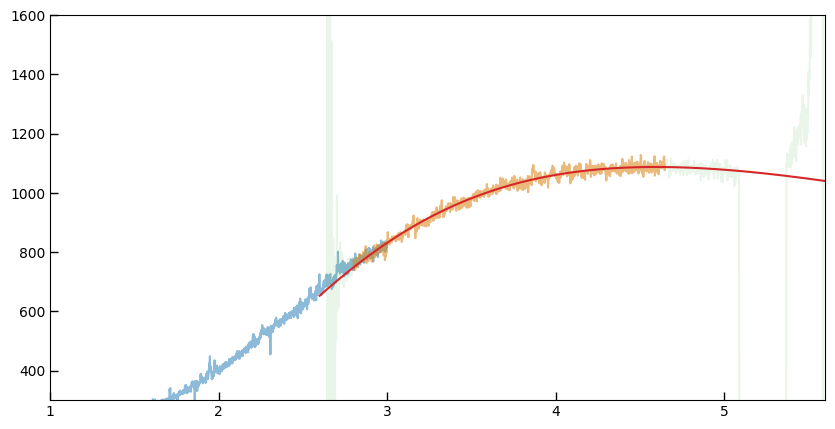

In [945]:
# plt.plot(sp['wave'], sp['flux'] / fflat['sensitivity'])

filt = 'f100lp'

files = glob.glob(f'fs_3786*{filt}*spec.fits')
files.sort()

for i, file in enumerate(files):
    if filt == 'f100lp':
        spr = msaexp.spectrum.SpectrumSampler(file.replace('g140m-f100lp', 'g235m-f170lp'))
        spr2 = msaexp.spectrum.SpectrumSampler(file.replace('g140m-f100lp', 'g395m-f290lp'))
    else:
        spr = msaexp.spectrum.SpectrumSampler(file.replace('g235m-f170lp', 'g395m-f290lp'))

    inst_key = f"{spr2.meta['FILTER']}_{spr2.meta['GRATING']}"
    fflat_file = f"{sens_prefix}_sensitivity_{inst_key}.fits"
    fflatr2 = utils.read_catalog(fflat_file)

    inst_key = f"{spr.meta['FILTER']}_{spr.meta['GRATING']}"
    fflat_file = f"{sens_prefix}_sensitivity_{inst_key}.fits"
    fflatr = utils.read_catalog(fflat_file)

    sp = msaexp.spectrum.SpectrumSampler(file)
    inst_key = f"{sp.meta['FILTER']}_{sp.meta['GRATING']}"
    fflat_file = f"{sens_prefix}_sensitivity_{inst_key}.fits"
    fflat = utils.read_catalog(fflat_file)
    
    if i == 2:
        break
        
fig, ax = plt.subplots(1,1,figsize=(10,5))

okr = spr.valid & (spr['wave'] < 3.0)
plt.plot(spr['wave'][okr], (spr['flux'] / fflatr['sensitivity'])[okr], alpha=0.5)

okr2 = spr2.valid & (spr2['wave'] > 2.8) & (spr2['wave'] < 1.55*3)
plt.plot(spr2['wave'][okr2], (spr2['flux'] / fflatr2['sensitivity'])[okr2], alpha=0.5)
plt.plot(spr2['wave'], (spr2['flux'] / fflatr2['sensitivity']), alpha=0.1)
plt.ylim(0, 1000)

from astropy.modeling.models import BlackBody

bb = BlackBody(1110*u.K)
bbf = (bb(spr2['wave']*u.micron)*1*u.sr).to(u.microJansky, equivalencies=u.spectral_density(spr2['wave']*u.micron))
norm_bb = (bbf * spr2['flux'] / fflatr2['sensitivity'])[okr2].sum() / (bbf**2)[okr2].sum()
print(norm_bb)
bbf *= norm_bb

bb_models[i] = (bb.temperature, norm_bb)

plt.plot(spr2['wave'], bbf)
plt.ylim(300, 1600); plt.xlim(1.0, 5.6)

fill f290lp second order from f170lp
fill f290lp second order from f170lp
fill f290lp second order from f170lp


(0.5, 1.5)

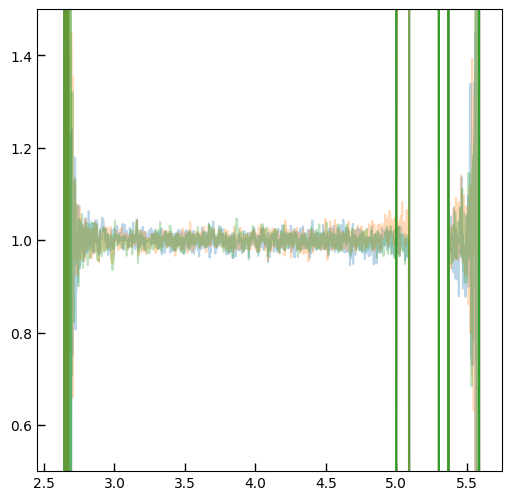

In [946]:

filt = 'f100lp'
filt = 'f170lp'
filt = 'f290lp'

files = glob.glob(f'fs_3786*{filt}*spec.fits')
# files += glob.glob('fs_1189*f100*spec.fits')

# files = glob.glob('fs_3786*f170lp*spec.fits')

files.sort()

Sdata = []
Odata = []
O3data = []
Fdata = []
Wdata = []
Mdata = []
Edata = []

for i, file in enumerate(files):
    if filt == 'f100lp':
        spr = msaexp.spectrum.SpectrumSampler(file.replace('g140m-f100lp', 'g235m-f170lp'))
        spr2 = msaexp.spectrum.SpectrumSampler(file.replace('g140m-f100lp', 'g395m-f290lp'))
    elif filt == 'f170lp':
        spr = msaexp.spectrum.SpectrumSampler(file.replace('g235m-f170lp', 'g395m-f290lp'))
    else:
        spr = msaexp.spectrum.SpectrumSampler(file.replace('g395m-f290lp', 'g235m-f170lp'))
    
    inst_key = f"{spr2.meta['FILTER']}_{spr2.meta['GRATING']}"
    fflat_file = f"{sens_prefix}_sensitivity_{inst_key}.fits"
    fflatr2 = utils.read_catalog(fflat_file)

    inst_key = f"{spr.meta['FILTER']}_{spr.meta['GRATING']}"
    fflat_file = f"{sens_prefix}_sensitivity_{inst_key}.fits"
    fflatr = utils.read_catalog(fflat_file)

    sp = msaexp.spectrum.SpectrumSampler(file)
    inst_key = f"{sp.meta['FILTER']}_{sp.meta['GRATING']}"
    fflat_file = f"{sens_prefix}_sensitivity_{inst_key}.fits"
    fflat = utils.read_catalog(fflat_file)

    spri = np.interp(sp['wave'], spr['wave'], spr['flux'] / fflatr['sensitivity'])

    # Fill with a blackbody model
    bb = BlackBody(bb_models[i][0].value*u.K)
    bbf = (bb(sp['wave']*u.micron)*1*u.sr).to(u.microJansky, equivalencies=u.spectral_density(sp['wave']*u.micron))
    bbf *= bb_models[i][1]
    fill = sp['wave'] > 2.9
    spri[fill] = bbf[fill]
    
    fflat['sensitivity_2'] *= 1.

    if filt == 'f290lp':
        if 'RESET2' not in fflat.meta:
            print('reset f290lp sensitivity_2')
            fflat['sensitivity_2'] = np.nanmax(fflat['sensitivity_2'])*1.
        
    extra3 = sp['wave']*0.
    if 'sensitivity_3' in fflat.colnames:
        sub3 = (sp['wave'] > sp['wave'][sp.valid].min()*3) & (sp.valid)
        extra3[sub3] += np.interp(
            sp['wave'],
            sp['wave'][sp.valid]*3,
            (sp['flux'] * fflat['sensitivity_3'] / fflat['sensitivity'])[sp.valid],
            left=0, right=0
        )[sub3]

    # fflat['sensitivity'][fflat['wavelength'] > 2.2] *= 1.2
    # fflat['sensitivity_2'][fflat['wavelength'] > 2.2/2] /= 1

    extra = sp['wave']*0
    sub2 = (sp['wave'] > sp['wave'][sp.valid].min()*2) & (sp.valid)
    extra[sub2] += np.interp(
        sp['wave'],
        sp['wave'][sp.valid]*2,
        (sp['flux'] * fflat['sensitivity_2'] / fflat['sensitivity'])[sp.valid],
        left=0, right=0
    )[sub2]

    if filt == 'f290lp':
        sub2 = ~sub2 & (sp['wave'] > 5.0)
        print('fill f290lp second order from f170lp')
        
        extra[sub2] += np.interp(
            sp['wave'],
            spr['wave'][spr.valid]*2,
            (spr['flux'] * fflatr['sensitivity_2'] / fflatr['sensitivity'])[spr.valid],
            left=0, right=0
        )[sub2]


    pl = plt.plot(sp['wave'], sp['flux'] / fflat['sensitivity'], alpha=0.5)
    plt.plot(sp['wave'], spri, color=pl[0].get_color())
    # plt.plot(sp['wave'], ((sp['flux'] - extra3) / fflat['sensitivity']) - spri, color=pl[0].get_color(), alpha=0.3)

    plt.plot(sp['wave'], ((sp['flux'] - extra3 - extra) / fflat['sensitivity'] / spri), color=pl[0].get_color(), alpha=0.3)

    # plt.plot(sp['wave'], ((sp['flux'] - extra3) / fflat['sensitivity']) / spri * 200, color=pl[0].get_color(), alpha=0.3)
    plt.plot(sp['wave'], (extra) / fflat['sensitivity'], color=pl[0].get_color())
    # plt.plot(sp['wave'], extra3 / fflat['sensitivity'], color=pl[0].get_color())

    Sdata.append(spri * fflat['sensitivity'])
    Wdata.append(sp['wave']*1)
    Odata.append(extra)
    O3data.append(extra3)
    Fdata.append(sp['flux'])
    Mdata.append(sp.valid)
    Edata.append(sp['full_err'])
    
Sdata = np.array(Sdata).flatten()
Odata = np.array(Odata).flatten()
O3data = np.array(O3data).flatten()
Fdata = np.array(Fdata).flatten()
Wdata = np.array(Wdata).flatten()
Mdata = np.array(Mdata).flatten()
Edata = np.array(Edata).flatten()

plt.ylim(100, 300)

# plt.xlim(2, 3.3)

plt.ylim(0.5, 1.5)

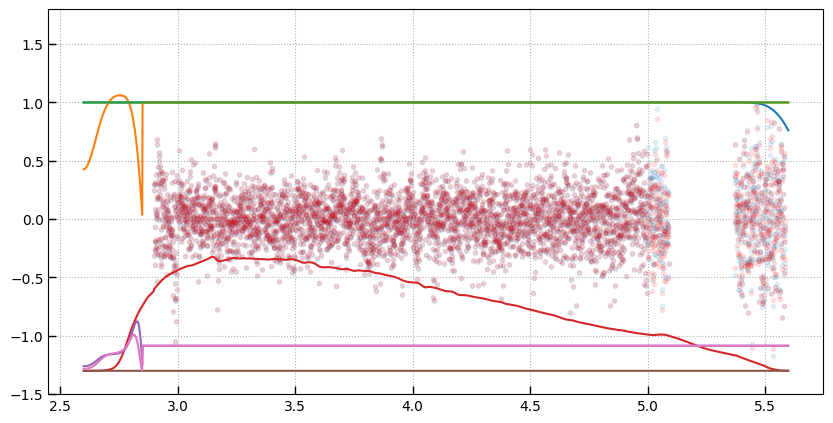

In [947]:
fig, ax = plt.subplots(1,1,figsize=(10,5))

if filt == 'f290lp':
    Rdata = (Fdata - (Sdata + Odata))
    O3data = Fdata*0.
    
else:
    Rdata = (Fdata - (Sdata + Odata + O3data))
    
wstep = fflat['wavelength'] #np.linspace(1.5, 3.1, 1024)

if filt == 'f100lp':
    minmax = (1.6, 3.25)
    dfs = 5

    minmax = (1.6, 3.3)
    dfs = 13

    Mdata &= (Wdata > 1.5) & (Wdata < 3.3)
    
    Mdata &= np.abs(Rdata/Edata)/2 < 3
    
    # Keep red bump of Order 2
    wbump = 2.8
    Fdata[Wdata > wbump] -= Odata[Wdata > wbump]
    Odata[Wdata > wbump] = 0.

    minmax2 = (0.94*2, wbump)

    dfo = 7

    splo = utils.bspline_templates(Wdata, df=dfo,  minmax=minmax2, get_matrix=True)
    xsplo = utils.bspline_templates(wstep*2, df=dfo, minmax=minmax2, get_matrix=True)

    spls = utils.bspline_templates(Wdata, df=dfs,  minmax=minmax, get_matrix=True)
    xspls = utils.bspline_templates(wstep, df=dfs, minmax=minmax, get_matrix=True)


elif filt == 'f170lp':

    minmax = (2.7, 5.4)
    minmax2 = (1.55*2, 2.35*2)
    dfo = 5
    dfs = 51

    Mdata &= np.isfinite(Fdata + Sdata + Odata + O3data)
    Mdata &= np.abs(Rdata) < 100

    Mdata &= np.abs(Rdata/Edata)/2 < 3

    Mdata &= (Wdata > 1.5) & (Wdata < minmax[1])

    splo = utils.bspline_templates(Wdata, df=dfo,  minmax=minmax2, get_matrix=True)
    xsplo = utils.bspline_templates(wstep*2, df=dfo, minmax=minmax2, get_matrix=True)

    spls = utils.bspline_templates(Wdata, df=dfs,  minmax=minmax, get_matrix=True)
    xspls = utils.bspline_templates(wstep, df=dfs, minmax=minmax, get_matrix=True)

    # Split
    minmax_split = [(2.7, 3.7), (3.7, 5.4)]
    dfs_split = [9, 31]
    spls = np.hstack([
        utils.bspline_templates(Wdata, df=df_,  minmax=minmax_, get_matrix=True)
        for (df_, minmax_) in zip(dfs_split, minmax_split)
    ])
    xspls = np.hstack([
        utils.bspline_templates(wstep, df=df_,  minmax=minmax_, get_matrix=True)
        for (df_, minmax_) in zip(dfs_split, minmax_split)
    ])    

else:
    minmax = (2.9, 5.7)
    dfs = 13

    Mdata &= (Wdata > 2.9) & (Wdata < 5.7)
    
    Mdata &= np.abs(Rdata/Edata)/2 < 30
    
    # # Keep red bump of Order 2
    # wbump = 2.8
    # Fdata[Wdata > wbump] -= Odata[Wdata > wbump]
    # Odata[Wdata > wbump] = 0.

    minmax2 = (2.5*2, 5.7)

    dfo = 7

    splo = utils.bspline_templates(Wdata, df=dfo,  minmax=minmax2, get_matrix=True)
    xsplo = utils.bspline_templates(wstep*2, df=dfo, minmax=minmax2, get_matrix=True)

    spls = utils.bspline_templates(Wdata, df=dfs,  minmax=minmax, get_matrix=True)
    xspls = utils.bspline_templates(wstep, df=dfs, minmax=minmax, get_matrix=True)

plt.scatter(Wdata[Mdata], Rdata[Mdata]/Edata[Mdata]/3, alpha=0.1)

A = np.vstack([splo.T * Odata, spls.T * Sdata, O3data[None,:]])
Ax = A / Edata
yx = Fdata / Edata

coeffs = nnls(Ax[:,Mdata].T, yx[Mdata])

model = A.T.dot(coeffs[0])
plt.scatter(Wdata[Mdata], (Fdata - model)[Mdata]/Edata[Mdata]/3, color='r', alpha=0.1)

scale_order1 = xspls.dot(coeffs[0][dfo:-1])
scale_order2 = xsplo.dot(coeffs[0][:dfo])
scale_order3 = np.ones(len(wstep)) * coeffs[0][-1:]

scale_order1[scale_order1 == 0] = 1.
scale_order2[scale_order2 == 0] = 1.
# if filt == 'f100lp':
#     scale_order2[wstep > 1.4] = 1.

scale_order3[scale_order3 == 0] = 1.

plt.plot(wstep, scale_order1, label='scale sensitivity_1')
plt.plot(wstep, scale_order2, label='scale sensitivity_2')
plt.plot(wstep, scale_order3, label='scale sensitivity_1')
plt.grid()

plt.plot(wstep, fflat['sensitivity']-1.3)
plt.plot(wstep, fflat['sensitivity_2']*10-1.3)
plt.plot(wstep, fflat['sensitivity_3']*30-1.3)

fflat = utils.read_catalog(fflat_file)
if filt == 'f290lp':
    if 'RESET2' not in fflat.meta:
        print('reset f290lp sensitivity_2')
        fflat['sensitivity_2'] = np.nanmax(fflat['sensitivity_2'])*1.

fflat.meta['RESET2'] = True

fflat['sensitivity'][scale_order1 > 0] *= scale_order1[scale_order1 > 0]
fflat['sensitivity_2'][scale_order2 > 0] *= scale_order2[scale_order2 > 0]
plt.plot(wstep, fflat['sensitivity_2']*10-1.3)

fflat['sensitivity_3'][scale_order3 > 0] *= scale_order3[scale_order3 > 0]
plt.ylim(-1.5, 1.8)

# plt.ylim(-3, 5.2)

if 0:
    fflat.write(fflat_file, overwrite=True)


# Show all

In [ ]:
out_prefix, slit_name

In [ ]:
files = glob.glob(f'{out_prefix}*{slit_name}*sens*[MH].fits')
files.sort()

for f in files:
    print(f)
    sens = utils.read_catalog(f)
    plt.plot(sens["wavelength"], sens["sensitivity"], label=f)

plt.legend()

plt.ylim(0, 1.4)

## PRISM direct for P330E

In [923]:
out_prefix, slit_name, ctempl

('p330e',
 's1600a1',
 <class 'eazy.templates.Template'>: CALSPEC 1808347_mod_005)

p330e_s1600a1_sensitivity_CLEAR_PRISM.fits


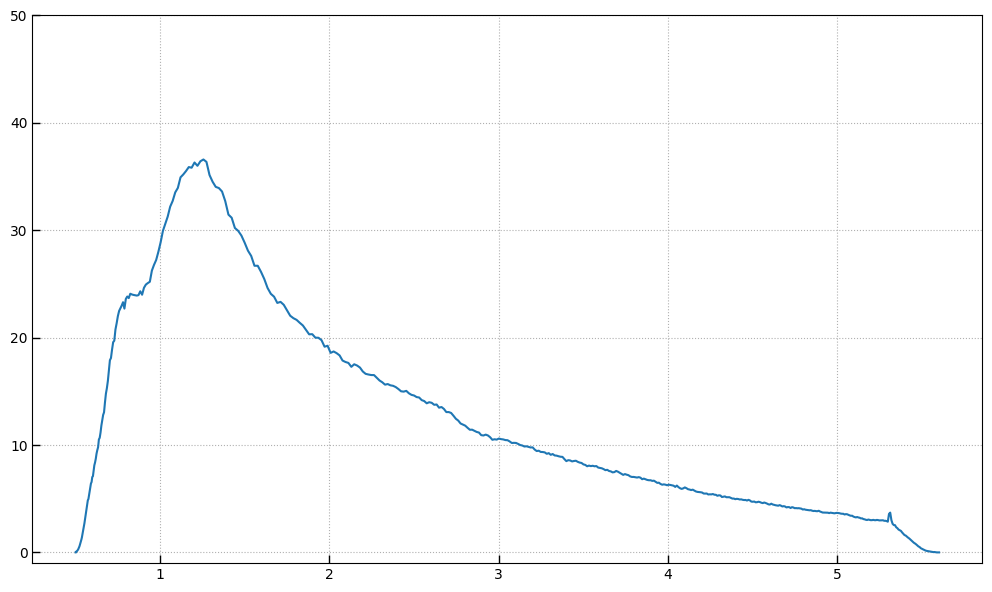

In [930]:
# pri = fs_spectra['PRISM-CLEAR']

if 1:    
    pri = msaexp.spectrum.SpectrumSampler('fs_1128_prism-clear_1808347_s1600a1.spec.fits')
    out_prefix = 'tyc4433'

    pri = msaexp.spectrum.SpectrumSampler('fs_1538_prism-clear_p330e_s1600a1.spec.fits')
    out_prefix = 'p330e'

else:
    pri = fs_spectra['PRISM-CLEAR']

if out_prefix == 'tyc4433':
    ctempl = ctempl_tyc4433
elif out_prefix == 'p330e':
    ctempl = ctempl_p330e

calspec_rebin = pri.resample_eazy_template(ctempl, include_igm=False, scale_disp=1.5, velocity_sigma=1)

fig, ax = plt.subplots(1,1,figsize=(10,6))

plt.plot(pri["wave"], pri["flux"] / calspec_rebin)

tab = utils.GTable()
tab["wavelength"] = pri["wave"]
tab["sensitivity"] = pri["flux"] / calspec_rebin

inst_key = f"{pri.meta['FILTER']}_{pri.meta['GRATING']}"

out_file = f'{out_prefix}_{slit_name}_sensitivity_{inst_key}.fits'
print(out_file)
tab.write(out_file, overwrite=True)

ax.grid()
ax.set_ylim(-1, 50)

fig.tight_layout(pad=1)

fig.savefig(out_file.replace('.fits','.png'))

In [938]:
slit_ratio = utils.read_catalog('tyc4433_s200a1_slit_loss.fits')
slit_ratio

wave,slit_loss
float64,float64
0.4,0.8281258641843654
0.41056751467710373,0.8279053800376514
0.42113502935420744,0.827685818560024
0.43170254403131114,0.8274671681152161
0.4422700587084149,0.8272494170070562
0.4528375733855186,0.8270325534794684
0.4634050880626223,0.8268165657164723
0.473972602739726,0.8266014418421836
0.4845401174168298,0.8263871699208135


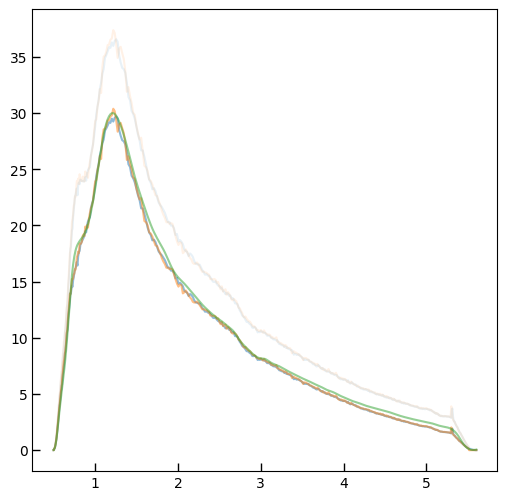

In [941]:
sens_p330e = utils.read_catalog('p330e_s1600a1_sensitivity_CLEAR_PRISM.fits')
sens_tyc = utils.read_catalog('tyc4433_s1600a1_sensitivity_CLEAR_PRISM.fits')
ngc = utils.read_catalog('ngc2506_sensitivity_NRS1_CLEAR_PRISM.fits')

det_ratio = utils.read_catalog('ngc2506_sensitivity_ratio_CLEAR_PRISM.fits')

slit_ratio = utils.read_catalog('tyc4433_s200a1_slit_loss.fits')

slit_ratio_interp = np.interp(sens_p330e['wavelength'], slit_ratio['wave'], slit_ratio['slit_loss'])

pl = plt.plot(sens_p330e['wavelength'], sens_p330e['sensitivity'], alpha=0.1)
pl = plt.plot(sens_p330e['wavelength'], sens_p330e['sensitivity']*slit_ratio_interp, alpha=0.5, color=pl[0].get_color())
pl = plt.plot(sens_tyc['wavelength'], sens_tyc['sensitivity'], alpha=0.1)
pl = plt.plot(sens_tyc['wavelength'], sens_tyc['sensitivity']*slit_ratio_interp, alpha=0.5, color=pl[0].get_color())

plt.plot(ngc['wavelength'], ngc['sensitivity'], alpha=0.5)

sens_p330e['sensitivity'] *= slit_ratio_interp
sens_p330e.write('tyc4433_s200a1_sensitivity_CLEAR_PRISM.fits', overwrite=True)

## PRISM from 1493 NGC2506

In [ ]:
ctempl = ctempl_ngc2506
                                 
calspec_label = ctempl.name


files = glob.glob('fs_1493*spec.fits')
print(files)
fig, axes = plt.subplots(2,1,figsize=(10,6), sharex=True)

ax = axes[0]

mode = 'MSASPEC'
# mode = 'FIXEDSLIT'

filter = 'CLEAR'

fcorr = {}

for det in ['NRS1','NRS2']:
    sflat_file = glob.glob(f'*sflat*{mode}*{filter}*{det}*fits')[0]
    sf = utils.read_catalog(sflat_file)[0]

    dflat_file = glob.glob(f'*dflat*{det}*fits')[0]
    df = utils.read_catalog(dflat_file)[0]
    dfo = df["wavelength"] > 0
    
    sf["data"] /= 5.e-10
    sfo = sf['wavelength'] > 0
    
    for i in range(1):
        fflat_file = glob.glob(f'*fflat*{mode}*{filter}*{i+1}*fits')[0]
        # print(sflat_file, fflat_file)
        ff = utils.read_catalog(fflat_file)[0]
        ff["data"] /= 2.e20
        ffo = ff['wavelength'] > 0

        pixarr_sr = 1. #4.8e-13
        
        sfi = np.interp(ff['wavelength'], sf['wavelength'][sfo], sf['data'][sfo])
        dfi = np.interp(ff['wavelength'], df['wavelength'][dfo], df['data'][dfo])
        sfi *= dfi
        
        # plt.plot(ff['wavelength'][ffo], (ff['data']*sfi * pixarr_sr)[ffo], label=f"{filter} {det} {i+1}", alpha=0.5)
        # plt.plot(ff['wavelength'], ff['data'], label=f"{filter} {det} {i+1}", alpha=0.5)
        # plt.plot(sf['wavelength'], sf['data'], label=f"{filter} {det} {i+1}", alpha=0.5)

        fcorr[det] = (ff['wavelength'][ffo]*1., (ff['data']*sfi * pixarr_sr)[ffo]*1.)

        ax.plot(*fcorr[det], label='CRDS ' + det)

axes[0].plot(ff["wavelength"], dfi*15, color='olive', label='D-flat')
        
det_data = {'NRS1': [], 'NRS2': []}

for file in files:
    sp = msaexp.spectrum.SpectrumSampler(file)

    model = sp.resample_eazy_template(ctempl, z=0, scale_disp=1.5, velocity_sigma=1)
    
    if 'nrs1' in sp.meta['FILENAME']:
        det = 'NRS1'
        color='b'
    else:
        det = 'NRS2'
        color = 'r'

    fcx = fcorr[det]
    fci = np.interp(sp["wave"], fcx[0], fcx[1], left=np.nan, right=np.nan)

    # ax.plot(sp["wave"], fci)
    
    det_data[det].append([sp["wave"], sp["flux"], model, sp.valid])
    
    ax.plot(sp["wave"], sp["flux"] / model, alpha=0.2, color=color)

# sens = utils.read_catalog('fix_p330e_s1600a1_sensitivity_CLEAR_PRISM.fits')
# # sens = utils.read_catalog('j1743045_s1600a1_sensitivity_CLEAR_PRISM.fits')

# ax.plot(sens["wavelength"], sens["sensitivity"], color='k', alpha=0.5)

det_model = {}

for det, color in zip(det_data, ['b','r']):
    w, f, m, valid = np.hstack(det_data[det])
    so = np.argsort(w)
    ok = (valid[so] > 0) & np.isfinite(f/m)[so] & (f[so] > 0)
    
    bspl = utils.bspline_templates(w[so], df=71, get_matrix=True)
    c = np.linalg.lstsq(bspl[ok,:], (f/m)[so][ok], rcond=None)
    model = bspl.dot(c[0])
    ax.plot(w[so], model, color=color, alpha=0.8, lw=2, label=det)

    model[w[so] < w[so][ok].min()] = 0
    
    det_model[det] = (w[so], model)
    print(det, len(w))

    axes[1].scatter(w[so][ok], ((f/m)[so] / model)[ok], color=color, alpha=0.1)
    
    mtab = utils.GTable()
    mtab['wavelength'] = w[so]
    mtab['sensitivity'] = model
    mtab.write(f'ngc2506_sensitivity_{det}_CLEAR_PRISM.fits', overwrite=True)
    
axes[1].plot(w[so], det_model['NRS1'][1] / det_model['NRS2'][1], color='olive', label='NRS1/NRS2')

mtab["nrs1_nrs2"] =  det_model['NRS1'][1] / det_model['NRS2'][1]
mtab.write(f'ngc2506_sensitivity_ratio_CLEAR_PRISM.fits', overwrite=True)

ax.legend()
axes[1].legend()

axes[1].set_ylim(0.7, 1.3)

ax.set_ylim(0, 35)

# plt.xlim(0, 2)
# plt.ylim(0, 3)

# plt.xlim(0.8, 1.2)

# plt.xlim(4, 5.7)

# plt.xlim(2.5, 5.7); axes[0].set_ylim(0, 10)

for ax in axes:
    ax.grid()
    
fig.tight_layout(pad=1)

# ax.set_xlim(0.4, 1.8)


## PRISM

Scale prism to gratings for BD

In [ ]:
fs_spectra = {}

fs_files = glob.glob(f'fs_{prog}*a1.spec.fits')
fs_files.sort()

for file in fs_files:

    if (prog == 1128) & ('prism' in file.lower()):
        continue
    
    sp = msaexp.spectrum.SpectrumSampler(file)
    k = f'{sp.meta["GRATING"]}-{sp.meta["FILTER"]}'
    print(file, k)
    fs_spectra[k] = sp

    # orig_spectra[k] = msaexp.spectrum.SpectrumSampler(file.replace('ext_','redo_'))
                                          
fs_spectra.keys()

In [ ]:
pri = fs_spectra['PRISM-CLEAR']

spec = fs_spectra

ratio = pri['flux']*0

for k in spec:
    if 'PRISM' in k:
        continue

    inst_key = f"{spec[k].meta['FILTER']}_{spec[k].meta['GRATING']}"
    print(inst_key)
    fflat = utils.read_catalog(f"{out_prefix}_sensitivity_{inst_key}.fits")
    sens = np.interp(spec[k]["wave"], fflat["wavelength"], fflat["sensitivity"])
    corr = spec[k]["flux"]/sens
    corr[~np.isfinite(corr)] = 0
    # plt.plot(spec[k]["wave"], corr, label=k)

    ctempl = eazy.templates.Template(arrays=(spec[k]["wave"]*1.e4, corr * (spec[k]["wave"]*1.e4)**-2 * 3e18))
    calspec_rebin = pri.resample_eazy_template(ctempl, include_igm=False, scale_disp=1.8, velocity_sigma=1)

    ok = (pri["wave"] < spec[k]["wave"].min()*2.) & (calspec_rebin > 0) & pri.valid
    ok &= nd.binary_erosion(ok, iterations=3)
    plt.plot(pri["wave"][ok], pri["flux"][ok] / calspec_rebin[ok], label=k)

    ratio[ok] = pri["flux"][ok] / calspec_rebin[ok]

if 0:
    ext = utils.read_catalog("extended_sensitivity_CLEAR_PRISM.fits")
    plt.plot(ext["wavelength"], ext["sensitivity"])
    si = np.interp(pri["wave"], ext["wavelength"], ext["sensitivity"])
    # plt.plot(pri["wave"], pri["flux"] / 20, label=k, alpha=0.5)
    plt.plot(pri["wave"], pri["flux"] / si / 10, label=k)
else:
    ext = utils.read_catalog("extended_sensitivity_CLEAR_PRISM.fits")
    plt.plot(ext["wavelength"], ext["sensitivity"]*10)

plt.ylim(0, 30)
    # plt.plot(pri["wave"], pri["flux"] / calspec_rebin, label=k)

plt.xlim(0.5, 5.5)

# plt.ylim(0, 50)

In [ ]:
okr = (ratio > 0) & (ratio < 28)

ext = utils.read_catalog("extended_sensitivity_CLEAR_PRISM.fits")
ext = np.interp(pri["wave"], ext["wavelength"], ext["sensitivity"])

# plt.plot(ext["wavelength"], ext["sensitivity"]*10)

bspl = utils.bspline_templates(pri["wave"], df=5, get_matrix=True)
coeffs = np.linalg.lstsq((bspl.T*ext).T[okr], ratio[okr])
model = (bspl.T*ext).T.dot(coeffs[0])

plt.plot(pri["wave"], model)

tab = utils.GTable()
tab["wavelength"] = pri["wave"]
tab["sensitivity"] = model

out_file = f'wd_sensitivity_CLEAR_PRISM.fits'
print(out_file)
tab.write(out_file, overwrite=True)



## Slit loss from ratio of s200 to s1600

In [950]:
prf = msaexp.slit_combine.LOOKUP_PRF

prf.psf_slit_loss.shape, prf.psf_wave

((64, 28, 16),
 array([0.5       , 0.6       , 0.67222222, 0.74444444, 0.81666667,
        0.88888889, 0.96111111, 1.03333333, 1.15      , 1.19333333,
        1.23666667, 1.28      , 1.32333333, 1.36666667, 1.41      ,
        1.45333333, 1.49666667, 1.54      , 1.58333333, 1.62666667,
        1.67      , 1.71333333, 1.75666667, 1.8       , 1.95      ,
        2.07903226, 2.19354839, 2.30806452, 2.42258065, 2.53709677,
        2.6516129 , 2.76612903, 2.88064516, 2.99516129, 3.        ,
        3.1       , 3.18285714, 3.26571429, 3.34857143, 3.43142857,
        3.51428571, 3.59714286, 3.68      , 3.76285714, 3.84571429,
        3.92857143, 4.01142857, 4.09428571, 4.17714286, 4.26      ,
        4.34285714, 4.42571429, 4.50857143, 4.59142857, 4.67428571,
        4.75714286, 4.84      , 4.92285714, 5.00571429, 5.08857143,
        5.17142857, 5.42      , 5.50285714, 5.58571429]))

fs_1128_g140m-f070lp_1808347_s200a1.spec.fits
fs_1128_g235m-f170lp_1808347_s200a1.spec.fits
fs_1128_g395m-f290lp_1808347_s200a1.spec.fits
Initialize LookupTablePSF({'psf_file': 'nirspec_prism_clear_s200a1_exp_psf_lookup.fits'})
Initialize LookupTablePSF({'psf_file': 'nirspec_prism_clear_s1600a1_exp_psf_lookup.fits'})


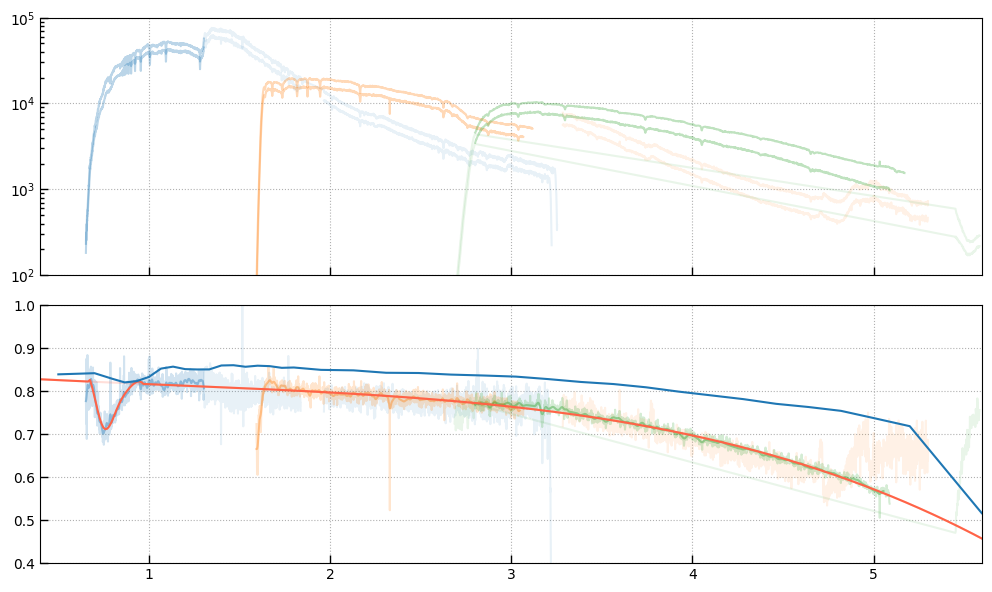

In [975]:
import scipy.ndimage as nd

fig, axes = plt.subplots(2,1,figsize=(10,6), sharex=True)

slit_files = glob.glob('fs_1128_g*-*s200a1.spec.fits')
# slit_files = glob.glob('fs_1538_g*-*s200a1.spec.fits')

# slit_files += glob.glob('fs_1492_g*s200a1.spec.fits')

xdata = []
ydata = []

for slit_file in slit_files:
    if 'h-f' in slit_file:
        continue
        
    print(slit_file)
    sp_slit = utils.read_catalog(slit_file)
    try:
        sp_full = utils.read_catalog(slit_file.replace('s200','s1600'))
    except FileNotFoundError:
        continue

    trim = sp_full["flux"] > np.nanpercentile(sp_full["flux"][sp_full["flux"] > 0], 80)*0.005
    sp_slit = sp_slit[trim]
    sp_full = sp_full[trim]
    
    if 'x100lp' in slit_file:
        clip = sp_slit["flux"] > 0
    else:
        clip = sp_slit["wave"] < sp_slit["wave"][sp_slit["flux"] > 0].min()*2

    if '395' in slit_file:
        clip &= sp_slit["wave"] > 2.8
        
    pl = axes[0].plot(sp_slit["wave"][clip], sp_slit["flux"][clip], label=slit_file, alpha=0.3)
    axes[0].plot(sp_slit["wave"][~clip], sp_slit["flux"][~clip], alpha=0.1, color=pl[0].get_color())
    axes[0].plot(sp_slit["wave"][clip], sp_full["flux"][clip], alpha=0.3, color=pl[0].get_color())
    axes[0].plot(sp_slit["wave"][~clip], sp_full["flux"][~clip], alpha=0.1, color=pl[0].get_color())
    axes[1].plot(sp_slit["wave"][clip], (sp_slit["flux"] / sp_full["flux"])[clip], color=pl[0].get_color(), alpha=0.2)
    axes[1].plot(sp_slit["wave"][clip], nd.gaussian_filter1d(sp_slit["flux"] / sp_full["flux"], 5)[clip], color=pl[0].get_color(), alpha=0.4)
    axes[1].plot(sp_slit["wave"][~clip], (sp_slit["flux"] / sp_full["flux"])[~clip], color=pl[0].get_color(), alpha=0.1)

    xdata.append(sp_slit["wave"][clip])
    ydata.append((sp_slit["flux"] / sp_full["flux"])[clip])

xdata = np.hstack(xdata)
ydata = np.hstack(ydata).data

xdata = xdata[np.isfinite(ydata)]
ydata = ydata[np.isfinite(ydata)]

bump = (xdata < 0.98) & (xdata > 0.67)
poly_degree = 4
c = np.polyfit(xdata[~bump], ydata[~bump], poly_degree)
xf = np.linspace(0.4, 5.8, 512)
ax = axes[1]
cmodel = np.polyval(c, xf)

ax.plot(xf, cmodel, color='tomato', alpha=0.2)

if (bump).sum() > 0:
    bspl = utils.bspline_templates(xdata[bump], df=7, minmax=(xdata[bump].min(), xdata[bump].max()), get_matrix=True)
    cb = np.linalg.lstsq(bspl, ydata[bump], rcond=None)
    xbspl = utils.bspline_templates(xf, df=7, minmax=(xdata[bump].min(), xdata[bump].max()), get_matrix=True)
    bmodel = xbspl.dot(cb[0])
    cmodel[bmodel > 0] = bmodel[bmodel > 0]
    
    ax.plot(xf, cmodel, color='tomato')

slit_loss = utils.GTable()
slit_loss.meta['poly_degree'] = (poly_degree, 'Polynomial degree')

slit_loss['wave'] = xf
slit_loss['slit_loss'] = cmodel
slit_loss.write('tyc4433_s200a1_slit_loss.fits', overwrite=True)
    
for ax in axes:
    ax.set_xlim(0.5, 5.8)
    ax.grid()
    
axes[0].set_ylim(100, 1e5)
axes[0].semilogy()

prf = msaexp.slit_combine.set_lookup_prf(psf_file='nirspec_prism_clear_s200a1_exp_psf_lookup.fits')
prf2 = msaexp.slit_combine.set_lookup_prf(psf_file='nirspec_prism_clear_s1600a1_exp_psf_lookup.fits')

axes[1].plot(prf.psf_wave, prf.psf_slit_loss[:,0,0])
# axes[1].plot(prf.psf_wave, prf.psf_slit_loss[:,0,0] * prf2.psf_slit_loss[:,0,0])
# axes[1].plot(prf.psf_wave, prf2.psf_slit_loss[:,0,0])

if 0:
    files = glob.glob('tyc4433_s200a1_sensitivity*_G*M.fits')
    for file in files:
        s200 = utils.read_catalog(file)
        s1600 = utils.read_catalog(file.replace('s200','s1600'))
        print(len(s200), len(s1600), file)
        ok = s200['wavelength'] < 5*(s200['wavelength'].min())
        
        axes[1].plot(s200['wavelength'][ok], (s200['sensitivity'] / s1600['sensitivity'])[ok] * 1.e0, color='magenta', alpha=0.5, zorder=1000, lw=3)

# ax.set_xlim(0.4, 1.5)
ax.set_ylim(0.4, 1.)
# ax.set_xlim(0.5, 2)
ax.set_xlim(0.4, 5.6)

fig.tight_layout(pad=1)
# ax.semilogx()


fs_1128_g140m-f070lp_1808347_s200a1.spec.fits
fs_1128_g235m-f170lp_1808347_s200a1.spec.fits
fs_1128_g395m-f290lp_1808347_s200a1.spec.fits
Initialize LookupTablePSF({'psf_file': 'nirspec_prism_clear_s200a1_exp_psf_lookup.fits'})
Initialize LookupTablePSF({'psf_file': 'nirspec_prism_clear_s1600a1_exp_psf_lookup.fits'})


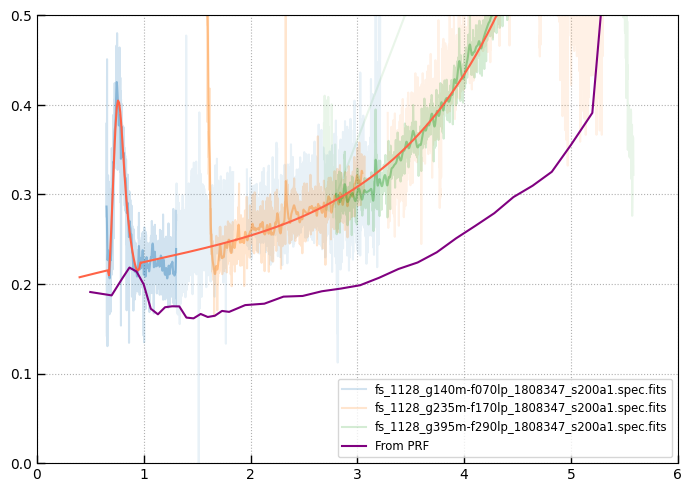

In [979]:
import scipy.ndimage as nd

fig, ax = plt.subplots(1,1,figsize=(7,5))

slit_files = glob.glob('fs_1128_g*-*s200a1.spec.fits')
# slit_files = glob.glob('fs_1538_g*-*s200a1.spec.fits')

# slit_files += glob.glob('fs_1492_g*s200a1.spec.fits')

xdata = []
ydata = []

for slit_file in slit_files:
    if 'h-f' in slit_file:
        continue
        
    print(slit_file)
    sp_slit = utils.read_catalog(slit_file)
    try:
        sp_full = utils.read_catalog(slit_file.replace('s200','s1600'))
    except FileNotFoundError:
        continue

    trim = sp_full["flux"] > np.nanpercentile(sp_full["flux"][sp_full["flux"] > 0], 80)*0.005
    sp_slit = sp_slit[trim]
    sp_full = sp_full[trim]
    
    if 'x100lp' in slit_file:
        clip = sp_slit["flux"] > 0
    else:
        clip = sp_slit["wave"] < sp_slit["wave"][sp_slit["flux"] > 0].min()*2

    if '395' in slit_file:
        clip &= sp_slit["wave"] > 2.8
        
    pl = ax.plot(sp_slit["wave"][clip],  1./(sp_slit["flux"] / sp_full["flux"])[clip] - 1, alpha=0.2, label=slit_file)
    ax.plot(sp_slit["wave"][clip], 1./nd.gaussian_filter1d(sp_slit["flux"] / sp_full["flux"], 5)[clip] - 1, color=pl[0].get_color(), alpha=0.4)
    ax.plot(sp_slit["wave"][~clip], 1./(sp_slit["flux"] / sp_full["flux"])[~clip] - 1, color=pl[0].get_color(), alpha=0.1)

    xdata.append(sp_slit["wave"][clip])
    ydata.append((sp_slit["flux"] / sp_full["flux"])[clip])

# xdata = np.hstack(xdata)
# ydata = np.hstack(ydata).data

# xdata = xdata[np.isfinite(ydata)]
# ydata = ydata[np.isfinite(ydata)]

# bump = (xdata < 0.98) & (xdata > 0.67)
# c = np.polyfit(xdata[~bump], ydata[~bump], poly_degre)
# xf = np.linspace(0.4, 5.8, 512)

# # cmodel = np.polyval(c, xf)

# # ax.plot(xf, 1. - 1./cmodel, color='tomato', alpha=0.2)

# if (bump).sum() > 0:
#     bspl = utils.bspline_templates(xdata[bump], df=7, minmax=(xdata[bump].min(), xdata[bump].max()), get_matrix=True)
#     cb = np.linalg.lstsq(bspl, ydata[bump], rcond=None)
#     xbspl = utils.bspline_templates(xf, df=7, minmax=(xdata[bump].min(), xdata[bump].max()), get_matrix=True)
#     bmodel = xbspl.dot(cb[0])
#     cmodel[bmodel > 0] = bmodel[bmodel > 0]
    
ax.plot(xf, 1./cmodel - 1, color='tomato')
    
prf = msaexp.slit_combine.set_lookup_prf(psf_file='nirspec_prism_clear_s200a1_exp_psf_lookup.fits')
prf2 = msaexp.slit_combine.set_lookup_prf(psf_file='nirspec_prism_clear_s1600a1_exp_psf_lookup.fits')

ax.plot(prf.psf_wave, 1./prf.psf_slit_loss[:,0,0] - 1, color='purple', label='From PRF')

if 0:
    files = glob.glob('tyc4433_s200a1_sensitivity*_G*M.fits')
    for file in files:
        s200 = utils.read_catalog(file)
        s1600 = utils.read_catalog(file.replace('s200','s1600'))
        print(len(s200), len(s1600), file)
        ok = s200['wavelength'] < 5*(s200['wavelength'].min())
        
        axes[1].plot(s200['wavelength'][ok], (s200['sensitivity'] / s1600['sensitivity'])[ok] * 1.e0, color='magenta', alpha=0.5, zorder=1000, lw=3)

ax.set_ylim(0, 0.5)
ax.set_xlim(0,6)

ax.legend(loc='lower right')
ax.grid()

fig.tight_layout(pad=1)
# ax.semilogx()


### Compare to Jakobsen et al. 

https://www.aanda.org/articles/aa/full_html/2022/05/aa42663-21/F11.html

<img src="https://www.aanda.org/articles/aa/full_html/2022/05/aa42663-21/aa42663-21-fig11.jpg" width=650px>

In [ ]:
xgau = np.linspace(-20,20,1024)
ypi, xpi = np.meshgrid(xgau, xgau)
g2d = np.exp(-(xpi**2 + ypi**2)/2) / np.pi / 2
dx = np.median(np.diff(xgau))
g2d *= dx**2

lim = 1.

sli = np.abs(xpi) <= lim

import scipy.stats
norm = scipy.stats.norm(0,1)

print(g2d.sum(), g2d[sli].sum(), norm.cdf(lim) - norm.cdf(-lim))

plt.imshow(np.log(g2d*sli))